# Import Supporting Libraries

In [1]:
import pandas as pd
import numpy as np

import os

import pathlib

import requests
import seaborn as sns

import scipy

from scipy.stats import linregress

import statsmodels.api as sm

import matplotlib.pyplot as plt
import matplotlib
import matplotlib as mpl

%matplotlib inline

from pylab import rcParams
rcParams['figure.figsize'] = 12, 10
rcParams['pdf.fonttype'] = 42
inline_rc = dict(plt.rcParams)

import platform
import sys

import folium
import pymannkendall as mk

import geopandas as gpd


In [2]:
#import ee
#ee.Authenticate() 
#ee.Initialize()

In [3]:
#import wellapplication as wa

In [4]:
print("Operating System " + platform.system() + " " + platform.release())
print("Python Version " + str(sys.version))
print("Pandas Version " + str(pd.__version__))
print("Numpy Version " + str(np.__version__))
print("Matplotlib Version " + str(mpl.__version__))
#print("Well Application Version " + str(wa.__version__))
print("Scipy Version " +str(scipy.__version__))
print (os.environ['CONDA_DEFAULT_ENV'])

Operating System Windows 10
Python Version 3.11.8 | packaged by conda-forge | (main, Feb 16 2024, 20:40:50) [MSC v.1937 64 bit (AMD64)]
Pandas Version 2.2.2
Numpy Version 1.26.4
Matplotlib Version 3.8.4
Scipy Version 1.13.0
pygis311v4


In [5]:
import importlib.util
spec = importlib.util.spec_from_file_location("dbconnect", "G:/My Drive/Python/dbconnect.py")
dbconnect = importlib.util.module_from_spec(spec)
spec.loader.exec_module(dbconnect)

engine = dbconnect.postconn_ugs()



# Set main directories

In [6]:
main_path = pathlib.Path("G:/Shared Drives/UGS_Groundwater/Projects/Pahvant_Valley/")
figure_dir = main_path / "Writing" / "Figures" / "GEE_out"
raw_dir = main_path / "Pahvant_Basins" / 'Pahvant_Basins6'
parquet_dir = raw_dir / "parquet"
save_place = main_path / "Pahvant_Basins" / "GEE_out" / "byhydrodiv"
gis_path = main_path / "GIS_Pahvant"
#G:\Shared drives\UGS_Groundwater\Projects\Pahvant_Valley\Pahvant_Basins\GEE_out
#save_place = "GEE_Summary_Out"


In [7]:
for file in raw_dir.glob("*.csv"):

    df = pd.read_csv(file)
    df.to_parquet(parquet_dir / str(file.name).replace('csv', 'parquet'))
    print(file.name)

MonthlyGPMPPT.csv
MonthlyPPT.csv
Monthly.csv
MonthlyOpenET.csv
MonthlySMAP.csv
MonthlyPDSI.csv
MonthlyDM.csv
MonthlySMAPv2.csv
MonthlyPPT_1940_1980.csv
MonthlyMODIS8d.csv
MonthlyPML.csv
MonthlyTerraPast.csv


# Define Custom Functions

In [9]:
def bland_altmann(m1, m2, sd_limit=1.96):
    """
    Bland-Altman Plot.

    A Bland-Altman plot is a graphical method to analyze the differences
    between two methods of measurement. The mean of the measures is plotted
    against their difference.

    Parameters
    ----------
    m1, m2: pandas Series or array-like

   Returns
    -------
    ax: matplotlib Axis object
    """

    import numpy as np
    import matplotlib.pyplot as plt

    if len(m1) != len(m2):
        raise ValueError('m1 does not have the same length as m2.')
    if sd_limit < 0:
        raise ValueError('sd_limit ({}) is less than 0.'.format(sd_limit))

    means = np.mean([m1, m2], axis=0)
    diffs = m1 - m2
    mean_diff = np.mean(diffs)
    std_diff = np.std(diffs, axis=0)

    return means, diffs

In [10]:
def scatterColor(x0,y,w):
    """Creates scatter plot with points colored by variable.
    All input arrays must have matching lengths

    Arg:
        x0 (array): 
            array of x values
        y (array): 
            array of y values
        w (array): 
            array of scalar values

    Returns:
        slope and intercept of best fit line
    
    """
    import matplotlib as mpl
    import matplotlib.cm as cm
    cmap = plt.cm.get_cmap('RdYlBu')
    norm = mpl.colors.Normalize(vmin=w.min(), vmax=w.max())
    m = cm.ScalarMappable(norm=norm, cmap=cmap)
    m.set_array(w)
    sc = plt.scatter(x0, y, label='', color = m.to_rgba(w))

    xa = sm.add_constant(x0)

    est = sm.RLM(y, xa).fit()
    r2 = sm.WLS(y, xa, weights=est.weights).fit().rsquared
    slope = est.params[1]

    x_prime = np.linspace(np.min(x0),np.max(x0),100)[:, np.newaxis]
    x_prime = sm.add_constant(x_prime)
    y_hat = est.predict(x_prime)

    const = est.params[0]
    y2 = [i*slope + const for i in x0]

    plt.xlabel('Barometric Pressure (ft water)')
    plt.ylabel('Transducer Pressure (ft water)')
    lin = linregress(x0,y)
    x1 = np.arange(np.min(x0), np.max(x0),0.1)
    y1 = [i*lin[0]+lin[1] for i in x1]
    y2 = [i*slope+const for i in x1]
    plt.plot(x1,y1,c='g',label='simple linear regression m = {:.2f} b = {:.0f}, r^2 = {:.2f}'.format(lin[0],lin[1],lin[2]**2))
    plt.plot(x1,y2,c='r',label='rlm regression m = {:.2f} b = {:.0f}, r2 = {:.2f}'.format(slope,const,r2))
    plt.legend()
    cbar = plt.colorbar(m)

    cbar.set_label('Julian Date')

    return slope,const,r2

def getlutrend(wrluy, crop, irr=None, adj=True):
    """
    wrluy = yearly et by landuse with year as index
    crop = type of landuse; ex 'Corn'
    irr = irr method; ex 'Sprinkler'
    """
    if irr:
        crp = wrluy[wrluy['IRR_Method']==irr].dropna(subset=['et_acft_adj'])
    else:
        crp = wrluy.dropna(subset=['et_acft_adj'])
    if adj:
        crpyr = crp.groupby(['Description',crp.index]).sum().loc[crop,'et_acft_adj'].sort_index()
        #alfyr.plot()
    else:
        crpyr = crp.groupby(['Description',crp.index]).sum().loc[crop,'et_acft'].sort_index()
        #alfyr.plot(color='red')
    return crpyr

def plotlu(crpyr, crop, ylab='ET (acft)', axis=None):
    if axis:
        pass
    else:
        fig, axis = plt.subplots(1,1,figsize=(12,9))
    axis.plot(crpyr.index, crpyr, label=crop)
    plotmk(crpyr, axis)
    axis.set_ylabel(ylab)
    axis.set_title(crop)
    axis.legend(bbox_to_anchor=(1.04,1), loc="upper left")
    
def plotmk(crpyr,axis, units='ac-ft/yr', color=None):
    """This function plots the Mann Kendall trend
    crpyr = crop year
    axis = matplotlib plotting axis
    """
    seas = mk.yue_wang_modification_test(crpyr)
    mklist = [seas.trend, seas.h, seas.p, seas.z, seas.Tau, seas.s, seas.slope, seas.intercept]
    if mklist[1]:
        frst = crpyr.first_valid_index()
        lst = crpyr.last_valid_index()
        x = range(frst,lst)
        lab = f"MK {mklist[-2]:.2f} {units}"
        if color:
            clr = color
        else:            
            if mklist[0] == 'increasing':
                clr = 'red'
            else:
                clr = 'green'
        axis.plot(x,[(i-1985)*mklist[-2]+mklist[-1] for i in x],label=lab,color=clr)

In [11]:
def matchdiv(df, hucbasin):
    """matches dataset to hydro div information and adds hydrodiv information
    df = dataset
    hucbasin = huc geodataframe
    """
    df['huc_ind'] = df['system:index'].apply(lambda x: x.split("_")[0][-5:],1)
    df = df.set_index('huc_ind')
    match_dict = hucbasin.reset_index().set_index('huc_ind')['huc_12'].to_dict()
    df['huc12'] = df.index.map(match_dict)
    df['hucname'] = df['huc12'].map(hucbasin['hu_12_name'].to_dict())
    return df

In [12]:
def grphuc(x):
    """function to be applied to groupby technique on hucs and SEEBOP data"""
    d = {}
    d['ValleySide'] = x['ValleySide'][0]
    d['Topography'] = x['Topography'][0]
    d['wateryear'] = x['wateryear'][0]
    d['AreaAcres'] = x['AreaAcres'].max()
    d['et_acft'] = x['et_acft'].mean()
    d['MEAN'] = x['MEAN'].sum()
    return pd.Series(d,index=['AreaAcres','Topography','ValleySide','et_acft','MEAN','wateryear'])

def grpdaymet(x):
    """function to be applied to groupby technique on hucs and DAYMET data"""
    d = {}
    d['ppt_daymet'] = x['PR_acft'].sum()
    # SWE gives snapshot of snowpack for current day
    d['swe_daymet'] = x['SWE_acft'].median()
    return pd.Series(d,index=['ppt_daymet','swe_daymet'])

In [13]:
def plotcomparion(df, dataset_1, dataset_2, datatype, slope_adj=1., offset_adj = 0, plot=True):
    df1 = df[[f'{dataset_1}_{datatype}',f'{dataset_2}_{datatype}']].interpolate(method='time').dropna()
    
    y = df1[f'{dataset_2}_{datatype}']
    x = df1[f'{dataset_1}_{datatype}']*slope_adj - offset_adj
    res = sm.OLS(y,x).fit()

    y1 = df1[f'{dataset_2}_{datatype}']
    x1 = df1[f'{dataset_1}_{datatype}']*res.params[0]
    res1 = sm.OLS(y1,x1).fit()
    means1, diffs1 = bland_altmann(x1,y1)
    
    
    means, diffs = bland_altmann(x,y)
    
    if plot:
        paramsig, ax = plt.subplots(2,1, figsize=(12,10))

        ax[0].scatter(x,y)
        ax[0].plot(x, res.fittedvalues, 'r--', label="OLS")
        ax[0].plot(np.linspace(x.min(),x.max(),1000),
                   np.linspace(x.min(),x.max(),1000), color='black', label='1-to-1 Line')
        ax[0].legend(loc='best')
        ax[0].grid()

        if datatype == 'ppt':
            labelpart = 'Precipitation'
        elif datatype == 'aet':
            labelpart = 'Evapotranspiration'

            
        ax[0].set_xlabel(f'{dataset_1.upper()} {labelpart} (acre-ft/mo)')
        ax[0].set_ylabel(f'{dataset_2.upper()} {labelpart} (acre-ft/mo)')

        j = sm.graphics.mean_diff_plot(x, y, ax = ax[1])
    
    if res.params[0]>1:
        relsize = 'bigger'
    else:
        relsize = 'smaller'
    print(f'{dataset_2} is {res.params[0]:0.3f} times {relsize} than {dataset_1} (r2 = {res.rsquared:0.2f})')
    print(f'Mean diff is {np.mean(diffs):0.2f} and offset is {np.mean(diffs1):0.2f}')
    print(f'Model MSE = {res.mse_resid}')
    
    return np.mean(diffs), np.mean(diffs1), res.params[0]

# Import Shapefiles

Put in the GIS file you used to do the water budget summary in Google Earth Engine.  It must have the same index so you can match the GIS data to the results.

In [14]:
hydrodivs = gpd.read_file(gis_path / 'Valley_Hydrogeologic_Divisions.shp')
hydrodivs_wgs = hydrodivs.to_crs('epsg:4269')

In [13]:
hydrodivs.ID.unique()

array([  2,   3,   4,   5,   7,  10,  11,  12,  13,  14,  20,  21,  22,
        23,  26,  27,  33,  43,  47,  51,  52,  55,  57,  60,  67,  77,
       113, 116, 118, 120], dtype=int64)

In [14]:
hydrodivs_wgs

,Bdrk_v_Val,WRarea,Watershed,Notes,ID,Shape_Leng,Shape_Area,geometry
0,Valley,West Desert,Beaver River,None,2,132041.953380,4.006058e+08,"POLYGON Z ((-112.94911 38.75717 0.00000, -112...."
1,Valley,Kanosh,Dry Wash,None,3,78841.735256,1.703117e+08,"POLYGON Z ((-112.53154 38.87330 0.00000, -112...."
2,Valley,West Desert,Sand Ridge,None,4,87086.030996,2.156782e+08,"POLYGON Z ((-112.63024 38.72760 0.00000, -112...."
3,Valley,Oasis,Oasis,None,5,79078.315594,1.780281e+08,"POLYGON Z ((-112.54895 39.37534 0.00000, -112...."
4,Valley,McCornick,Whiskey Creek,None,7,93790.542635,2.572118e+08,"POLYGON Z ((-112.48266 39.12621 0.00000, -112...."
5,Valley,Oasis,Black Rock,None,10,40167.828016,6.556743e+07,"POLYGON Z ((-112.65250 39.27499 0.00000, -112...."
6,Bdrk,Greenwood,Ebbs Canyon,None,11,75929.789393,1.081123e+08,"POLYGON Z ((-112.17723 39.26051 0.00000, -112...."
7,Valley,West Desert,Pot Mountain,None,12,85606.647047,1.219058e+08,"POLYGON Z ((-112.86999 39.09571 0.00000, -112...."
8,Valley,Clear Lake,Mud Springs,None,13,81954.385706,1.264869e+08,"POLYGON Z ((-112.60052 39.17023 0.00000, -112...."
9,Valley,Greenwood,Oak Spring,None,14,83371.141920,2.372979e+08,"POLYGON Z ((-112.27504 39.16984 0.00000, -112...."


Draw a map of your hucs to help you visualize the area when you are doing analyses.

In [15]:
# https://nbviewer.jupyter.org/github/python-visualization/folium/blob/master/examples/GeoJSON_and_choropleth.ipynb

# This creates the map frame and adds the basemap
mapViz = folium.Map(location=[38.9,-112.75],tiles="cartodb positron", 
                    zoom_start=9)

# This plots each row in your polygon based on the "Name" field; You may have to change the syntax if you don't have a name field
mpitm = {}

jsn_data = hydrodivs_wgs.to_json()
folium.GeoJson(data=jsn_data,popup=folium.features.GeoJsonPopup(fields=['Watershed','ID','Bdrk_v_Val'])).add_to(mapViz)

    
    
mapViz


# Import Datasets

THIS SECTION CAN BE SKIPPED IF DATASETS HAVE ALREADY BEEN IMPORTED

This section is organized by the Google Earth Engine Layers.  

It's based on the output from this script: https://code.earthengine.google.com/796841f26989c1df91bad0e663e525a3

## MODIS

In [19]:
raw_dir / "MonthlyMODIS8d.csv"

WindowsPath('G:/Shared Drives/UGS_Groundwater/Projects/Pahvant_Valley/Pahvant_Basins/Pahvant_Basins6/MonthlyMODIS8d.csv')

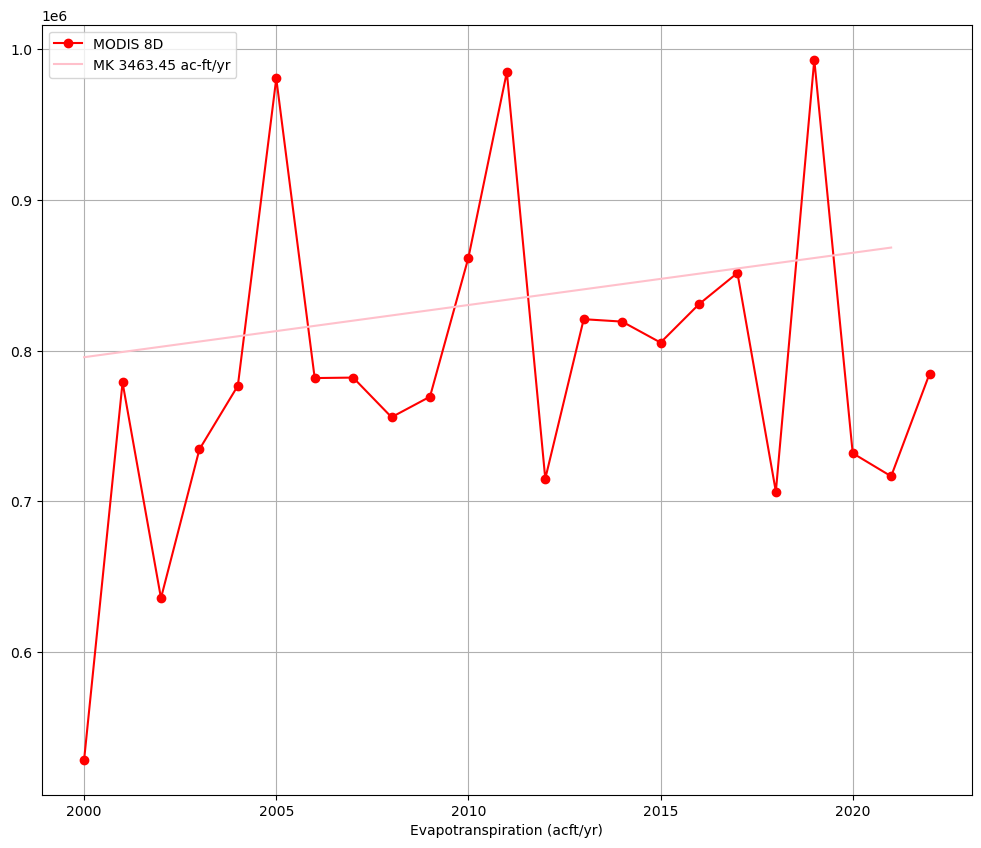

In [62]:
mm8 = pd.read_csv(raw_dir / "MonthlyMODIS8d.csv",index_col='system:index')
mm8['date'] = pd.to_datetime(mm8['date'], format='%Y_%m_%d')
# ET / Density of water x Area x 1/8 days x Scaling Factor
mm8['ET_1d'] = mm8['ET']/8.*0.1
mm8['ET_cmd'] = mm8['ET']*0.001*mm8['area']*0.125*0.1
mm8['ET_acft_1d'] = mm8['ET_cmd']*0.000810714
mm8 = mm8.reset_index().set_index('date').sort_index()
#mm30site = {}
mm30 = mm8.groupby('site').resample('1D').asfreq().interpolate(method='linear')
mm30 = mm30.drop(['site','system:index','area','.geo'],axis=1).reset_index()#.resample('1M').mean()
mm30 = mm30.groupby(['site',pd.Grouper(key='date',freq='1MS')]).sum()
mm30['wateryear'] = mm30.reset_index().set_index('date').index.shift(-9,freq='M').year+1
mmallyr = mm30.groupby('wateryear').sum()['ET_acft_1d']
mmallyr = mmallyr[mmallyr.index<=2022]


mmwy =  mm30.groupby(['site','wateryear']).sum()

fig, ax = plt.subplots(1,1)
mmallyr.plot(label='MODIS 8D',ax=ax,color='red',marker='o')
plotmk(mmallyr,axis=ax,color='pink')
plt.grid()
plt.xlabel('Evapotranspiration (acft/yr)')
plt.legend()

modis_abb = mm30.rename(columns={'ET_acft_1d':'aet_modis'})['aet_modis'].to_frame()


In [64]:
modis_abb.to_parquet(save_place / "modis_mo.parquet")

## PML

https://developers.google.com/earth-engine/datasets/catalog/CAS_IGSNRR_PML_V2#bands

<section tab="bands" role="tabpanel" aria-labelledby="aria-tab-bands" tabindex="0" id="tabpanel-bands" active="">

<p>
<b>Resolution</b>
<br>500 meters
</p>
<p><b>Bands</b>
</p><div class="devsite-table-wrapper"><table class="eecat">
<tbody><tr>
<th scope="col">Name</th>
<th scope="col">Units</th>
<th scope="col">Min</th>
<th scope="col">Max</th>
<th scope="col">Description</th>
</tr>
<tr>
<td><code translate="no" dir="ltr">GPP</code></td>
<td>gC m-2 d-1</td>
<td>
          0*
</td>
<td>
          39.01*
</td>
<td><p>Gross primary product</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">Ec</code></td>
<td>mm d-1</td>
<td>
          0*
</td>
<td>
          15.33*
</td>
<td><p>Vegetation transpiration</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">Es</code></td>
<td>mm d-1</td>
<td>
          0*
</td>
<td>
          8.2*
</td>
<td><p>Soil evaporation</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">Ei</code></td>
<td>mm d-1</td>
<td>
          0*
</td>
<td>
          12.56*
</td>
<td><p>Interception from vegetation canopy</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">ET_<wbr>water</code></td>
<td>mm d-1</td>
<td>
          0*
</td>
<td>
          20.11*
</td>
<td><p>Water body, snow and ice evaporation. Penman evapotranspiration is
regarded as actual evaporation for them.</p></td>
</tr>
</tbody></table></div>
  * estimated min or max value
</section>

Read in the data from the GEE output and convert the dates into a readable datetime.

Rasters are in units mm/day (see above).  Convert these to volume by converting to consistent units then multiplying by area.

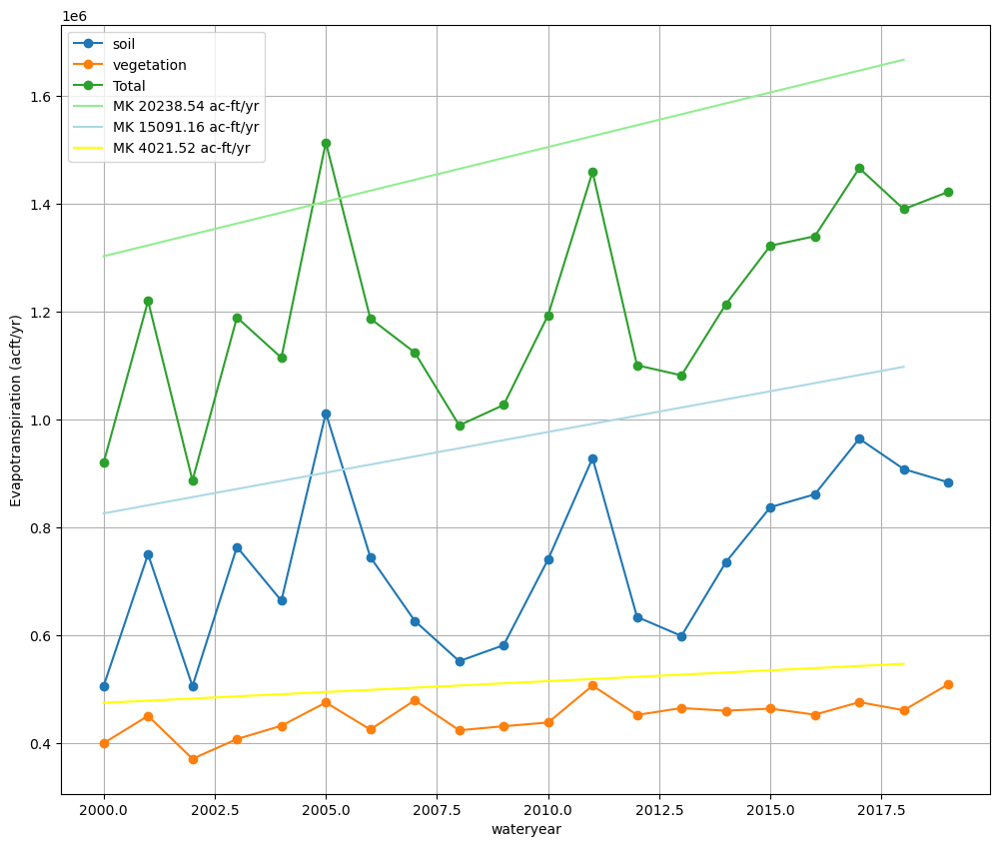

In [155]:
pml = pd.read_csv(raw_dir / "MonthlyPML.csv",index_col='system:index')
pml['date'] = pd.to_datetime(pml['date'], format='%Y-%m-%d')
#pml['wateryear'] = pml.reset_index().set_index('date').index.shift(-9,freq='M').year+1
#pmlmo = pml.groupby(['hucname', pd.Grouper(key='date',freq='1M')]).mean()
pml['Total_ET'] =  pml[['Soil_Evap','Veg_Trans','Veg_Intercep']].sum(axis=1)
pml['Soil_Evap_m3'] = pml['Soil_Evap']*pml['area']*0.001
pml['Veg_Trans_m3'] = pml['Veg_Trans']*pml['area']*0.001
pml['Veg_Intercep_m3'] = pml['Veg_Intercep']*pml['area']*0.001
pml['Soil_Evap_acft'] = pml['Soil_Evap_m3']*0.000810714
pml['Veg_Trans_acft'] = pml['Veg_Trans_m3']*0.000810714
pml['Veg_Intercep_acft']= pml['Veg_Intercep_m3']*0.000810714
pml['Total_acft'] = pml[['Soil_Evap_acft','Veg_Trans_acft','Veg_Intercep_acft']].sum(axis=1)

pml = pml.reset_index().set_index('date').sort_index()
pml = pml.drop(['system:index','.geo'],axis=1)
pmlmo = pml.groupby('hucname').resample('1D').asfreq().interpolate(method='linear')
pmlmo = pmlmo.drop(['hucname','area'],axis=1).reset_index()#.resample('1M').mean()
pmlmo = pmlmo.groupby(['hucname',pd.Grouper(key='date',freq='1MS')]).sum()
pmlmo['wateryear'] = pmlmo.reset_index().set_index('date').index.shift(-9,freq='M').year+1
pmlmo = pmlmo[pmlmo['wateryear'] <2020]
pmlallyr = pmlmo.groupby('wateryear').sum()
pmlallyr = pmlallyr[(pmlallyr.index>=2000)&(pmlallyr.index<2020)]
pmlwy = pmlmo.groupby(['hucname','wateryear']).sum()

fig, ax = plt.subplots(1,1)
pmlallyr['Soil_Evap_acft'].plot(label='soil',ax=ax, marker='o')
pmlallyr['Veg_Trans_acft'].plot(label='vegetation',ax=ax, marker='o')#['Veg_Trans'].plot()
pmlallyr['Total_acft'].plot(label='Total',ax=ax, marker='o')
plotmk(pmlallyr['Total_acft'],axis=ax,color='lightgreen')
plotmk(pmlallyr['Soil_Evap_acft'],axis=ax,color='lightblue')
plotmk(pmlallyr['Veg_Trans_acft'],axis=ax,color='yellow')
plt.legend()
plt.grid()
plt.ylabel('Evapotranspiration (acft/yr)')

pmlmo_abb = pmlmo[['Soil_Evap_acft', 'Veg_Trans_acft', 'Veg_Intercep_acft', 'Total_acft']]
pmlmo_abb = pmlmo_abb.rename(columns={'Soil_Evap_acft':'aetsoil_pml', 
                                  'Veg_Trans_acft':'aetveg_pml', 
                                  'Veg_Intercep_acft':'aetint_pml', 
                                  'Total_acft':'aet_pml'})

In [156]:
pmlmo_abb

aetsoil_pml   aetveg_pml  aetint_pml      aet_pml
hucname date                                                         
2       2000-02-01   690.015735    25.682848    1.572122   717.270705
        2000-03-01  9145.269319   577.439089   35.722181  9758.430588
        2000-04-01  6327.544216  1476.987021   39.681092  7844.212328
        2000-05-01  6437.254434  1985.915336   65.358645  8488.528414
        2000-06-01  5735.105651  2129.005183   49.763119  7913.873953
...                         ...          ...         ...          ...
120     2019-05-01  3454.136820  1863.762089  121.834283  5439.733192
        2019-06-01  2450.957850  1248.976871   47.764643  3747.699364
        2019-07-01  1317.171279   768.589622   23.555579  2109.316480
        2019-08-01   894.230853   566.247014    6.559635  1467.037503
        2019-09-01   443.842511   420.225653    5.448302   869.516466

[7080 rows x 4 columns]

In [157]:
pmlmo = pmlmo[['Soil_Evap_acft','Veg_Trans_acft', 'Veg_Intercep_acft', 'Total_acft']]
pmlmo = pmlmo.rename(columns={'Soil_Evap_acft':'PML_Soil_Evap_acft',
                              'Veg_Trans_acft':'PML_Veg_Trans_acft', 
                              'Veg_Intercep_acft':'PML_Veg_Intercept_acft', 'Total_acft':'pml_aet_acft'})
pmlmo.to_parquet(save_place / "pml_mo.parquet")

In [158]:
pml['month']= pml.index.month
pml['quarter']= pml.index.quarter

Text(0, 0.5, 'Evapotranspiration (mm/day)')

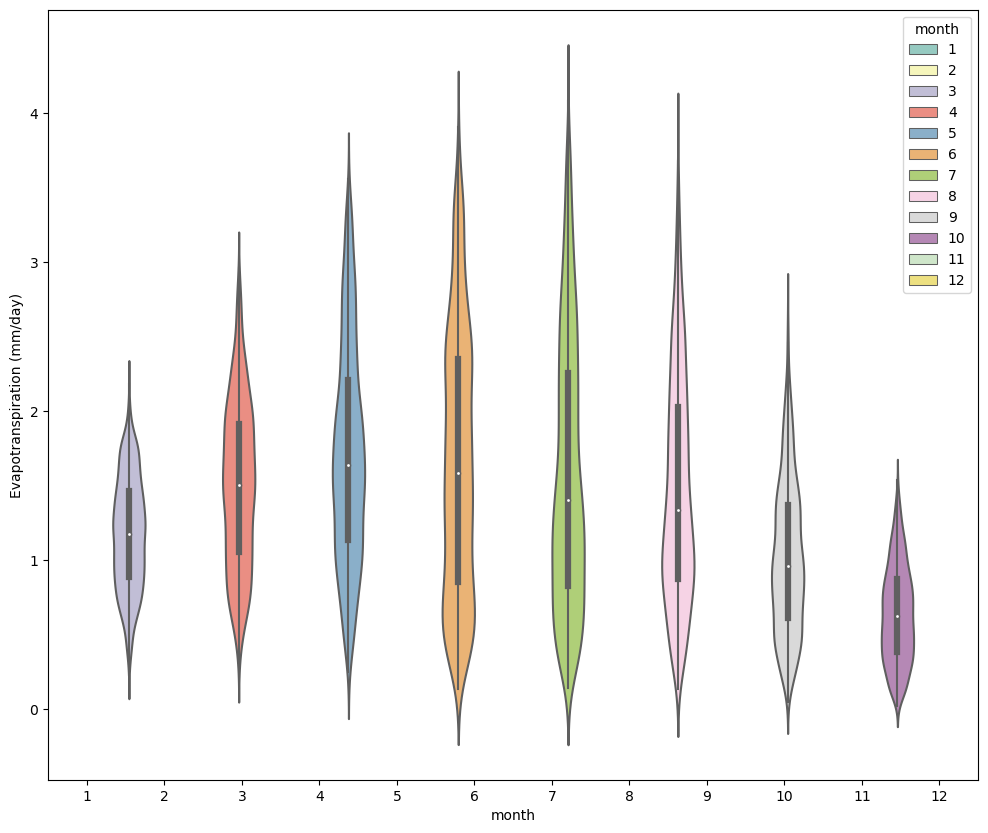

In [159]:
ax = sns.violinplot(x='month', y='Total_ET', data=pml, hue='month', palette="Set3",width=5)
plt.ylabel('Evapotranspiration (mm/day)')

Text(0, 0.5, 'Evapotranspiration (mm/mo)')

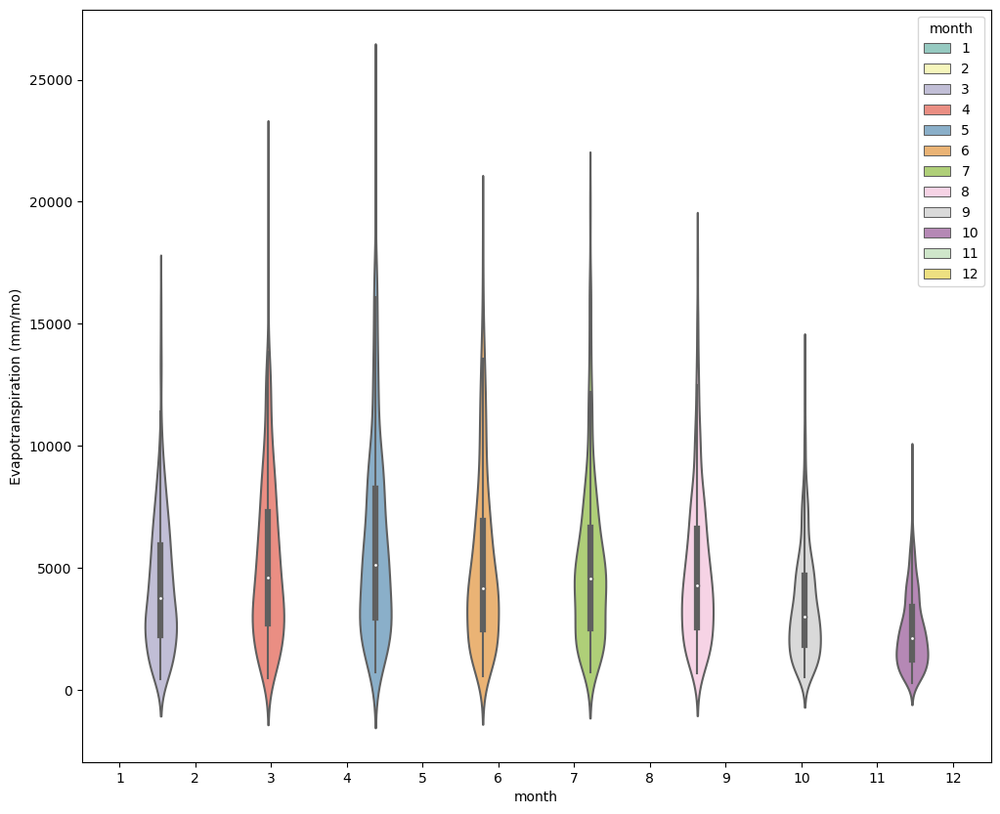

In [160]:
pmlmo['month'] = pmlmo.index.get_level_values(1).month
ax = sns.violinplot(x='month', y='pml_aet_acft', data=pmlmo, hue='month', palette="Set3",width=5)
plt.ylabel('Evapotranspiration (mm/mo)')

## Terra

https://developers.google.com/earth-engine/datasets/catalog/IDAHO_EPSCOR_TERRACLIMATE#bands

<table class="eecat">
<tbody><tr>
<th scope="col">Name</th>
<th scope="col">Units</th>
<th scope="col">Min</th>
<th scope="col">Max</th>
<th scope="col">Scale</th>
<th scope="col">Description</th>
</tr>
<tr>
<td><code translate="no" dir="ltr">aet</code></td>
<td>mm</td>
<td>
          0*
</td>
<td>
          3140*
</td>
<td>0.1</td>
<td><p>Actual evapotranspiration, derived using a one-dimensional soil water balance model</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">def</code></td>
<td>mm</td>
<td>
          0*
</td>
<td>
          4548*
</td>
<td>0.1</td>
<td><p>Climate water deficit, derived using a one-dimensional soil water balance model</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">pdsi</code></td>
<td></td>
<td>
          -4317*
</td>
<td>
          3418*
</td>
<td>0.01</td>
<td><p>Palmer Drought Severity Index</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">pet</code></td>
<td>mm</td>
<td>
          0*
</td>
<td>
          4548*
</td>
<td>0.1</td>
<td><p>Reference evapotranspiration (ASCE Penman-Montieth)</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">pr</code></td>
<td>mm</td>
<td>
          0*
</td>
<td>
          7245*
</td>
<td></td>
<td><p>Precipitation accumulation</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">ro</code></td>
<td>mm</td>
<td>
          0*
</td>
<td>
          12560*
</td>
<td></td>
<td><p>Runoff, derived using a one-dimensional soil water balance model</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">soil</code></td>
<td>mm</td>
<td>
          0*
</td>
<td>
          8882*
</td>
<td>0.1</td>
<td><p>Soil moisture, derived using a one-dimensional soil water balance model</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">srad</code></td>
<td>W/m^2</td>
<td>
          0*
</td>
<td>
          5477*
</td>
<td>0.1</td>
<td><p>Downward surface shortwave radiation</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">swe</code></td>
<td>mm</td>
<td>
          0*
</td>
<td>
          32767*
</td>
<td></td>
<td><p>Snow water equivalent, derived using a one-dimensional soil water balance model</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">tmmn</code></td>
<td>°C</td>
<td>
          -770*
</td>
<td>
          387*
</td>
<td>0.1</td>
<td><p>Minimum temperature</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">tmmx</code></td>
<td>°C</td>
<td>
          -670*
</td>
<td>
          576*
</td>
<td>0.1</td>
<td><p>Maximum temperature</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">vap</code></td>
<td>kPa</td>
<td>
          0*
</td>
<td>
          14749*
</td>
<td>0.001</td>
<td><p>Vapor pressure</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">vpd</code></td>
<td>kPa</td>
<td>
          0*
</td>
<td>
          1113*
</td>
<td>0.01</td>
<td><p>Vapor pressure deficit</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">vs</code></td>
<td>m/s</td>
<td>
          0*
</td>
<td>
          2923*
</td>
<td>0.01</td>
<td><p>Wind-speed at 10m</p></td>
</tr>
</tbody></table>

In [279]:
def grpterra(x):
    """function to be applied to groupby technique on hucs and Terra data"""
    d = {}
    d['terra_et'] = x['aet_volume_af'].sum()
    d['terra_ppt'] = x['pr_volume_af'].sum()
    d['terra_ro'] = x['ro_volume_af'].sum()
    d['terra_def'] = x['def_volume_af'].sum()
    d['terra_soil'] = x['soil_volume_af'].max()
    d['terra_swe'] = x['swe_diff'].sum()
    d['terra_swe_max'] = x['swe_diff'].sum()
    d['wateryear'] = x['wateryear'].max()
    return pd.Series(d,index=['terra_et','terra_ppt','terra_ro','terra_soil','terra_def','terra_swe','wateryear'])

Read in Terra data, get dates in proper format, and organize indices

In [281]:
terra1 = pd.read_parquet(parquet_dir / "Monthly.parquet")
terra2 = pd.read_parquet(parquet_dir / "MonthlyTerraPast.parquet")
terra = pd.concat([terra1,terra2],axis=0)
#terra = matchhuc(terra, hucbasin)

terra['hucname'] = terra['site']
terra = terra.reset_index().rename(columns={'system:time_start':'date'})
terra['date'] = pd.to_datetime(terra['date'], format='%Y%m')
#terra = terra[terra['date']<pd.to_datetime('2022-10-01')]
terra = terra.drop('system:index',axis=1).sort_index().set_index(['hucname','date'])
terra['wateryear'] = terra.reset_index().set_index('date').index.shift(-9,freq='M').year+1

Convert units from mm/month to ac-ft per month

In [282]:
calcfields = ['aet', 'def', 'pr', 'ro', 'soil', 'swe']
for fld in calcfields:
    if fld in ['pr','ro','swe']:
        # area * mm to m * m3 to acre-ft
        terra[fld+"_volume_af"] = terra[fld]*terra['area']*0.001*0.000810714#*1.34289379E-5
    else:
        terra[fld+"_volume_af"] = terra[fld]*terra['area']*0.001*0.000810714*0.1#*1.34289379E-5

Get change in snowpack volume and change in soil water volume over time:

In [283]:
# diff function takes difference between one month and the next month; change over time
terra['swe_diff'] = terra['swe_volume_af'].diff() 
terra['soil_diff'] = terra['soil_volume_af'].diff()


In [284]:
terra_mo = terra[['aet_volume_af','def_volume_af','pr_volume_af','ro_volume_af','soil_volume_af','swe_volume_af']]
rename_dict = {'aet_volume_af':'terra_aet_acft',
               'def_volume_af':'terra_def_acft',
               'pr_volume_af':'terra_ppt_acft',
               'ro_volume_af':'terra_ro_acft',
               'soil_volume_af':'terra_soil_acft',
               'swe_volume_af':'terra_swe_acft'}
terra_mo = terra_mo.rename(columns=rename_dict)
terra_mo.to_parquet(save_place / "terra_mo_hydrodiv.parquet")

<Axes: xlabel='date'>

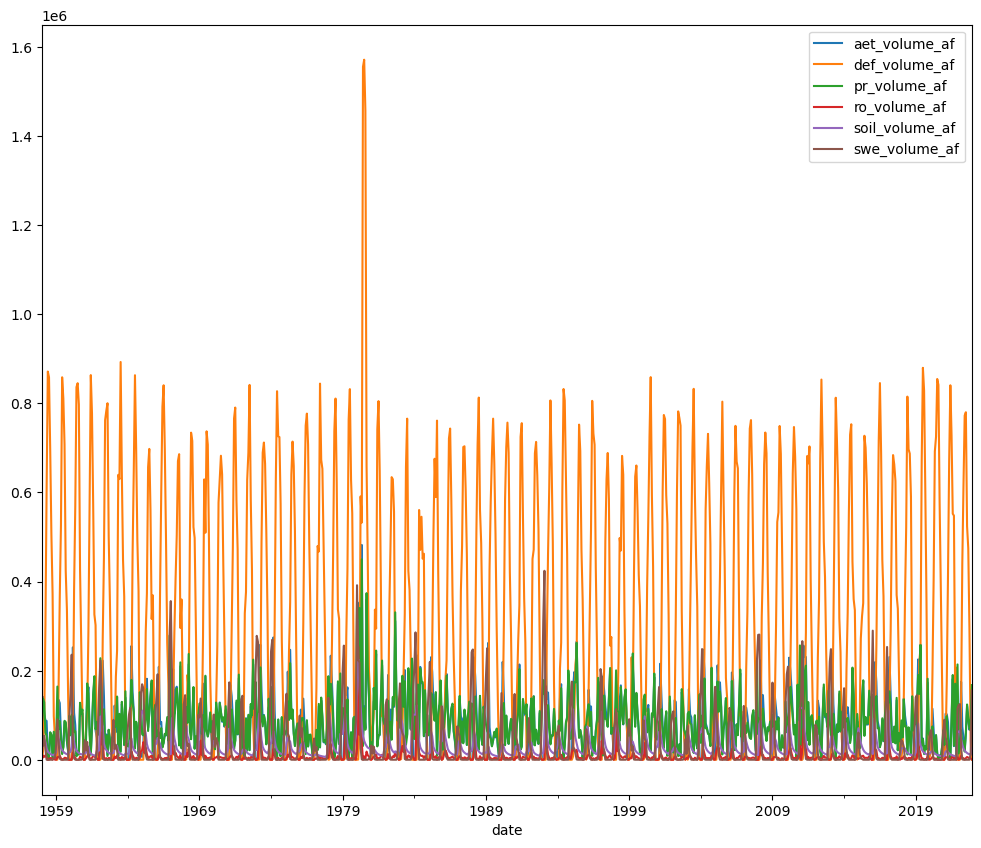

In [285]:
terra.groupby(level=1).sum()[['aet_volume_af','def_volume_af',
                                     'pr_volume_af','ro_volume_af',
                                     'soil_volume_af','swe_volume_af']].plot()

In [286]:

# This is grouping by water year and individual huc
terra_wy = terra.groupby(['hucname','wateryear']).apply(grpterra).sort_index()
# This groups all hucs together (entire basin) and gives data by water year
teryr = terra.groupby('wateryear').apply(grpterra).sort_index()

#terra_wy.to_csv(save_place / "Terra_wy.csv")

In [287]:
#terra.to_csv(save_place / "Terra_mo.csv")

Plot data

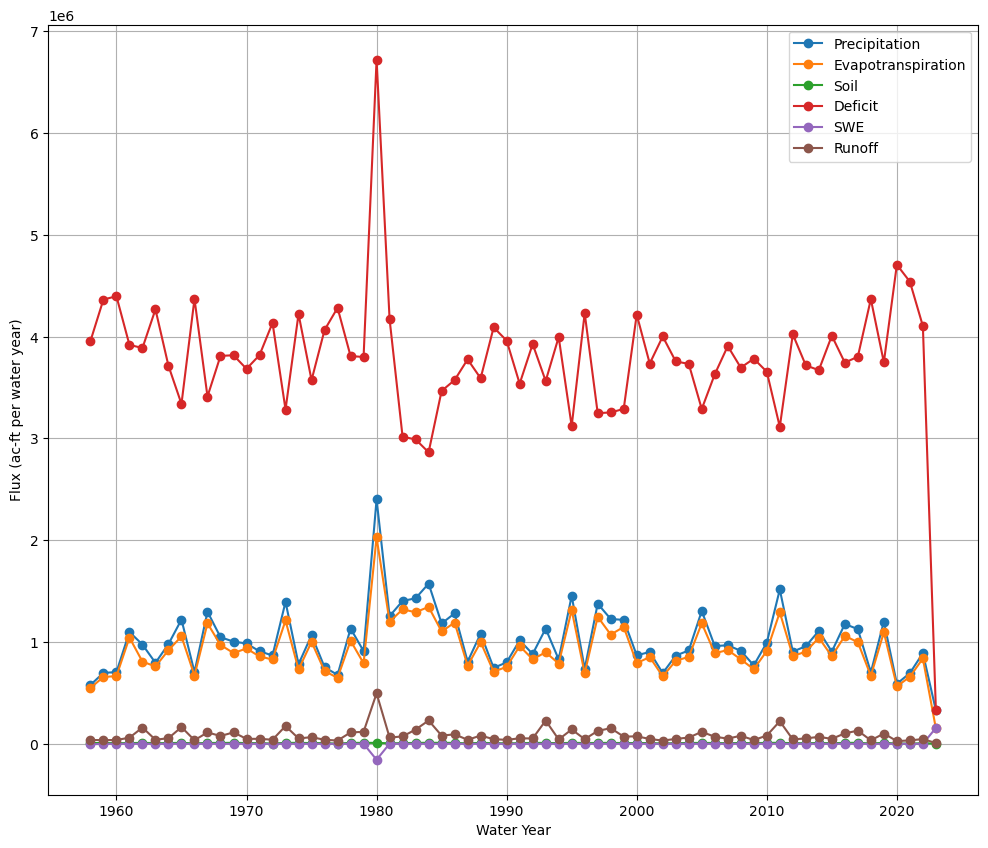

In [288]:
teryr = teryr[teryr.index<2024]

teryr['terra_ppt'].plot(marker='o',label='Precipitation')
teryr['terra_et'].plot(marker='o',label='Evapotranspiration')
teryr['terra_soil'].plot(marker='o',label='Soil')
teryr['terra_def'].plot(marker='o',label='Deficit')
teryr['terra_swe'].plot(marker='o',label='SWE')
teryr['terra_ro'].plot(marker='o',label='Runoff')

plt.ylabel('Flux (ac-ft per water year)')
#plt.xticks(range(1999,2025,5))
plt.xlabel('Water Year')
plt.legend()
plt.grid()


terra_abb = terra[['aet_volume_af', 'def_volume_af', 'pr_volume_af', 'ro_volume_af', 'soil_volume_af', 'swe_volume_af']]
terra_abb = terra_abb.rename(columns={'aet_volume_af':'aet_terra', 
                      'def_volume_af':'def_terra', 
                      'pr_volume_af':'ppt_terra', 
                      'ro_volume_af':'ro_terra',
                      'soil_volume_af':'soil_terra', 
                      'swe_volume_af':'swe_terra'})

terra_abb = terra_abb.groupby([terra_abb.index.get_level_values(0), 
                               pd.Grouper(level=1,freq='1MS',label='left',closed='right')]).mean()


Text(0, 0.5, 'Evapotranspiration (mm/mo)')

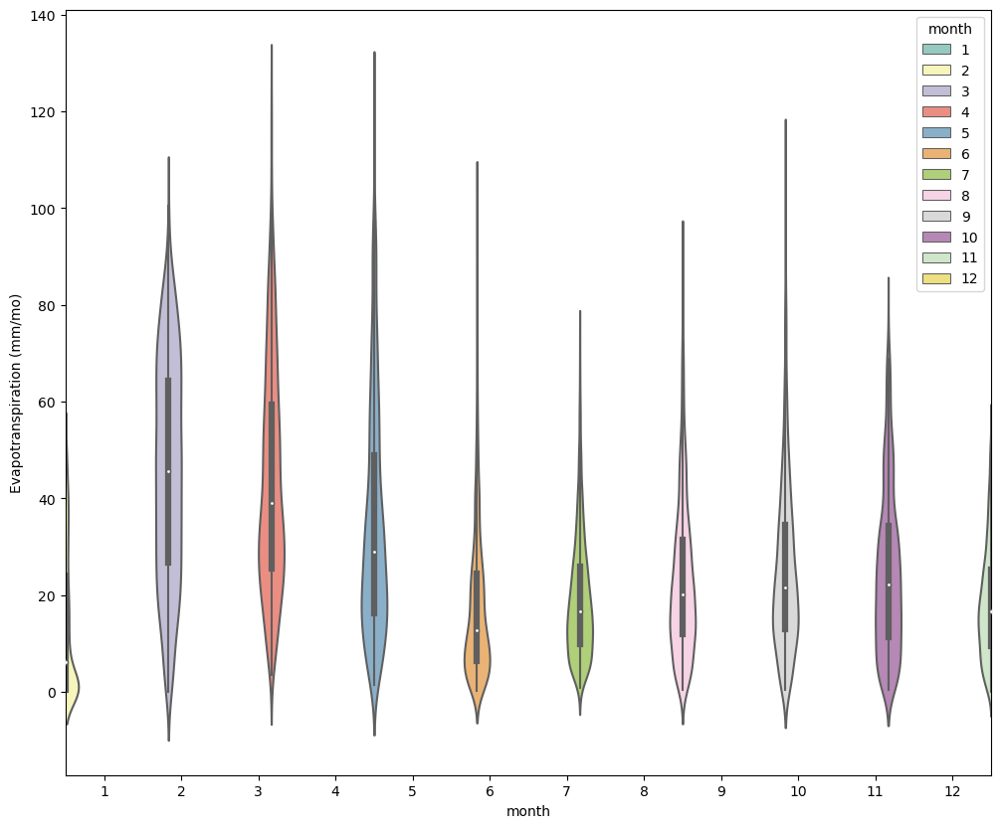

In [291]:
terra['month'] = terra.index.get_level_values(1).month
terra['aet_adj'] = terra['aet']*0.1 
ax = sns.violinplot(x='month', y='aet_adj', data=terra, hue='month', palette="Set3",width=4)
plt.ylabel('Evapotranspiration (mm/mo)')

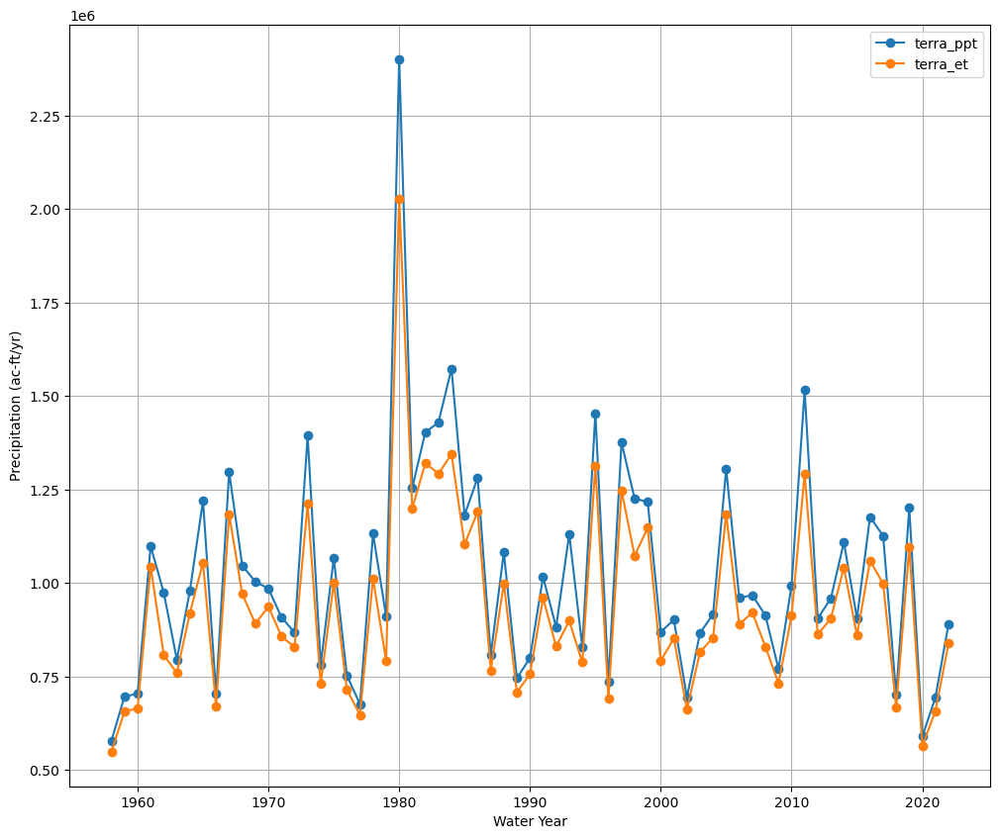

In [290]:
rcParams['figure.figsize'] = 12, 10
rcParams['pdf.fonttype'] = 42
inline_rc = dict(plt.rcParams)

plt.figure(figsize=(12,10))
teryr.loc[:2022,'terra_ppt'].plot(marker='o')
teryr.loc[:2022,'terra_et'].plot(marker='o')
plt.grid()
plt.ylabel('Precipitation (ac-ft/yr)')
#plt.xticks(range(2000,2023,5))
plt.xlabel('Water Year')
plt.legend()

In [40]:
terra.columns

Index(['index', 'aet', 'area', 'def', 'pet', 'pr', 'ro', 'site', 'soil', 'swe',
       '.geo', 'wateryear', 'aet_volume_af', 'def_volume_af', 'pr_volume_af',
       'ro_volume_af', 'soil_volume_af', 'swe_volume_af', 'swe_diff',
       'soil_diff', 'month', 'aet_adj'],
      dtype='object')

## DAYMET

https://developers.google.com/earth-engine/datasets/catalog/NASA_ORNL_DAYMET_V4

<table class="eecat">
<tbody><tr>
<th scope="col">Name</th>
<th scope="col">Units</th>
<th scope="col">Min</th>
<th scope="col">Max</th>
<th scope="col">Description</th>
</tr>
<tr>
<td><code translate="no" dir="ltr">dayl</code></td>
<td>seconds</td>
<td>
          0*
</td>
<td>
          86400*
</td>
<td><p>Duration of the daylight period. Based on the period
of the day during which the sun is above a hypothetical flat horizon.</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">prcp</code></td>
<td>mm</td>
<td>
          0*
</td>
<td>
          544*
</td>
<td><p>Daily total precipitation, sum of all forms converted to
water-equivalent.</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">srad</code></td>
<td>W/m^2</td>
<td>
          0*
</td>
<td>
          1051*
</td>
<td><p>Incident shortwave radiation flux density, taken as an average
over the daylight period of the day.</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">swe</code></td>
<td>kg/m^2</td>
<td>
          0*
</td>
<td>
          13931*
</td>
<td><p>Snow water equivalent, the amount of water contained within
the snowpack.</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">tmax</code></td>
<td>°C</td>
<td>
          -60*
</td>
<td>
          60*
</td>
<td><p>Daily maximum 2-meter air temperature.</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">tmin</code></td>
<td>°C</td>
<td>
          -60*
</td>
<td>
          42*
</td>
<td><p>Daily minimum 2-meter air temperature.</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">vp</code></td>
<td>Pa</td>
<td>
          0*
</td>
<td>
          8230*
</td>
<td><p>Daily average partial pressure of water vapor.</p></td>
</tr>
</tbody></table>

In [21]:
def grpdaymet(x):
    """function to be applied to groupby technique on hucs and DAYMET data"""
    d = {}
    d['ppt_daymet'] = x['PR_acft'].sum()
    # SWE gives snapshot of snowpack for current day
    d['swe_daymet'] = x['SWE_acft'].median()
    return pd.Series(d,index=['ppt_daymet','swe_daymet'])

In [41]:
daymet = pd.read_parquet(parquet_dir / "MonthlyDM.parquet")
daymet = daymet.set_index("system:index")
#daymet = matchhuc(daymet, match_dict, hucbasin)

daymet['hucname'] = daymet['site']
daymet['date'] = pd.to_datetime(daymet['date'], format='%Y%m%d')
# Currently daymet cuts off at the end of the 2019 calendar year 
daymet = daymet[daymet['date']<pd.to_datetime('10/1/2022')]
# ET / Density of water x Area x 1/8 days x Scaling Factor
daymet['SWE_cmd'] = daymet['swe']*0.001*daymet['area']
# Precip x area x mm to m
daymet['PR_cmd'] = daymet['pr']*daymet['area']*0.001
daymet['PR_acft'] = 0.000810714*daymet['PR_cmd']
daymet['SWE_acft'] = daymet['SWE_cmd']*0.000810714

daymetmo = daymet.groupby(['hucname',pd.Grouper(key='date',freq='1MS',closed='right',label='left')]).apply(grpdaymet)
daymetmo['wateryear'] = daymetmo.reset_index().set_index('date').index.shift(-9,freq='M').year+1
daymetmo = daymetmo.rename(columns={'ppt_daymet':'daymet_ppt_acft','swe_daymet':'daymet_swe_acft'})
daymetmo[['daymet_ppt_acft','daymet_swe_acft']].to_parquet(save_place / "daymet_mo_hydrodiv.parquet")

In [42]:
#daymetmo['wateryear'] = daymetmo.reset_index().set_index('date').index.shift(-9,freq='M').year+1
daymetwy = daymetmo.groupby(['hucname','wateryear']).sum()[['daymet_ppt_acft','daymet_swe_acft']]
daymetwy

daymet_ppt_acft  daymet_swe_acft
hucname wateryear                                  
2       1990          65222.625817     17777.994259
        1991          92479.287347      7697.321344
        1992          71322.719602       715.023627
        1993          93763.914731      5988.890718
        1994          88114.220668      1977.750646
...                            ...              ...
120     2018          11940.167330        29.318344
        2019          26809.213468       335.679701
        2020          15566.441514      2264.048243
        2021          19384.730254       653.164474
        2022          21627.915268        36.827821

[990 rows x 2 columns]

In [43]:
daymetyr = daymetmo.reset_index(level = 'hucname')
daymetyr = daymetyr.groupby(['hucname']).resample('Y').sum()
daymetyr = daymetyr[['daymet_ppt_acft','daymet_swe_acft']]

In [44]:
daymetyr.to_parquet(save_place / "DAYMET_yr_2hydrodiv.parquet")
daymetwy.to_parquet(save_place / "DAYMET_wy_2hydrodiv.parquet")

## OpenET

In [132]:
oet = pd.read_parquet(parquet_dir / "MonthlyOpenET.parquet")
oet['date'] = pd.to_datetime(oet['date'].str.split("_",expand=True)[1], format='%Y%m%d') 

oet = oet.drop(['system:index','.geo'],axis=1,)
oet['wateryear'] = oet.reset_index().set_index('date').index.shift(-9,freq='M').year+1
oet['openet_aet_acft'] = oet['area'] * 0.000247105 * 0.00328084 * oet['et_ensemble_mad'] # area * cube m to acres * in to feet * precip
oet = oet[oet['wateryear']<2023] 
oet_sorted = oet.reset_index().set_index(['hucname','date']).sort_index()

oet_sorted['openet_aet_acft'].to_csv(save_place / "openet_hydrodiv.csv")
oet_sorted.to_parquet(save_place / "openet_hydrodiv.parquet")


<Axes: xlabel='wateryear'>

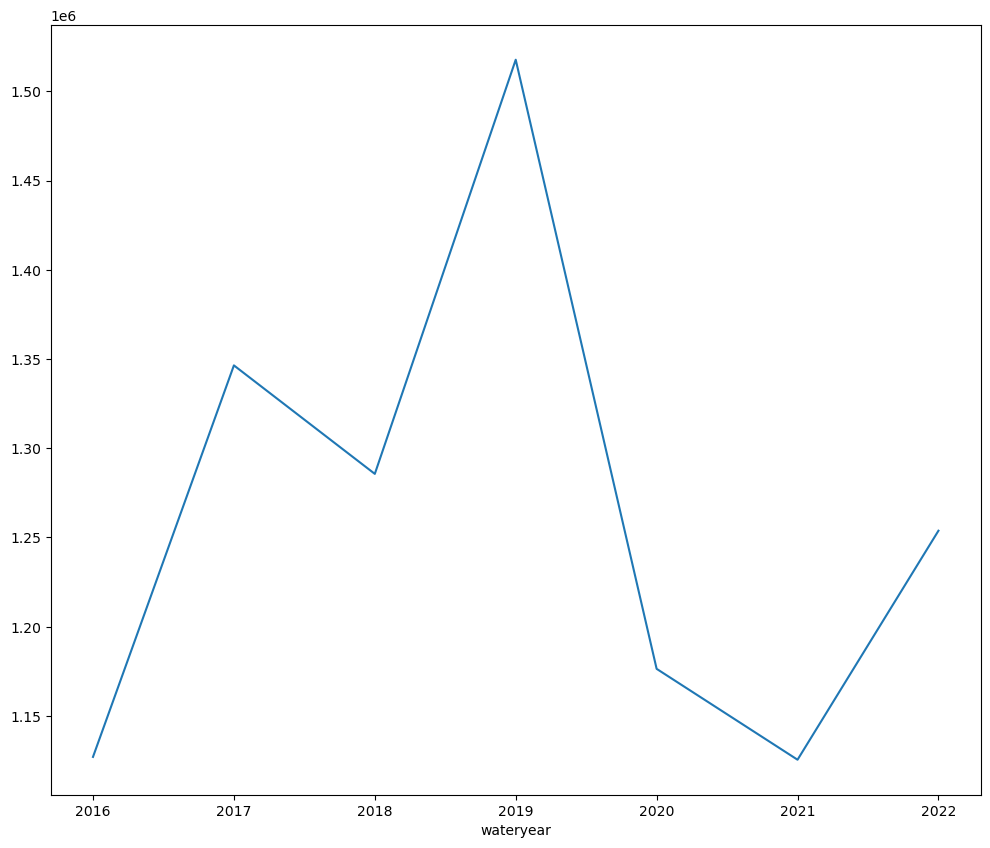

In [133]:
oet_sorted.groupby('wateryear').sum(numeric_only=True)['openet_aet_acft'].plot()

## GPM 

<th class="mdl-data-table__cell--non-numeric"> Description </th> <th> Units </th> </tr></thead><tbody><tr><td class="mdl-data-table__cell--non-numeric"> gaugeRelativeWeighting </td><td class="mdl-data-table__cell--non-numeric"> Weighting of gauge precipitation relative to the multi-satellite precipitation </td><td> % </td></tr><tr><td class="mdl-data-table__cell--non-numeric"> precipitation </td><td class="mdl-data-table__cell--non-numeric"> Merged satellite-gauge precipitation estimate </td><td> mm/hr </td>


In [136]:
gpm = pd.read_parquet(parquet_dir / "MonthlyGPMPPT.parquet")

gpm['date'] = pd.to_datetime(gpm['date'],format='%Y%m%d%f')
gpm['hucname'] = gpm['site']
gpm['ppt in per mo'] = gpm['date'].dt.daysinmonth * 24 * gpm['precipitation'] * 0.0393701
gpm['gpm_ppt_acft'] = gpm['area'] * 0.000247105 * 0.0833333 * gpm['ppt in per mo'] # area * cube m to acres * in to feet * precip
gpm['wateryear'] = gpm.reset_index().set_index('date').index.shift(-9,freq='M').year+1
gpm = gpm[gpm['wateryear']>2000]
gpm_sorted = gpm.reset_index().set_index(['hucname','date']).sort_index()

gpm_sorted['gpm_ppt_acft'].to_csv(save_place / "gpm_monthly_hydrodiv.csv")
gpm_sorted.to_parquet(save_place / "gpm_monthly_hydrodiv.parquet")
#gpm_sorted.loc[14].resample('1D').asfreq()



<Axes: xlabel='wateryear'>

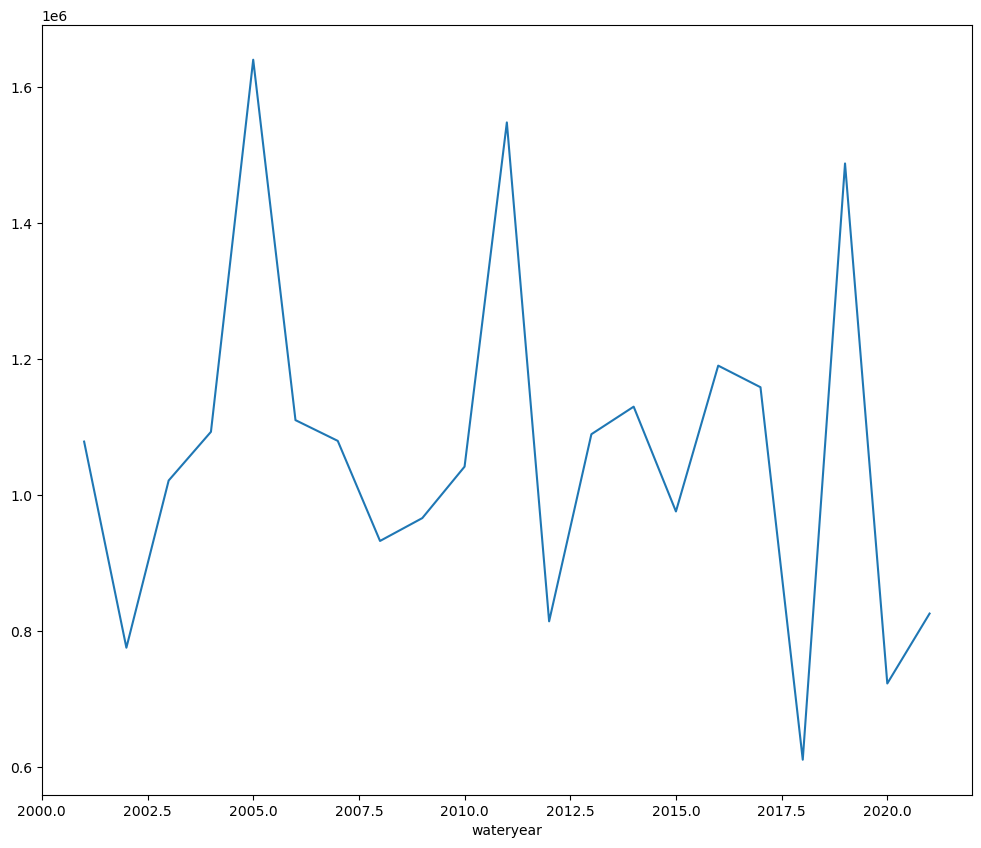

In [137]:
gpm_sorted.groupby('wateryear').sum(numeric_only=True)['gpm_ppt_acft'].plot()

In [49]:
#gpm_sorted['precipitation_mm_mo'] = gpm_sorted['']

## PRISM

https://developers.google.com/earth-engine/datasets/catalog/OREGONSTATE_PRISM_AN81m?hl=en

<section tab="bands" role="tabpanel" aria-labelledby="aria-tab-bands" tabindex="0" id="tabpanel-bands" active="">

<p>
<b>Resolution</b>
<br>2.5 arc minutes (~4640 m depending on latitude)
</p>
<p><b>Bands</b>
</p><div class="devsite-table-wrapper"><table class="eecat">
<tbody><tr>
<th scope="col">Name</th>
<th scope="col">Units</th>
<th scope="col">Min</th>
<th scope="col">Max</th>
<th scope="col">Description</th>
</tr>
<tr>
<td><code translate="no" dir="ltr">ppt</code></td>
<td>mm</td>
<td>
          0*
</td>
<td>
          2639.82*
</td>
<td><p>Monthly total precipitation (including rain and melted snow)</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">tmean</code></td>
<td>°C</td>
<td>
          -30.8*
</td>
<td>
          41.49*
</td>
<td><p>Monthly average of daily mean temperature (calculated as (tmin+tmax)/2)</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">tmin</code></td>
<td>°C</td>
<td>
          -35.11*
</td>
<td>
          34.72*
</td>
<td><p>Monthly minimum temperature</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">tmax</code></td>
<td>°C</td>
<td>
          -29.8*
</td>
<td>
          49.74*
</td>
<td><p>Monthly average of daily maximum temperature</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">tdmean</code></td>
<td>°C</td>
<td>
          -30.7*
</td>
<td>
          26.76*
</td>
<td><p>Monthly average of daily mean dew point temperature</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">vpdmin</code></td>
<td>hPa</td>
<td>
          0*
</td>
<td>
          44.79*
</td>
<td><p>Monthly average of daily minimum vapor pressure deficit</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">vpdmax</code></td>
<td>hPa</td>
<td>
          0.009*
</td>
<td>
          110.06*
</td>
<td><p>Monthly average of daily maximum vapor pressure deficit</p></td>
</tr>
</tbody></table></div>
  * estimated min or max value
</section>

In [42]:
# import GEE output
prism_mean_1 = pd.read_csv(raw_dir / "MonthlyPPT.csv")
prism_mean_2 = pd.read_csv(raw_dir / "MonthlyPPT_1940_1980.csv")

prism_mean = pd.concat([prism_mean_1,prism_mean_2],axis=0)


# convert ppt field to acre-feet per month
prism_mean["prism_ppt_volume_af"] = prism_mean['ppt']*prism_mean['area']*0.001*0.000810714
# parse date field to date-times
prism_mean['date'] = pd.to_datetime(prism_mean['date'], format="%Y%m")
# calculate water year for each datetime (water year starts Oct 1)
prism_mean['wateryear'] = prism_mean.set_index('date').index.shift(-9,freq='M').year+1
# calculate inches of water for each area
prism_mean["prism_ppt_in"] = prism_mean['ppt']*0.0393701

prism_mean['hucname'] = prism_mean['site']

# this makes a dataframe that is grouped by areas and by water year
prism_mean_wy = prism_mean.groupby(['hucname','wateryear']).sum(numeric_only=True) #["prism_ppt_volume_af"] 

# this makes a dataframe that is grouped by areas and by month
prism_abb= prism_mean.groupby(['hucname',
                    pd.Grouper(key='date',
                               freq='1MS',
                               closed='right',
                               label='left')]).mean(numeric_only=True)['prism_ppt_volume_af'].to_frame().rename(columns={'prism_ppt_volume_af':'prism_ppt_acft'})

# export one of the grouped dataframes to csv 
prism_abb.to_csv(save_place / "prism_mo_hydrodiv.csv")
prism_abb.to_parquet(save_place / "prism_mo_hydrodiv.parquet")
# group all data by water year to get total precip of study area by water year
priswy = prism_mean.groupby(['hucname','wateryear']).sum(numeric_only=True)

priswy.to_csv(save_place / "prism_wy.csv")
priswy.to_parquet(save_place / "prism_wy.parquet")


In [43]:
prism_mean

,system:index,area,date,ppt,site,.geo,prism_ppt_volume_af,wateryear,prism_ppt_in,hucname
0,00000000000000000012_198001,9.382353e+07,1980-01-01,63.759035,47,"{""type"":""MultiPoint"",""coordinates"":[]}",4849.770338,1980,2.510200,47
1,00000000000000000012_198002,9.382353e+07,1980-02-01,67.129805,47,"{""type"":""MultiPoint"",""coordinates"":[]}",5106.164782,1980,2.642907,47
2,00000000000000000012_198003,9.382353e+07,1980-03-01,57.710006,47,"{""type"":""MultiPoint"",""coordinates"":[]}",4389.656741,1980,2.272049,47
3,00000000000000000012_198004,9.382353e+07,1980-04-01,22.678862,47,"{""type"":""MultiPoint"",""coordinates"":[]}",1725.046051,1980,0.892869,47
4,00000000000000000012_198005,9.382353e+07,1980-05-01,80.711582,47,"{""type"":""MultiPoint"",""coordinates"":[]}",6139.249725,1980,3.177623,47
...,...,...,...,...,...,...,...,...,...,...
14755,0000000000000000000a_198008,1.585005e+08,1980-08-01,8.909552,20,"{""type"":""MultiPoint"",""coordinates"":[]}",1144.865018,1980,0.350770,20
14756,0000000000000000000a_198009,1.585005e+08,1980-09-01,45.076956,20,"{""type"":""MultiPoint"",""coordinates"":[]}",5792.326140,1980,1.774684,20
14757,0000000000000000000a_198010,1.585005e+08,1980-10-01,27.885986,20,"{""type"":""MultiPoint"",""coordinates"":[]}",3583.310420,1981,1.097874,20
14758,0000000000000000000a_198011,1.585005e+08,1980-11-01,18.993713,20,"{""type"":""MultiPoint"",""coordinates"":[]}",2440.665664,1981,0.747784,20


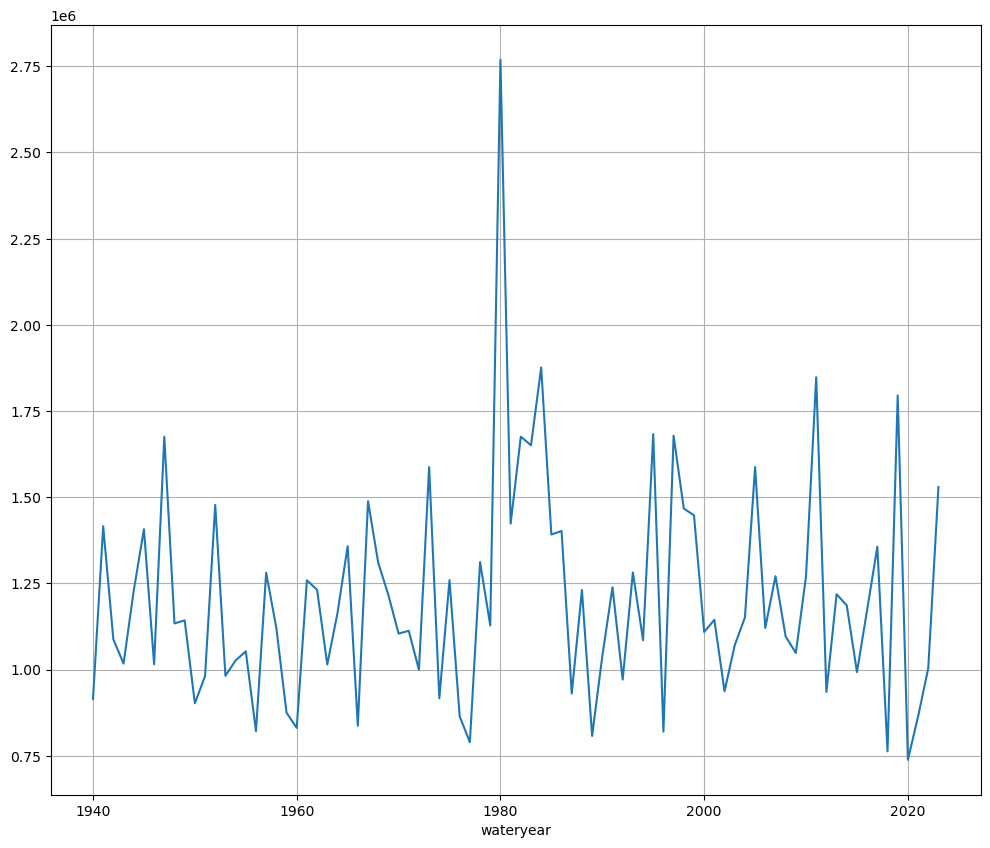

In [32]:
priswy = prism_mean.groupby(['wateryear']).sum(numeric_only=True)
priswy["prism_ppt_volume_af"].plot()
plt.grid()

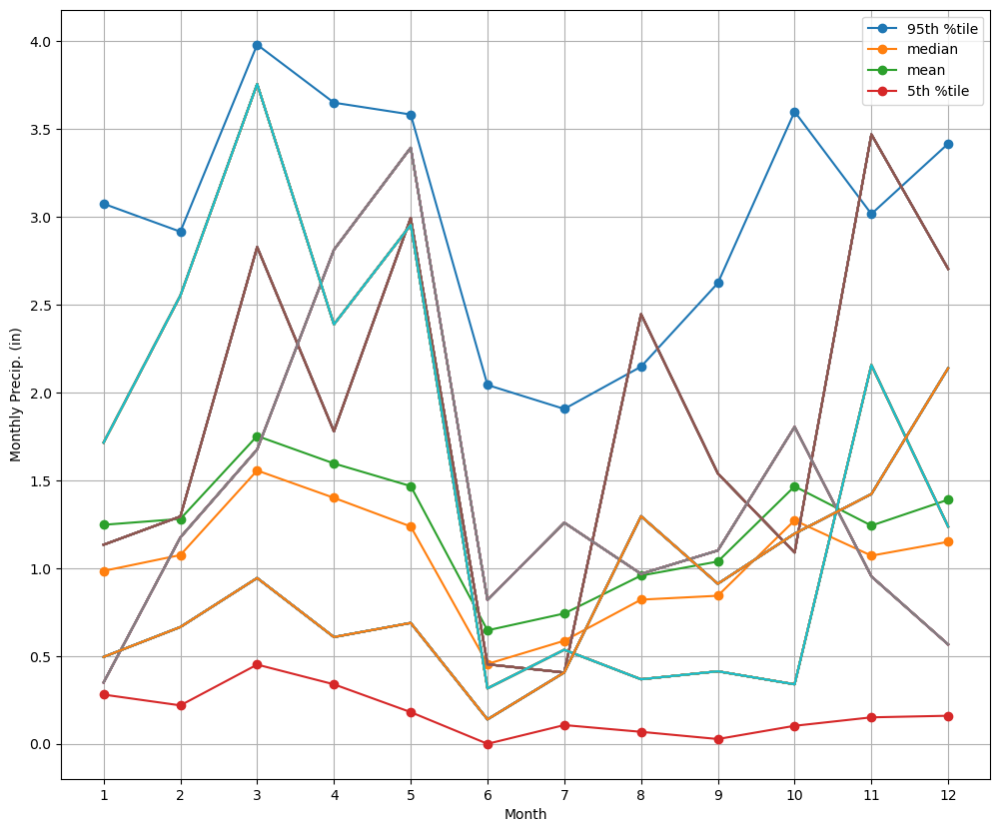

In [52]:
matplotlib.rc_file_defaults()
rcParams['figure.figsize'] = 12, 10
rcParams['pdf.fonttype'] = 42
inline_rc = dict(plt.rcParams)

def f(x):
    d = {}
    fld = 'prism_ppt_in'
    #fld = 'prism_ppt_volume_af'
    d['95th %tile'] = x[fld].quantile(0.95)
    d['median'] = x[fld].median()
    d['mean'] = x[fld].mean()
    d['5th %tile'] = x[fld].quantile(0.05)
    return pd.Series(d, index=['95th %tile', 'median', 'mean', '5th %tile'])


def g(x):
    d = {}
    fld = 'prism_ppt_in'
    d['mean'] = x[fld].mean()
    d['wateryear'] = x['wateryear'].min()
    return pd.Series(d, index=['mean','wateryear'])



prism_mean['month'] = prism_mean.reset_index().set_index('date').index.month
prism_mo = prism_mean.groupby('month').apply(f).plot(marker='o')
prism_moly = prism_mean.reset_index().set_index('date').groupby(pd.Grouper(freq='1M')).apply(g)
for year in prism_moly.index.year:
    if year in(1983,2011,2019,2022):
        plt.plot(prism_moly[prism_moly.index.year==year].sort_index().index.month, 
                 prism_moly[prism_moly.index.year==year].sort_index()['mean'],label=year)

plt.ylabel('Monthly Precip. (in)')
plt.xlabel('Month')
plt.xticks(range(1,13))
plt.grid()

(0.0, 20000.0)

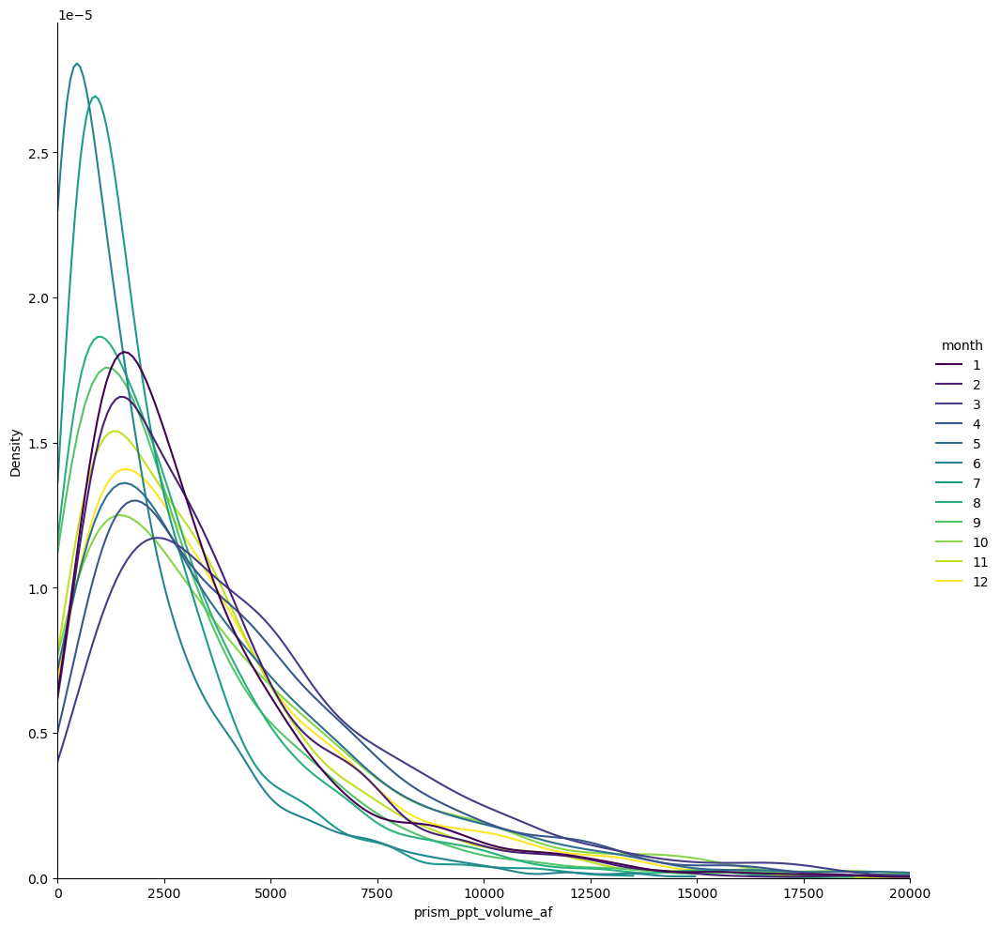

In [53]:
import seaborn as sns
#fig, ax = plt.subplots(1,1,figsize=[10,10])
prism_mean['month'] = prism_mean.reset_index().set_index('date').index.month
sns.displot(prism_mean, x="prism_ppt_volume_af", hue='month',cut=0, kind="kde", height=10, palette='viridis')
plt.xlim(0,20000)


## SMAP

https://developers.google.com/earth-engine/datasets/catalog/NASA_USDA_HSL_SMAP10KM_soil_moisture

This dataset is being superseded by SPL4SMGP.007

The NASA-USDA Enhanced SMAP Global soil moisture data provides soil moisture information across the globe at 10-km spatial resolution. This dataset includes: surface and subsurface soil moisture (mm), soil moisture profile (%), surface and subsurface soil moisture anomalies (-).

The dataset is generated by integrating satellite-derived Soil Moisture Active Passive (SMAP) Level 3 soil moisture observations into the modified two-layer Palmer model using a 1-D Ensemble Kalman Filter (EnKF) data assimilation approach. Soil moisture anomalies were computed from the climatology of the day of interest. The climatology was estimated based on the full data record of the SMAP satellite observation and the 31-day-centered moving-window approach. The assimilation of the SMAP soil moisture observations help improve the model-based soil moisture predictions particularly over poorly instrumented areas of the world that lack good quality precipitation data.

This dataset was developed by the Hydrological Science Laboratory at NASA's Goddard Space Flight Center in cooperation with USDA Foreign Agricultural Services and USDA Hydrology and Remote Sensing Lab.


<thead><tr><th class="mdl-data-table__cell--non-numeric"> Name </th><th class="mdl-data-table__cell--non-numeric"> Description </th><th> Min* </th><th> Max* </th> <th> Units </th> </tr></thead><tbody><tr><td class="mdl-data-table__cell--non-numeric"> ssm </td><td class="mdl-data-table__cell--non-numeric"> Surface soil moisture </td><td> 0 </td><td> 25.39 </td><td> mm </td></tr><tr><td class="mdl-data-table__cell--non-numeric"> susm </td><td class="mdl-data-table__cell--non-numeric"> Subsurface soil moisture </td><td> 0 </td><td> 274.6 </td><td> mm </td></tr><tr><td class="mdl-data-table__cell--non-numeric"> smp </td><td class="mdl-data-table__cell--non-numeric"> Soil moisture profile </td><td> 0 </td><td> 1 </td><td> fraction </td></tr><tr><td class="mdl-data-table__cell--non-numeric"> ssma </td><td class="mdl-data-table__cell--non-numeric"> Surface soil moisture anomaly </td><td> -4 </td><td> 4 </td><td> - </td></tr><tr><td class="mdl-data-table__cell--non-numeric"> susma </td><td class="mdl-data-table__cell--non-numeric"> Subsurface soil moisture anomaly </td><td> -4 </td><td> 4 </td><td> - </td></tr></tbody>

In [54]:
smap = pd.read_parquet(parquet_dir / "MonthlySMAP.parquet")
smap['date'] = smap['date'].str[-8:]

smap['date'] = pd.to_datetime(smap['date'], format='%Y%m%d')

smap['hucname'] = smap['site']

smap = smap[['area','hucname','SubsurfaceSM','SurfaceSM','date']].set_index(['hucname','date'])
#smap = smap.drop(['system:index','.geo'],axis=1)
smap['SubsurfaceSM_acft'] = smap['SubsurfaceSM']*smap['area']*0.001*0.000810714
smap['SurfaceSM_acft'] = smap['SurfaceSM']*smap['area']*0.001*0.000810714

In [55]:

smap_abb = smap.reset_index().groupby(['hucname',pd.Grouper(key='date', freq="MS")])[['SubsurfaceSM_acft',
                                                                          'SurfaceSM_acft']].mean(numeric_only=True)

smap_abb.to_parquet(save_place / "smap_mo_hydrodiv.parquet")

smap_abb

SubsurfaceSM_acft  SurfaceSM_acft
hucname date                                         
2       2015-04-01        5392.854074     1423.398299
        2015-05-01       14865.104168     3420.192537
        2015-06-01        7475.408129     1407.566994
        2015-07-01        4956.769241     1156.583952
        2015-08-01        5934.633514     1330.792543
...                               ...             ...
120     2022-04-01        1887.564976      419.562483
        2022-05-01        1160.990015      257.044203
        2022-06-01         750.171483      154.274749
        2022-07-01         819.693564      178.365714
        2022-08-01        1252.420067      274.623821

[2670 rows x 2 columns]

<Axes: xlabel='date'>

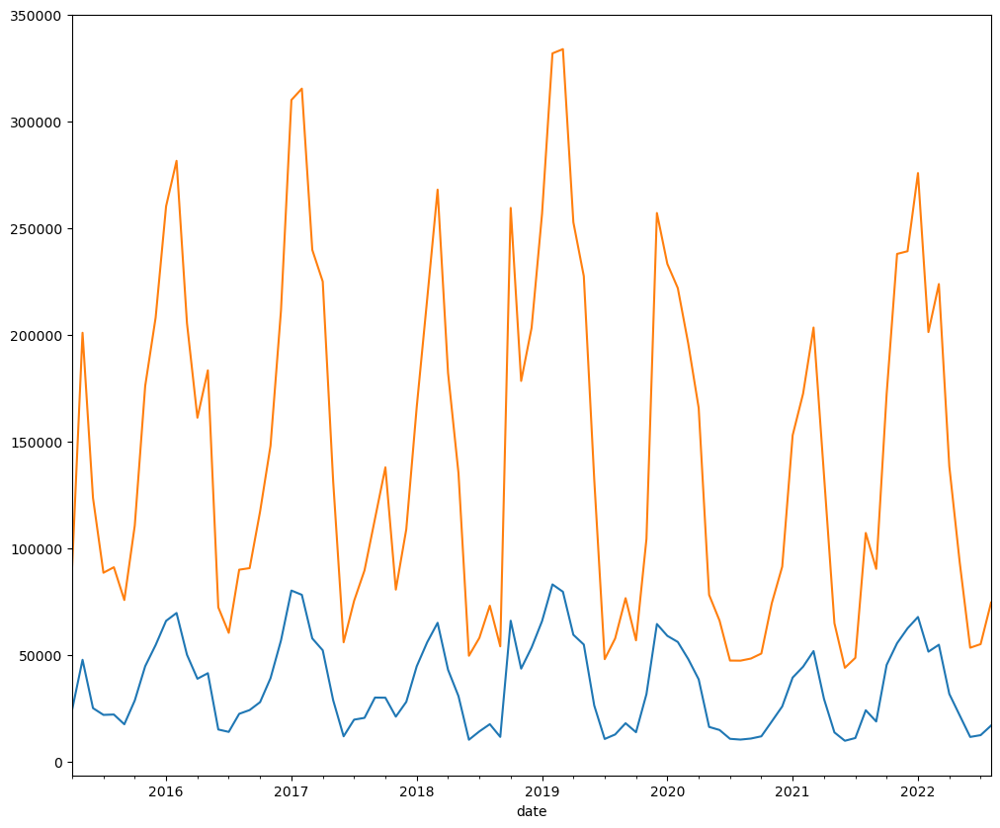

In [56]:
smap_abb.groupby(level=1).sum()['SurfaceSM_acft'].plot()
smap_abb.groupby(level=1).sum()['SubsurfaceSM_acft'].plot()


## SMAP v2

https://developers.google.com/earth-engine/datasets/catalog/NASA_SMAP_SPL4SMGP_007#bands 

<table class="eecat">
<tbody><tr>
<th scope="col">Name</th>
<th scope="col">Units</th>
<th scope="col">Min</th>
<th scope="col">Max</th>
<th scope="col">Description</th>
</tr>
<tr>
<td><code translate="no" dir="ltr">sm_<wbr>surface</code></td>
<td>Volume fraction</td>
<td>
          0
</td>
<td>
          0.9
</td>
<td><p>Top layer soil moisture (0-5 cm)</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">sm_<wbr>rootzone</code></td>
<td>Volume fraction</td>
<td>
          0
</td>
<td>
          0.9
</td>
<td><p>Root zone soil moisture (0-100 cm)</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">sm_<wbr>profile</code></td>
<td>Volume fraction</td>
<td>
          0
</td>
<td>
          0.9
</td>
<td><p>Total profile soil moisture (0 cm to model bedrock depth).</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">sm_<wbr>surface_<wbr>wetness</code></td>
<td></td>
<td>
          0
</td>
<td>
          1
</td>
<td><p>Top layer soil wetness (0-5 cm;wetness units). Soil wetness units (dimensionless) vary between 0 and 1,
        indicating relative saturation between completely dry conditions and
        completely saturated conditions, respectively.</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">sm_<wbr>rootzone_<wbr>wetness</code></td>
<td></td>
<td>
          0
</td>
<td>
          1
</td>
<td><p>Root zone soil wetness (0-100 cm;wetness units). Soil wetness units (dimensionless) vary between 0 and 1,
        indicating relative saturation between completely dry conditions and
        completely saturated conditions, respectively.</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">sm_<wbr>profile_<wbr>wetness</code></td>
<td></td>
<td>
          0
</td>
<td>
          1
</td>
<td><p>Total profile soil wetness (0 cm to model bedrock depth;
wetness units).
Soil wetness units (dimensionless) vary between 0 and 1,
        indicating relative saturation between completely dry conditions and
        completely saturated conditions, respectively.</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">surface_<wbr>temp</code></td>
<td>K</td>
<td>
          180
</td>
<td>
          350
</td>
<td><p>Mean land surface temperature (including snow-covered land
area).
Excluding areas of open water and permanent ice</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">soil_<wbr>temp_<wbr>layer1</code></td>
<td>K</td>
<td>
          210
</td>
<td>
          350
</td>
<td><p>Soil temperature in layer 1 of soil heat diffusion model</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">soil_<wbr>temp_<wbr>layer2</code></td>
<td>K</td>
<td>
          210
</td>
<td>
          330
</td>
<td><p>Soil temperature in layer 2 of soil heat diffusion model</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">soil_<wbr>temp_<wbr>layer3</code></td>
<td>K</td>
<td>
          215
</td>
<td>
          325
</td>
<td><p>Soil temperature in layer 3 of soil heat diffusion model</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">soil_<wbr>temp_<wbr>layer4</code></td>
<td>K</td>
<td>
          220
</td>
<td>
          325
</td>
<td><p>Soil temperature in layer 4 of soil heat diffusion model</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">soil_<wbr>temp_<wbr>layer5</code></td>
<td>K</td>
<td>
          225
</td>
<td>
          325
</td>
<td><p>Soil temperature in layer 5 of soil heat diffusion model</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">soil_<wbr>temp_<wbr>layer6</code></td>
<td>K</td>
<td>
          230
</td>
<td>
          320
</td>
<td><p>Soil temperature in layer 6 of soil heat diffusion model</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">snow_<wbr>mass</code></td>
<td>kg/m^2</td>
<td>
          0
</td>
<td>
          10000
</td>
<td><p>Average snow mass (or snow water equivalent) over land
          fraction of grid cell</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">snow_<wbr>depth</code></td>
<td>m</td>
<td>
          0
</td>
<td>
          50
</td>
<td><p>Snow depth within snow-covered land fraction of grid cell</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">land_<wbr>evapotranspiration_<wbr>flux</code></td>
<td>kg/m^2/s</td>
<td>
          -0.001
</td>
<td>
          0.001
</td>
<td><p>Evapotranspiration from land</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">overland_<wbr>runoff_<wbr>flux</code></td>
<td>kg/m^2/s</td>
<td>
          0
</td>
<td>
          0.05
</td>
<td><p>Overland (surface) runoff (including throughflow)</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">baseflow_<wbr>flux</code></td>
<td>kg/m^2/s</td>
<td>
          0
</td>
<td>
          0.01
</td>
<td><p>Baseflow</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">snow_<wbr>melt_<wbr>flux</code></td>
<td>kg/m^2/s</td>
<td>
          0
</td>
<td>
          0.05
</td>
<td><p>Snowmelt</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">soil_<wbr>water_<wbr>infiltration_<wbr>flux</code></td>
<td>kg/m^2/s</td>
<td>
          0
</td>
<td>
          0.05
</td>
<td><p>Soil water infiltration rate</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">land_<wbr>fraction_<wbr>saturated</code></td>
<td></td>
<td>
          0
</td>
<td>
          1
</td>
<td><p>Fractional land area that is saturated and snow-free</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">land_<wbr>fraction_<wbr>unsaturated</code></td>
<td></td>
<td>
          0
</td>
<td>
          1
</td>
<td><p>Fractional land area that is unsaturated (but non-wilting)
and snow-free</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">land_<wbr>fraction_<wbr>wilting</code></td>
<td></td>
<td>
          0
</td>
<td>
          1
</td>
<td><p>Fractional land area that is wilting and snow-free</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">land_<wbr>fraction_<wbr>snow_<wbr>covered</code></td>
<td></td>
<td>
          0
</td>
<td>
          1
</td>
<td><p>Fractional land area that is snowcovered</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">heat_<wbr>flux_<wbr>sensible</code></td>
<td>W/m^2</td>
<td>
          -2500
</td>
<td>
          3000
</td>
<td><p>Sensible heat flux from land</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">heat_<wbr>flux_<wbr>latent</code></td>
<td>W/m^2</td>
<td>
          -2500
</td>
<td>
          3000
</td>
<td><p>Latent heat flux from land</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">heat_<wbr>flux_<wbr>ground</code></td>
<td>W/m^2</td>
<td>
          -1000
</td>
<td>
          1000
</td>
<td><p>Downward ground heat flux into layer 1 of soil heat
diffusion model</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">net_<wbr>downward_<wbr>shortwave_<wbr>flux</code></td>
<td>W/m^2</td>
<td>
          0
</td>
<td>
          1365
</td>
<td><p>Net downward shortwave flux over land</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">net_<wbr>downward_<wbr>longwave_<wbr>flux</code></td>
<td>W/m^2</td>
<td>
          -1000
</td>
<td>
          200
</td>
<td><p>Net downward longwave flux over land</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">radiation_<wbr>shortwave_<wbr>downward_<wbr>flux</code></td>
<td>W/m^2</td>
<td>
          0
</td>
<td>
          1500
</td>
<td><p>Downward shortwave flux incident on the surface</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">radiation_<wbr>longwave_<wbr>absorbed_<wbr>flux</code></td>
<td>W/m^2</td>
<td>
          35
</td>
<td>
          800
</td>
<td><p>Absorbed (downward) longwave radiation at the surface</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">precipitation_<wbr>total_<wbr>surface_<wbr>flux</code></td>
<td>kg m^-2 s^-2</td>
<td>
          0
</td>
<td>
          0.05
</td>
<td><p>Total surface precipitation (incl. snow fall)</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">snowfall_<wbr>surface_<wbr>flux</code></td>
<td>kg m^-2 s^-2</td>
<td>
          0
</td>
<td>
          0.05
</td>
<td><p>Surface snow fall </p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">surface_<wbr>pressure</code></td>
<td>K</td>
<td>
          40000
</td>
<td>
          110000
</td>
<td><p>Mean land surface temperature (incl. snow-covered land area)</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">height_<wbr>lowatmmodlay</code></td>
<td>m</td>
<td>
          40
</td>
<td>
          80
</td>
<td><p>Center height of lowest atmospheric model layer</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">temp_<wbr>lowatmmodlay</code></td>
<td>K</td>
<td>
          180
</td>
<td>
          350
</td>
<td><p>Air temperature at center height of lowest atmospheric
          model layer</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">specific_<wbr>humidity_<wbr>lowatmmodlay</code></td>
<td>Mass fraction</td>
<td>
          0
</td>
<td>
          0.4
</td>
<td><p>Air specific humidity at center height of lowest
atmospheric model layer</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">windspeed_<wbr>lowatmmodlay</code></td>
<td>m/s</td>
<td>
          -60
</td>
<td>
          60
</td>
<td><p>Surface wind speed at center height of lowest atmospheric
model layer</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">vegetation_<wbr>greenness_<wbr>fraction</code></td>
<td></td>
<td>
          0
</td>
<td>
          1
</td>
<td><p>Vegetation "greenness" or fraction of transpiring leaves
averaged over the land area* of the grid cell.</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">leaf_<wbr>area_<wbr>index</code></td>
<td>Area fraction</td>
<td>
          0
</td>
<td>
          10
</td>
<td><p>Vegetation leaf area index</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">sm_<wbr>rootzone_<wbr>pctl</code></td>
<td>%</td>
<td>
          0
</td>
<td>
          100
</td>
<td><p>Root zone soil moisture (0-100 cm; percentile units)</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">sm_<wbr>profile_<wbr>pctl</code></td>
<td>%</td>
<td>
          0
</td>
<td>
          100
</td>
<td><p>Total profile soil moisture (0 cm to model bedrock depth;
percentile units)</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">depth_<wbr>to_<wbr>water_<wbr>table_<wbr>from_<wbr>surface_<wbr>in_<wbr>peat</code></td>
<td>m</td>
<td>
          -5
</td>
<td>
          0.15
</td>
<td><p>Depth to water table from mean surface elevation in
peatlands (positive above ground)</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">free_<wbr>surface_<wbr>water_<wbr>on_<wbr>peat_<wbr>flux</code></td>
<td>kg/m^2/s</td>
<td>
          -0.001
</td>
<td>
          0.001
</td>
<td><p>Change in free surface water storage on peatlands</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">mwrtm_<wbr>vegopacity</code></td>
<td></td>
<td>
          0
</td>
<td>
          2.5
</td>
<td><p>Microwave radiative transfer model: Vegetation opacity.</p></td>
</tr>
<tr>
<td><code translate="no" dir="ltr">sm_<wbr>surface_<wbr>anomaly</code></td>
<td></td>
<td>
</td>
<td>
</td>
<td><p>Experimental. Difference of the 30-day average of 'sm_surface',
centered on asset date, relative to the same 30-day period averaged
across years from 2015 to present, excluding asset year.</p>
<p>See
<a href="https://github.com/google/earthengine-community/blob/master/datasets/smap_anomaly_l4.py">this script</a>
for anomaly computations.</p></td>
</tr>
</tbody></table>

In [57]:
smapv2 = pd.read_parquet(parquet_dir / "MonthlySMAPv2.parquet")
smapv2['date'] = smapv2['date'].str[-13:]



#smapv2['date'] = smapv2['date'].apply(lambda x: pd.to_datetime(x, format='%Y%m%d_%H%M'),1)
smapv2['date'] = pd.to_datetime(smapv2['date'], format='%Y%m%d_%H%M')
smapv2['hucname'] = smapv2['site']

smapv2 = smapv2[['area','hucname','sm_rootzone','date']].set_index(['hucname','date'])
#smap = smap.drop(['system:index','.geo'],axis=1)
smapv2['SubsurfaceSM_acft'] = smapv2['sm_rootzone']*smapv2['area']*0.000810714
#smap['SurfaceSM_acft'] = smap['SurfaceSM']*smap['area']*0.001*0.000810714

In [58]:

smapv2_abb = smapv2.reset_index().groupby(['hucname',pd.Grouper(key='date', freq="MS")])[['SubsurfaceSM_acft',
                                                                          ]].mean(numeric_only=True)

smapv2_abb.to_parquet(save_place / "smapv2_mo_hydrodiv.parquet")

smapv2_abb

SubsurfaceSM_acft
hucname date                         
2       2015-03-01       39217.809906
        2015-04-01       38051.701934
        2015-05-01       39164.233490
        2015-06-01       38109.173403
        2015-07-01       34835.713119
...                               ...
120     2022-08-01        9316.018518
        2022-09-01        9013.806850
        2022-10-01        9046.767175
        2022-11-01        9972.998594
        2022-12-01       10260.801650

[2820 rows x 1 columns]

<Axes: xlabel='date'>

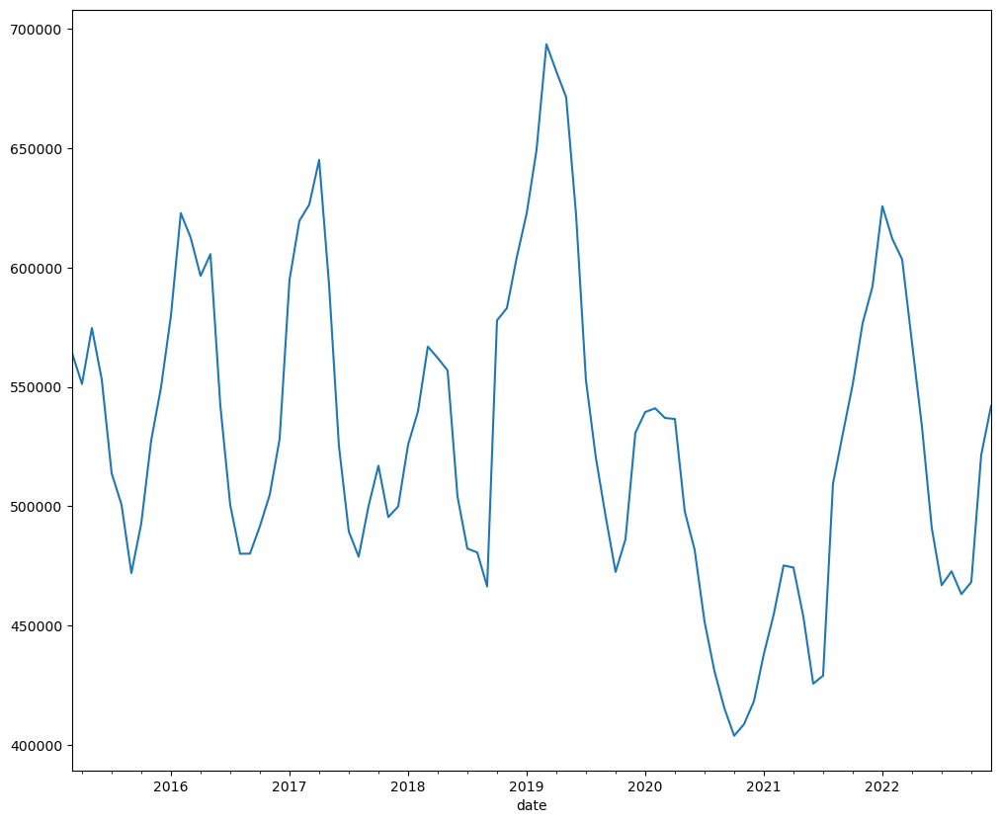

In [59]:

smapv2_abb.groupby(level=1).sum()['SubsurfaceSM_acft'].plot()


# Combine Data

In [60]:
smap_abb

SubsurfaceSM_acft  SurfaceSM_acft
hucname date                                         
2       2015-04-01        5392.854074     1423.398299
        2015-05-01       14865.104168     3420.192537
        2015-06-01        7475.408129     1407.566994
        2015-07-01        4956.769241     1156.583952
        2015-08-01        5934.633514     1330.792543
...                               ...             ...
120     2022-04-01        1887.564976      419.562483
        2022-05-01        1160.990015      257.044203
        2022-06-01         750.171483      154.274749
        2022-07-01         819.693564      178.365714
        2022-08-01        1252.420067      274.623821

[2670 rows x 2 columns]

In [61]:
pmlmo = pd.read_parquet(save_place / "pml_mo.parquet")
terra_mo = pd.read_parquet(save_place / "terra_mo_hydrodiv.parquet")
daymetmo = pd.read_parquet(save_place / "daymet_mo_hydrodiv.parquet")
oet_sorted = pd.read_parquet(save_place / "openet_hydrodiv.parquet")
gpm_sorted = pd.read_parquet(save_place / "gpm_monthly_hydrodiv.parquet")
prism_abb = pd.read_parquet(save_place / "prism_mo_hydrodiv.parquet")
smap_abb = pd.read_parquet(save_place / "smap_mo_hydrodiv.parquet")

ssebp_abb = pd.read_csv(save_place / 'ssebop_mo.csv',  parse_dates=True,
                       index_col=['hucname','date']).sort_index()
compiled = pd.concat([pmlmo, terra_mo, daymetmo, oet_sorted['openet_aet_acft'], gpm_sorted['gpm_ppt_acft'], prism_abb,
                      smap_abb,ssebp_abb['ssebop_aet']],sort=True,axis=1)

C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_17808\1687073088.py:9: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  ssebp_abb = pd.read_csv(save_place / 'ssebop_mo.csv',  parse_dates=True,


In [152]:
#pmlmo = pd.read_csv(save_place / "pml_mo.csv", parse_dates=True,
#                    index_col=['hucname','date']).sort_index()
#terra_mo = pd.read_csv(save_place / "terra_mo_hydrodiv.csv",  parse_dates=True,
#                       index_col=['hucname','date']).sort_index()
#daymetmo = pd.read_csv(save_place / "daymet_mo_hydrodiv.csv",  parse_dates=True,
#                       index_col=['hucname','date']).sort_index()
#oet_sorted = pd.read_csv(save_place / "openet_hydrodiv.csv", parse_dates=True, 
#                         index_col=['hucname','date']).sort_index()
#gpm_sorted = pd.read_csv(save_place / "gpm_monthly_hydrodiv.csv",  parse_dates=True,
#                         index_col=['hucname','date']).sort_index()
#prism_abb = pd.read_csv(save_place / "prism_mo_hydrodiv.csv", parse_dates=True, 
#                        index_col=['hucname','date']).sort_index()
#smap_abb = pd.read_csv(save_place / "smap_mo_hydrodiv.csv",  parse_dates=True,
#                       index_col=['hucname','date']).sort_index()

#ssebp_abb = pd.read_csv(save_place / 'ssebop_mo.csv',  parse_dates=True,
#                       index_col=['hucname','date']).sort_index()
#compiled = pd.concat([pmlmo,terra_mo,daymetmo,oet_sorted,gpm_sorted,prism_abb,
#                      smap_abb,ssebp_abb['ssebop_aet']],sort=True,axis=1)

for col in compiled.columns:
    if 'acft' in col:
        new_col = col[:-5]
    else:
        new_col = col

    if col == 'SubsurfaceSM':
        new_col = 'smap_soil'
    #print(new_col)
    compiled = compiled.rename(columns={col:new_col})
    
hydrodivs = gpd.read_file(gis_path / 'Valley_Hydrogeologic_Divisions.shp')
combined = pd.merge(hydrodivs, compiled.reset_index(), left_on='ID', right_on='hucname').set_index(['ID','date'])

# Comparison of Datasets

This is a bunch of comparison stuff.  It compares the various remote sensing data.  You may not need to run it if you just pick one dataset.

In [153]:
compiled['wateryear'] = compiled.reset_index().set_index('date').index.shift(-9,freq='M').year+1
comp_wy = compiled.groupby('wateryear').sum()#.plot()

def replacezero(x):
    if x == 0:
        return None
    else:
        return x
    
for col in comp_wy.columns:
    if "aet_" in col or "ppt_" in col:
        comp_wy[col] = comp_wy[col].apply(lambda x: np.where(x < 200000, np.nan,x))
    elif "aetsoil" in col or "aetveg" in col:
        comp_wy[col] = comp_wy[col].apply(lambda x: np.where(x < 90000, np.nan,x))

comp_wy = comp_wy[(comp_wy.index > 1980)&(comp_wy.index < 2022)]
    
compiled.to_csv(save_place / "combined_budget.csv")

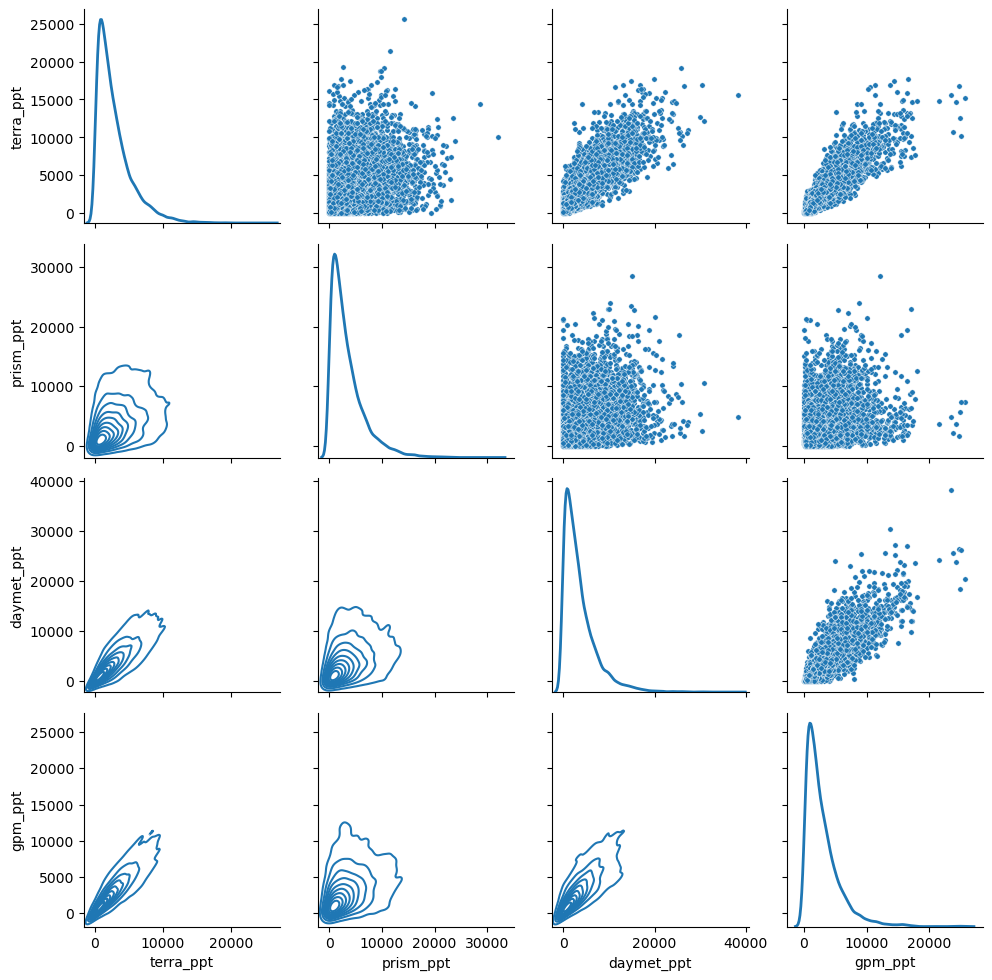

In [154]:
comp_ppt = compiled[['terra_ppt','prism_ppt','daymet_ppt','gpm_ppt']]
g = sns.PairGrid(comp_ppt, diag_sharey=False)
g.map_upper(sns.scatterplot, s=15)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot, lw=2)
#g.map_lower(corrfunc)

C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_15052\3983750786.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  comp_ppt['quarter'] = comp_ppt.reset_index().set_index('date').index.quarter


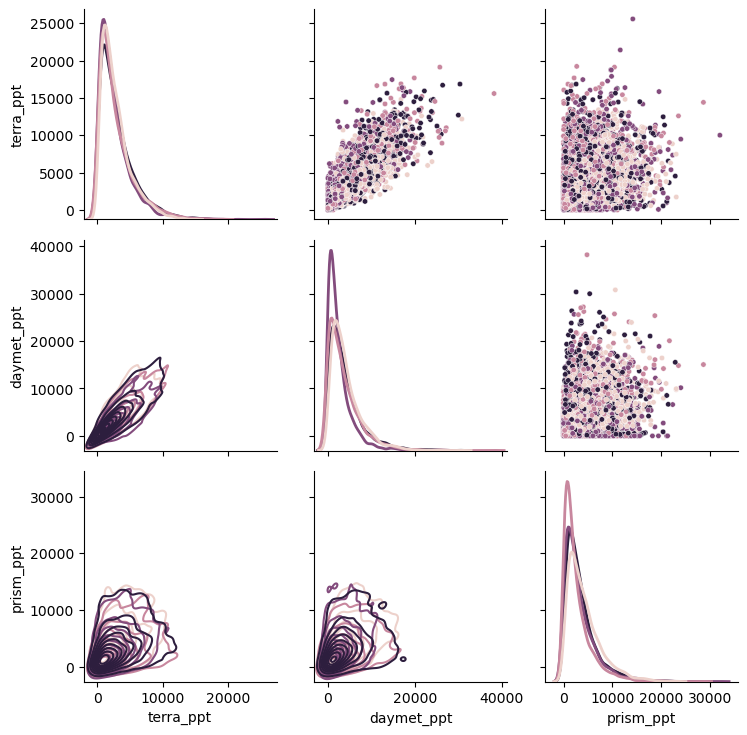

In [155]:
compiled
comp_ppt = compiled[['terra_ppt','daymet_ppt','prism_ppt']]
comp_ppt['quarter'] = comp_ppt.reset_index().set_index('date').index.quarter
g = sns.PairGrid(comp_ppt, diag_sharey=False,hue='quarter')
g.map_upper(sns.scatterplot, s=15)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot, lw=2)
#g.map_lower(corrfunc)

## Precip

In [156]:
comp_ppt_mo = compiled.groupby(level=1).sum()[['terra_ppt','prism_ppt','daymet_ppt','gpm_ppt']]
comp_ppt_mo = comp_ppt_mo[(comp_ppt_mo.index > pd.to_datetime('1984-09-30'))&(comp_ppt_mo.index < pd.to_datetime('2022-10-01'))]

comp_ppt = compiled[['terra_ppt','prism_ppt','daymet_ppt','gpm_ppt']]
comp_ppt['quarter'] = comp_ppt.reset_index().set_index('date').index.quarter

for col in comp_ppt_mo.columns:
    comp_ppt_mo[col] = comp_ppt_mo[col].apply(lambda x: np.where(x < 7000, np.nan,x))
    comp_ppt_mo[col] = comp_ppt_mo[col].interpolate(method='time')

C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_15052\1302787316.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  comp_ppt['quarter'] = comp_ppt.reset_index().set_index('date').index.quarter


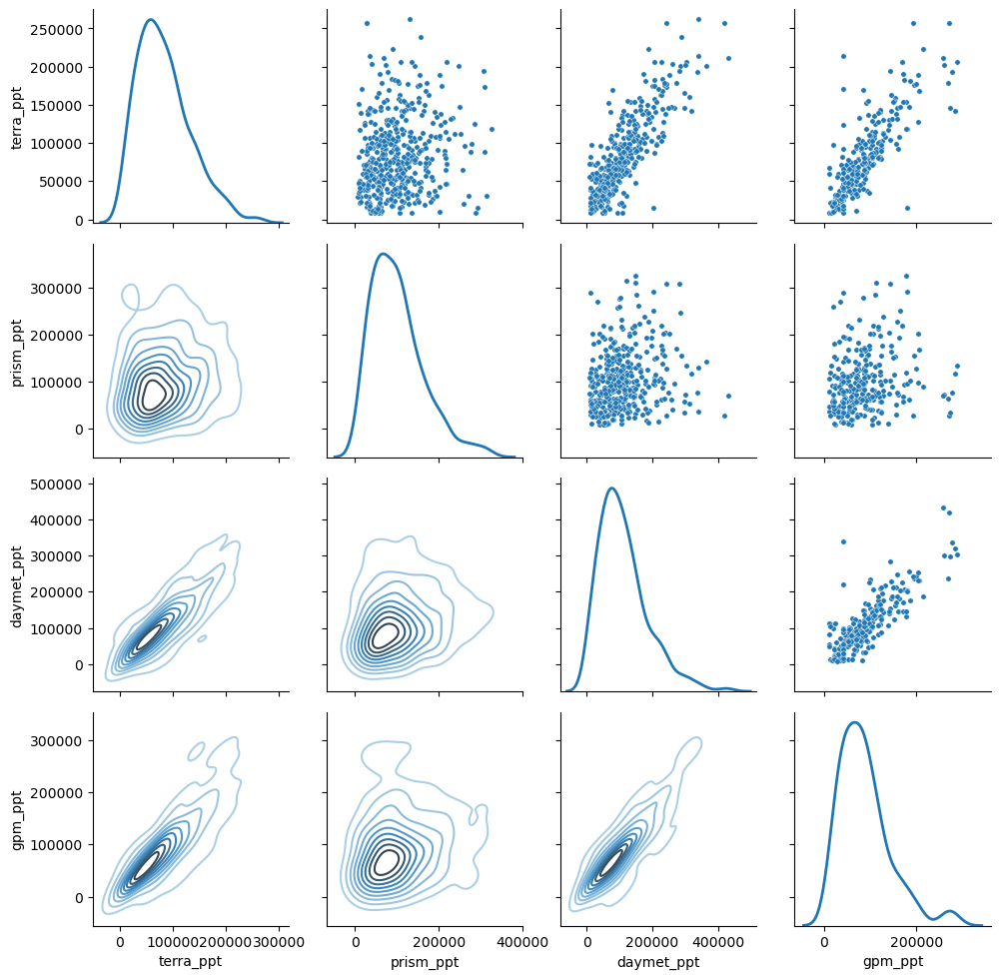

In [157]:
#compiled
#comp_ppt = compiled[['ppt_terra','ppt_daymet','ppt_prism']]
#comp_ppt['quarter'] = comp_ppt.reset_index().set_index('date').index.quarter

g = sns.PairGrid(comp_ppt_mo, diag_sharey=False)
g.map_upper(sns.scatterplot, s=15)
g.map_lower(sns.kdeplot, cmap="Blues_d")
g.map_diag(sns.kdeplot, lw=2)

### PRISM vs TERRA - PPT

C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_15052\3132134501.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  x1 = df1[f'{dataset_1}_{datatype}']*res.params[0]
C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_15052\3132134501.py:37: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if res.params[0]>1:
C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_15052\3132134501.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.il

prism is 0.945 times smaller than terra (r2 = 0.59)
Mean diff is -17760.19 and offset is -22348.32
Model MSE = 5795515831.864575
prism is 0.859 times smaller than terra (r2 = 0.65)
Mean diff is 0.00 and offset is -29597.71
Model MSE = 5044369371.650461


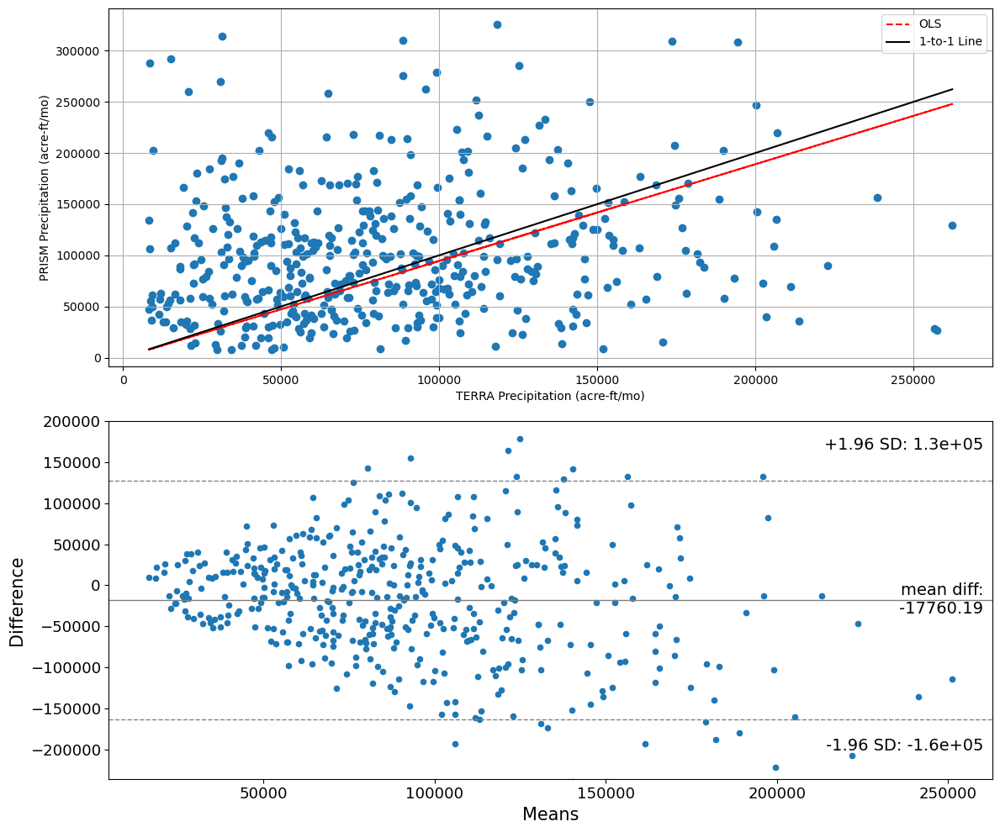

In [158]:
dataset_1 = 'terra'
dataset_2 = 'prism'
datatype = 'ppt'

diffs1, offset1, slope1 = plotcomparion(comp_ppt_mo, dataset_1, 
                                        dataset_2, datatype, slope_adj=1., offset_adj = 0, plot=True)
diffs2, offset2, slope2 = plotcomparion(comp_ppt_mo,
                                        dataset_1, 
                                dataset_2, 
                                datatype, 
                                slope_adj=slope1, 
                                offset_adj=offset1,
                                plot=False)
#offset3, slope3 = plotcomparion(dataset_1, dataset_2, datatype, slope1, offset2)

C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_15052\3132134501.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  x1 = df1[f'{dataset_1}_{datatype}']*res.params[0]
C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_15052\3132134501.py:37: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if res.params[0]>1:
C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_15052\3132134501.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.il

gpm is 1.033 times bigger than terra (r2 = 0.90)
Mean diff is -6755.71 and offset is -4086.80
Model MSE = 1122900765.1493766
gpm is 0.967 times smaller than terra (r2 = 0.90)
Mean diff is 0.00 and offset is -9432.09
Model MSE = 1094796498.4917517


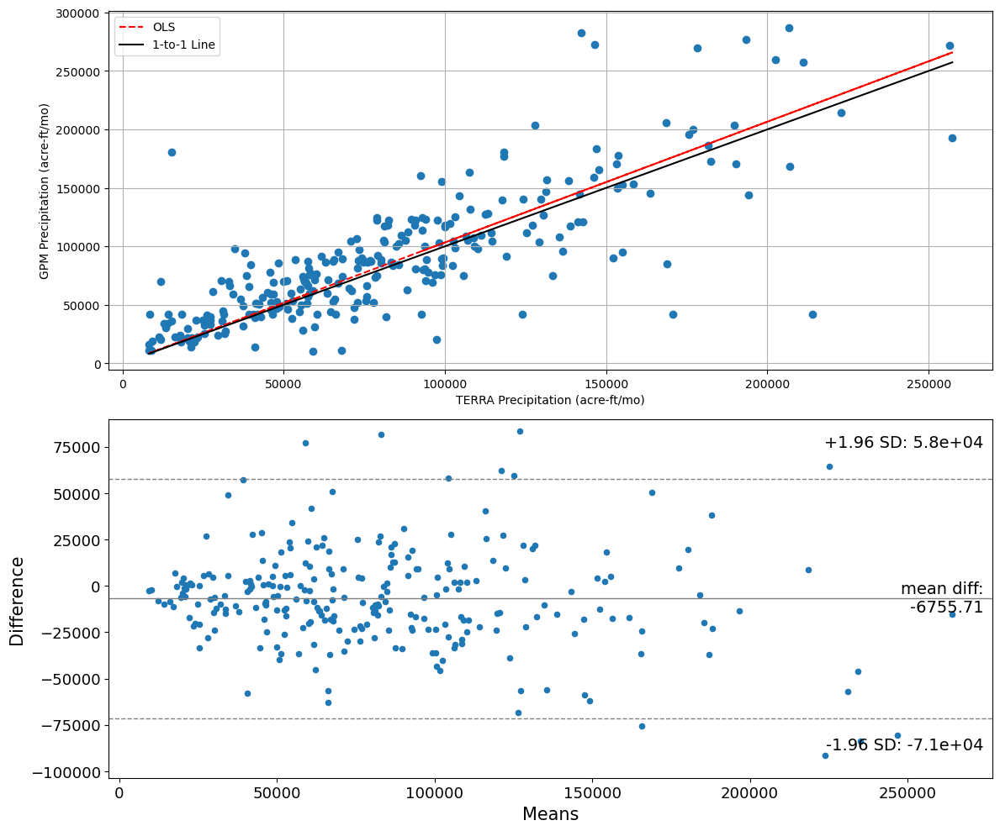

In [159]:
dataset_1 = 'terra'
dataset_2 = 'gpm'
datatype = 'ppt'

diffs1, offset1, slope1 = plotcomparion(comp_ppt_mo, dataset_1, 
                                        dataset_2, datatype, slope_adj=1., offset_adj = 0, plot=True)
diffs2, offset2, slope2 = plotcomparion(comp_ppt_mo,
                                        dataset_1, 
                                dataset_2, 
                                datatype, 
                                slope_adj=slope1, 
                                offset_adj=offset1,
                                plot=False)

C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_15052\3132134501.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  x1 = df1[f'{dataset_1}_{datatype}']*res.params[0]
C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_15052\3132134501.py:37: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if res.params[0]>1:
C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_15052\3132134501.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.il

prism is 0.875 times smaller than gpm (r2 = 0.58)
Mean diff is -13001.01 and offset is -23995.31
Model MSE = 5976379274.557858
prism is 0.853 times smaller than gpm (r2 = 0.64)
Mean diff is -0.00 and offset is -25942.61
Model MSE = 5125719658.575001


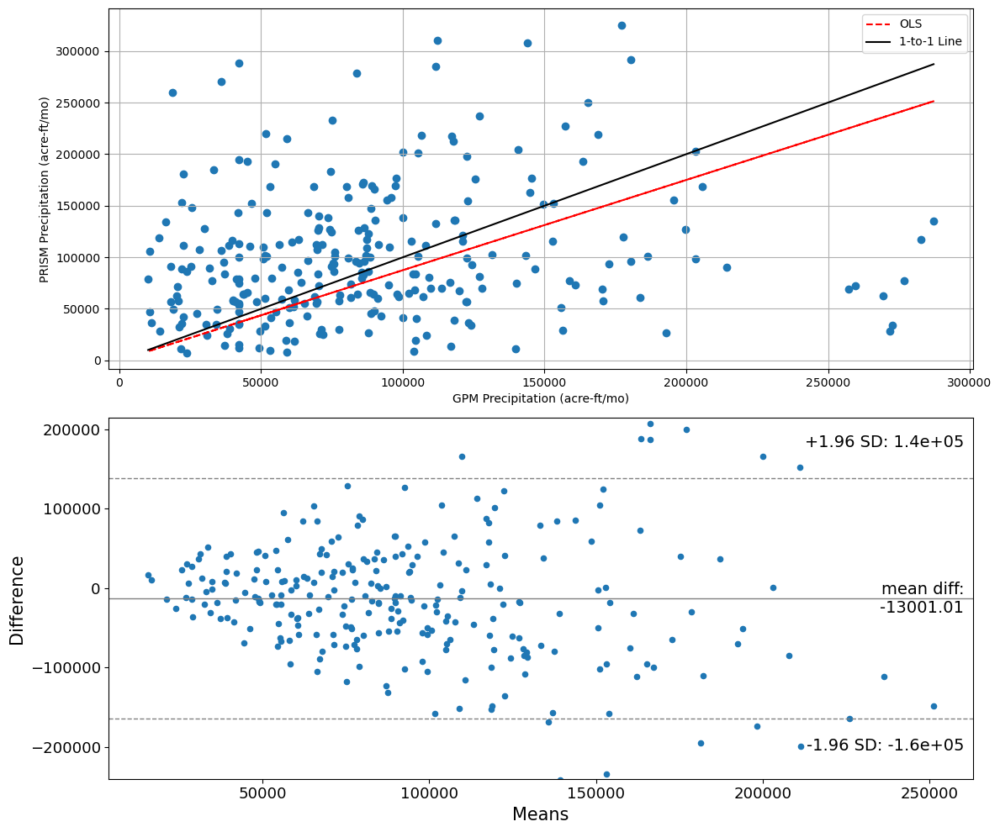

In [160]:
dataset_1 = 'gpm'
dataset_2 = 'prism'
datatype = 'ppt'

diffs1, offset1, slope1 = plotcomparion(comp_ppt_mo, dataset_1, 
                                        dataset_2, datatype, slope_adj=1., offset_adj = 0, plot=True)
diffs2, offset2, slope2 = plotcomparion(comp_ppt_mo,
                                        dataset_1, 
                                dataset_2, 
                                datatype, 
                                slope_adj=slope1, 
                                offset_adj=offset1,
                                plot=False)

### TERRA VS DAYMET - PPT

C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_15052\3132134501.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  x1 = df1[f'{dataset_1}_{datatype}']*res.params[0]
C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_15052\3132134501.py:37: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if res.params[0]>1:
C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_15052\3132134501.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.il

daymet is 1.304 times bigger than terra (r2 = 0.91)
Mean diff is -27737.37 and offset is -2244.87
Model MSE = 1663346255.4507582
daymet is 0.985 times smaller than terra (r2 = 0.91)
Mean diff is 0.00 and offset is -28962.25
Model MSE = 1654699647.6813025


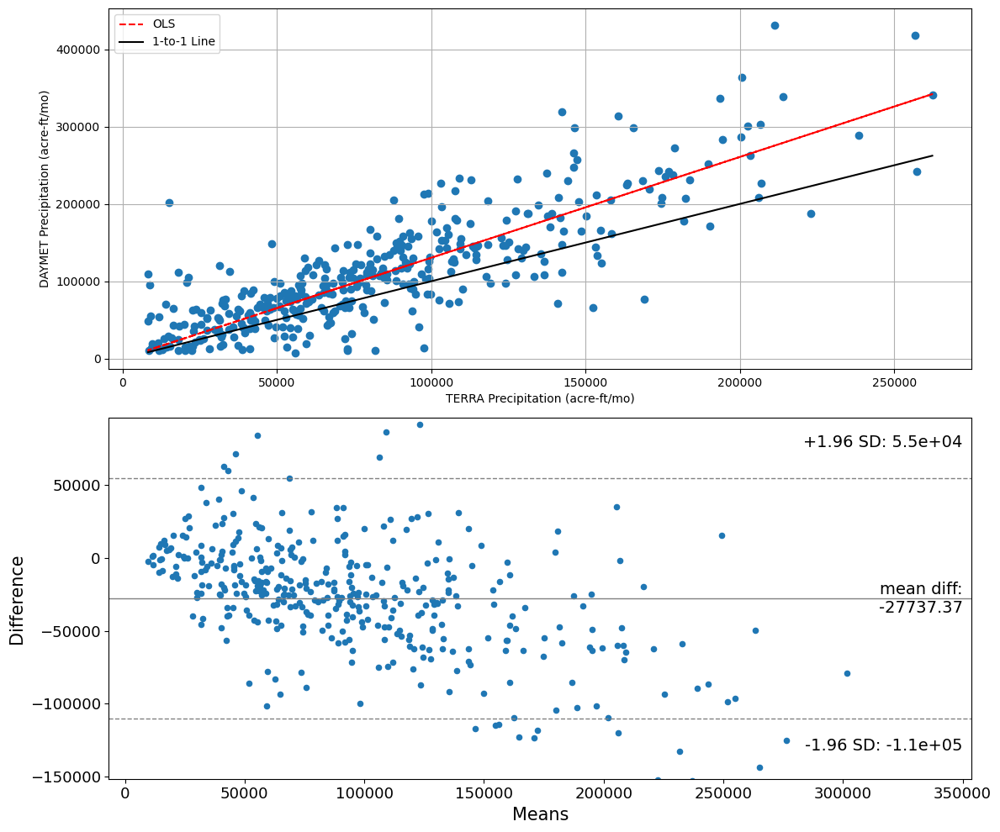

In [161]:
dataset_1 = 'terra'
dataset_2 = 'daymet'
datatype = 'ppt'

diffs1, offset1, slope1 = plotcomparion(comp_ppt_mo,
                                        dataset_1, dataset_2, datatype, slope_adj=1., offset_adj = 0, plot=True)
diffs2, offset2, slope2 = plotcomparion(comp_ppt_mo,
                                        dataset_1, 
                                dataset_2, 
                                datatype, 
                                slope_adj=slope1, 
                                offset_adj=offset1,
                                plot=False)

C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_15052\3132134501.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  x1 = df1[f'{dataset_1}_{datatype}']*res.params[0]
C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_15052\3132134501.py:37: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if res.params[0]>1:
C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_15052\3132134501.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.il

daymet is 1.191 times bigger than gpm (r2 = 0.90)
Mean diff is -19598.57 and offset is -2827.76
Model MSE = 1625361010.0258424
daymet is 0.981 times smaller than gpm (r2 = 0.91)
Mean diff is 0.00 and offset is -21233.23
Model MSE = 1611810178.8241236


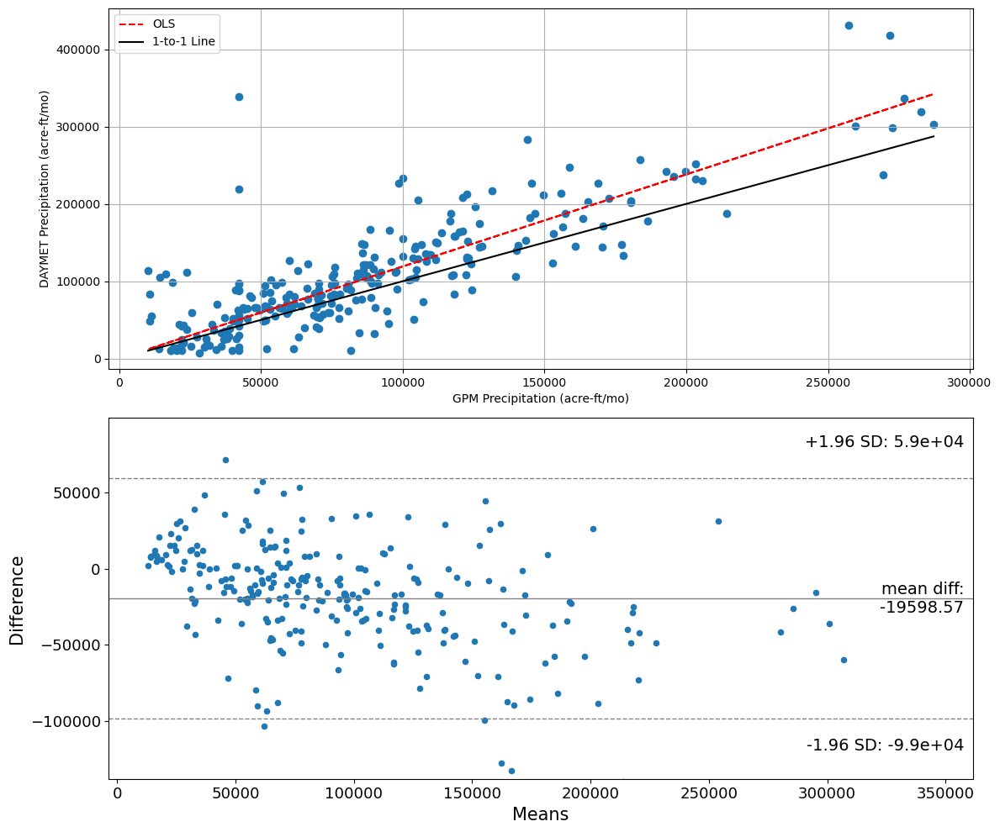

In [162]:
dataset_1 = 'gpm'
dataset_2 = 'daymet'
datatype = 'ppt'

diffs1, offset1, slope1 = plotcomparion(comp_ppt_mo,
                                        dataset_1, dataset_2, datatype, slope_adj=1., offset_adj = 0, plot=True)
diffs2, offset2, slope2 = plotcomparion(comp_ppt_mo,
                                        dataset_1, 
                                dataset_2, 
                                datatype, 
                                slope_adj=slope1, 
                                offset_adj=offset1,
                                plot=False)

## AET

In [167]:
compaet.columns

Index(['Bdrk_v_Val', 'WRarea', 'Watershed', 'Notes', 'Shape_Leng',
       'Shape_Area', 'geometry', 'hucname', 'PML_Soil_Evap', 'PML_Veg_Trans',
       'PML_Veg_Intercept', 'pml_aet', 'terra_aet', 'terra_def', 'terra_ppt',
       'terra_ro', 'terra_soil', 'terra_swe', 'daymet_ppt', 'daymet_swe',
       'openet_aet', 'gpm_ppt', 'prism_ppt', 'SubsurfaceSM', 'SurfaceSM',
       'ssebop_aet'],
      dtype='object')

In [168]:
compaet = combined.copy(deep=True)
compaet = compaet[['openet_aet','pml_aet','terra_aet','ssebop_aet']]

<Axes: xlabel='date'>

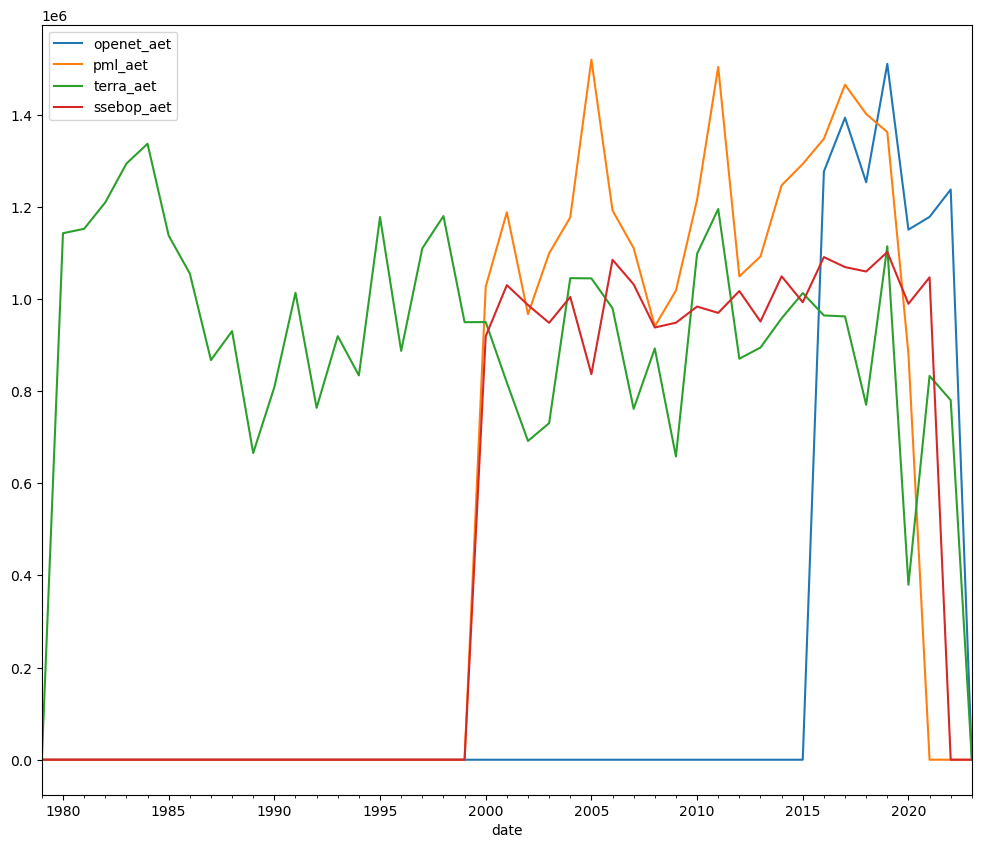

In [169]:
compaet.groupby(level=1).sum().groupby(pd.Grouper(freq='Y')).sum().plot()

C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_15052\3438426786.py:15: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.plot(df['pml_aet'],df['pml_aet']*fitline.params[1] + fitline.params[0], label='best fit line',color='red')


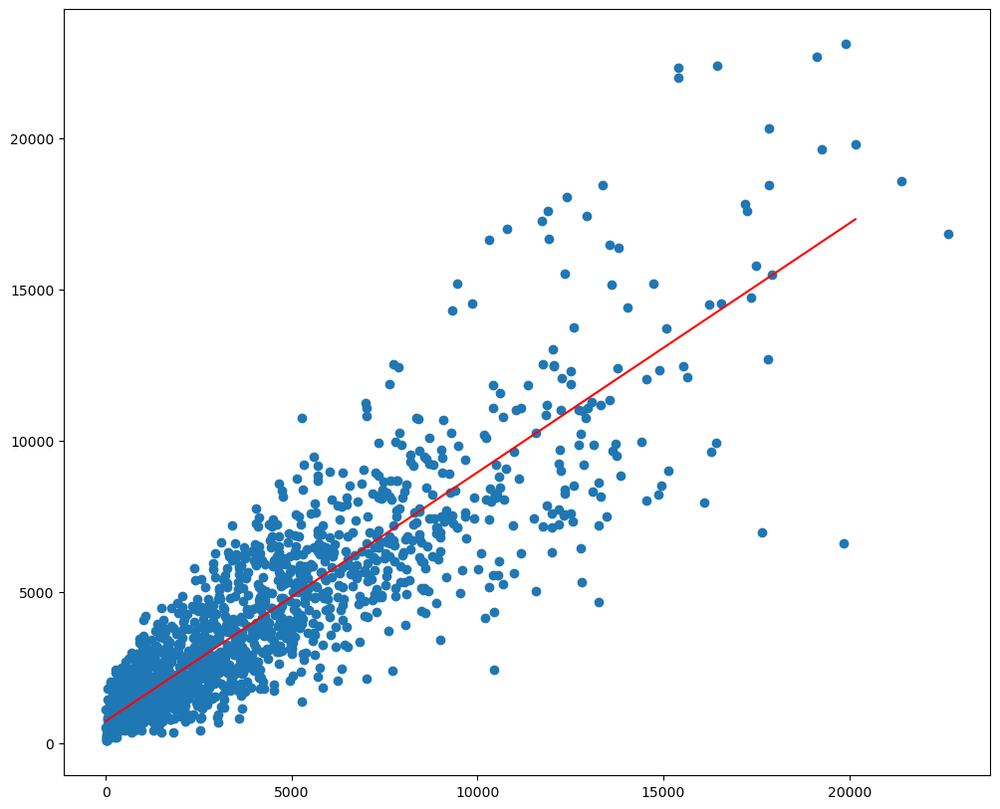

In [170]:
plt.scatter(compaet['pml_aet'],compaet['openet_aet'])

df = compaet.sort_values('pml_aet').dropna()
#define predictor and response variables
y = df['openet_aet']
x = df['pml_aet']

#add constant to predictor variables
X = sm.add_constant(x)

#fit linear regression model
fitline = sm.RLM(y, X).fit()
#predictions = fitline.get_prediction()

plt.plot(df['pml_aet'],df['pml_aet']*fitline.params[1] + fitline.params[0], label='best fit line',color='red')

In [171]:
print(fitline.params[1], fitline.params[0])

0.8238287185011381 720.9988575531434


C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_15052\3862467270.py:1: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(fitline.params[1], fitline.params[0])


C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_15052\2677722772.py:15: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.plot(df['pml_aet'],df['pml_aet']*fitlinet.params[1] + fitlinet.params[0], label='best fit line',color='red')


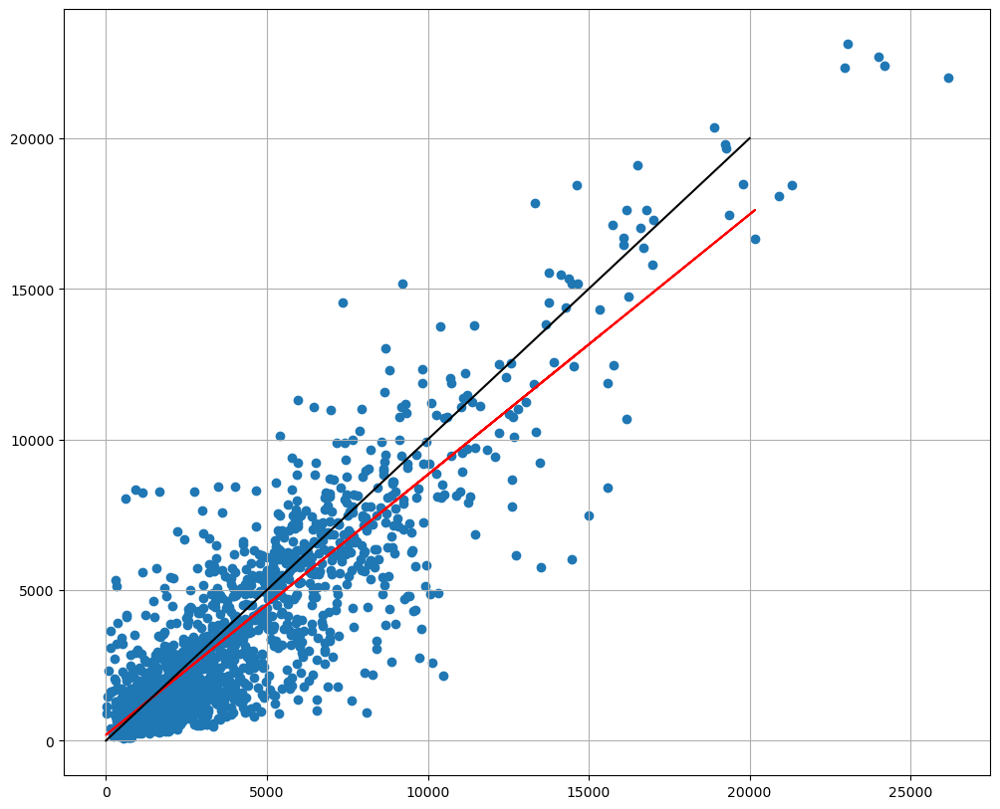

In [172]:
plt.scatter(compaet['ssebop_aet'],compaet['openet_aet'])

df = compaet.sort_values('ssebop_aet').dropna()
#define predictor and response variables
y = df['openet_aet']
x = df['ssebop_aet']

#add constant to predictor variables
X = sm.add_constant(x)

#fit linear regression model
fitlinet = sm.OLS(y, X).fit()
predictionst = fitlinet.get_prediction()

plt.plot(df['pml_aet'],df['pml_aet']*fitlinet.params[1] + fitlinet.params[0], label='best fit line',color='red')
plt.plot(range(0,20000),range(0,20000),color='black')
plt.grid()

In [173]:
print(fitline.params[1], fitline.params[0])
print(fitlinet.params[1], fitlinet.params[0])

0.8238287185011381 720.9988575531434
0.8642672559151253 188.8914019070496


C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_15052\3701136821.py:1: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(fitline.params[1], fitline.params[0])
C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_15052\3701136821.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(fitlinet.params[1], fitlinet.params[0])


In [174]:
fitline.rsquared

AttributeError: 'RLMResults' object has no attribute 'rsquared'

### TERRA vs PML - AET

In [175]:
comp_aet_mo['terrashift_aet'] = comp_aet_mo['terra_aet'].shift(3)
dataset_1 = 'terrashift'
dataset_2 = 'pml'
datatype = 'aet'

diffs1, offset1, slope1 = plotcomparion(comp_aet_mo, dataset_1, dataset_2, datatype, slope_adj=1., offset_adj = 0, plot=True)
diffs2, offset2, slope2 = plotcomparion(comp_aet_mo, dataset_1, 
                                dataset_2, 
                                datatype, 
                                slope_adj=slope1, 
                                offset_adj=offset1,
                                plot=False)

NameError: name 'comp_aet_mo' is not defined

### MODIS vs PML - AET

In [ ]:
dataset_1 = 'modis'
dataset_2 = 'pml'
datatype = 'aet'

diffs1, offset1, slope1 = plotcomparion(comp_aet_mo, dataset_1, dataset_2, datatype, slope_adj=1., offset_adj = 0, plot=True)
diffs2, offset2, slope2 = plotcomparion(comp_aet_mo, dataset_1, 
                                dataset_2, 
                                datatype, 
                                slope_adj=slope1, 
                                offset_adj=offset1,
                                plot=False)

In [ ]:
dataset_1 = 'pml'
dataset_2 = 'ssebop'
datatype = 'aet'

diffs1, offset1, slope1 = plotcomparion(comp_aet_mo, dataset_1, dataset_2, datatype, slope_adj=1., offset_adj = 0, plot=True)
diffs2, offset2, slope2 = plotcomparion(comp_aet_mo, dataset_1, 
                                dataset_2, 
                                datatype, 
                                slope_adj=slope1, 
                                offset_adj=offset1,
                                plot=False)

# Zonal Algebra

In [16]:
pmlmo = pd.read_parquet(save_place / "pml_mo.parquet")
terra_mo = pd.read_parquet(save_place / "terra_mo_hydrodiv.parquet")
terra_mo = terra_mo.reset_index().groupby(['hucname','date']).mean()
daymetmo = pd.read_parquet(save_place / "daymet_mo_hydrodiv.parquet")
oet_sorted = pd.read_parquet(save_place / "openet_hydrodiv.parquet")
gpm_sorted = pd.read_parquet(save_place / "gpm_monthly_hydrodiv.parquet")
prism_abb = pd.read_parquet(save_place / "prism_mo_hydrodiv.parquet")
smap_abb = pd.read_parquet(save_place / "smap_mo_hydrodiv.parquet")
modis_abb = pd.read_parquet(save_place / "modis_mo.parquet")
modis_abb.index = modis_abb.index.rename('hucname',level=0)

swbwy = pd.read_parquet(save_place / "pahvant_basin_summary_monthly.parquet")
swbwy.index = swbwy.index.rename(['hucname', 'date'])
for col in swbwy.columns:
    swbwy = swbwy.rename(columns={col: f"swb_{col}"})

swbmo = pd.read_parquet(save_place / "pahvant_basin_summary_monthly_data.parquet")
swbmo.index = swbmo.index.rename(['hucname', 'date'])
for col in swbmo.columns:
    swbmo = swbmo.rename(columns={col: f"swb_{col}"})

priswy = pd.read_parquet(save_place / "prism_wy.parquet")

ssebp_abb = pd.read_csv(save_place / 'ssebop_mo.csv',  parse_dates=True,
                       index_col=['hucname','date']).sort_index()

compiled = pd.concat([pmlmo, modis_abb, swbmo, terra_mo, daymetmo, oet_sorted['openet_aet_acft'], gpm_sorted['gpm_ppt_acft'], prism_abb,
                      smap_abb,ssebp_abb['ssebop_aet']],sort=True,axis=1)

for col in compiled.columns:
    if 'acft' in col:
        new_col = col[:-5]
    else:
        new_col = col

    if col == 'SubsurfaceSM':
        new_col = 'smap_soil'
    #print(new_col)
    compiled = compiled.rename(columns={col:new_col})
    


C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_29844\2719221929.py:24: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  ssebp_abb = pd.read_csv(save_place / 'ssebop_mo.csv',  parse_dates=True,


In [17]:
hydrodivs = gpd.read_file(gis_path / 'Valley_Hydrogeologic_Divisions.shp')
combined = pd.merge(hydrodivs, compiled.reset_index(), left_on='ID', right_on='hucname').set_index(['ID','date'])

In [18]:
combined

Bdrk_v_Val       WRarea     Watershed Notes    Shape_Leng  \
ID  date                                                                   
2   1939-12-01     Valley  West Desert  Beaver River  None  132041.95338   
    1940-01-01     Valley  West Desert  Beaver River  None  132041.95338   
    1940-02-01     Valley  West Desert  Beaver River  None  132041.95338   
    1940-03-01     Valley  West Desert  Beaver River  None  132041.95338   
    1940-04-01     Valley  West Desert  Beaver River  None  132041.95338   
...                   ...          ...           ...   ...           ...   
120 2023-04-01     Basalt       Kanosh   The Cinders  None   45271.27035   
    2023-05-01     Basalt       Kanosh   The Cinders  None   45271.27035   
    2023-06-01     Basalt       Kanosh   The Cinders  None   45271.27035   
    2023-07-01     Basalt       Kanosh   The Cinders  None   45271.27035   
    2023-08-01     Basalt       Kanosh   The Cinders  None   45271.27035   

                  Shape_Area  \
ID  date                       
2   1939-12-01  4.006058e+08   
    1940-01-01  4.006058e+08   
    1940-02-01  4.006058e+08   
    1940-03-01  4.006058e+08   
    1940-04-01  4.006058e+08   
...                      ...   
120 2023-04-01  8.877817e+07   
    2023-05-01  8.877817e+07   
    2023-06-01  8.877817e+07   
    2023-07-01  8.877817e+07   
    2023-08-01  8.877817e+07   

                                                         geometry  hucname  \
ID  date                                                                     
2   1939-12-01  POLYGON Z ((-1451396.475 1877464.762 0.000, -1...        2   
    1940-01-01  POLYGON Z ((-1451396.475 1877464.762 0.000, -1...        2   
    1940-02-01  POLYGON Z ((-1451396.475 1877464.762 0.000, -1...        2   
    1940-03-01  POLYGON Z ((-1451396.475 1877464.762 0.000, -1...        2   
    1940-04-01  POLYGON Z ((-1451396.475 1877464.762 0.000, -1...        2   
...                                                           ...      ...   
120 2023-04-01  POLYGON Z ((-1411121.634 1890574.629 0.000, -1...      120   
    2023-05-01  POLYGON Z ((-1411121.634 1890574.629 0.000, -1...      120   
    2023-06-01  POLYGON Z ((-1411121.634 1890574.629 0.000, -1...      120   
    2023-07-01  POLYGON Z ((-1411121.634 1890574.629 0.000, -1...      120   
    2023-08-01  POLYGON Z ((-1411121.634 1890574.629 0.000, -1...      120   

                PML_Soil_Evap  PML_Veg_Trans  ...  terra_soil  terra_swe  \
ID  date                                      ...                          
2   1939-12-01            NaN            NaN  ...         NaN        NaN   
    1940-01-01            NaN            NaN  ...         NaN        NaN   
    1940-02-01            NaN            NaN  ...         NaN        NaN   
    1940-03-01            NaN            NaN  ...         NaN        NaN   
    1940-04-01            NaN            NaN  ...         NaN        NaN   
...                       ...            ...  ...         ...        ...   
120 2023-04-01            NaN            NaN  ...         NaN        NaN   
    2023-05-01            NaN            NaN  ...         NaN        NaN   
    2023-06-01            NaN            NaN  ...         NaN        NaN   
    2023-07-01            NaN            NaN  ...         NaN        NaN   
    2023-08-01            NaN            NaN  ...         NaN        NaN   

                daymet_ppt  daymet_swe  openet_aet  gpm_ppt     prism_ppt  \
ID  date                                                                    
2   1939-12-01         NaN         NaN         NaN      NaN   9561.741226   
    1940-01-01         NaN         NaN         NaN      NaN  12449.188950   
    1940-02-01         NaN         NaN         NaN      NaN   5219.719837   
    1940-03-01         NaN         NaN         NaN      NaN   8231.629663   
    1940-04-01         NaN         NaN         NaN      NaN    868.000457   
...                    ...         ...         ...      ...       

## Get Area of Valley Fill and Basalt

In [19]:
combined['Bdrk_v_Val'].unique()

array(['Valley', 'Bdrk', 'Basalt'], dtype=object)

In [20]:
bv_area = combined[combined['Bdrk_v_Val'].isin(['Basalt','Valley'])].groupby(level=0).mean(numeric_only=True)['Shape_Area'].sum()*0.000247105
print(f"Basalt and Valley Fill covers {bv_area:0.0f} acres")

Basalt and Valley Fill covers 699157 acres


In [21]:
v_area = np.sum(hydrodivs[(hydrodivs['Bdrk_v_Val']=='Valley')&(~hydrodivs['WRarea'].isin(['West Desert','Oasis','Clear Lake']))].geometry.area)*0.000247105
print(f"Valley Fill covers {v_area:0.0f} acres")

Valley Fill covers 273581 acres


## Corn Creek Comparison

In [302]:
url = "https://waterdata.usgs.gov/nwis/dv?cb_00060=on&format=rdb&site_no=10233500&legacy=&referred_module=sw&period=&begin_date=1965-08-01&end_date=1975-09-29"
corn = pd.read_table(url,comment="#")
corn = corn.drop([0],axis=0)
corn['datetime'] = pd.to_datetime(corn['datetime'])
corn = corn.rename(columns = {'143840_00060_00003':'cfs'})
corn['cfs'] = pd.to_numeric(corn['cfs'])
corn['cfd'] = 86400*corn['cfs']
corn = corn.drop(['agency_cd','143840_00060_00003_cd'],axis=1)
corn = corn.set_index('datetime')

corn = corn.interpolate()
corn['water year'] = corn.index.shift(-9, freq='M').year+1 

cornwy = corn.loc['1965-10-01':].groupby('water year').sum()
cornyr = corn.loc['1966-01-01':].groupby(corn.loc['1966-01-01':].index.year).sum()
cornwy['ac-ft'] = cornwy['cfd']*2.29569e-5
cornyr['ac-ft'] = cornyr['cfd']*2.29569e-5
print(f"Avg {cornwy['ac-ft'].mean():0.0f} acft per water year")
print(f"Avg {cornyr['ac-ft'].mean():0.0f} acft per year")

#43

corn_w_ppt_wy = pd.concat([priswy.loc[43],cornwy.drop(['site_no','cfs','cfd'],axis=1)],axis=1).dropna()

import statsmodels.api as sm

x = corn_w_ppt_wy['prism_ppt_volume_af'].values
y = corn_w_ppt_wy['ac-ft'].values

X = sm.add_constant(x)
model = sm.OLS(y, X)
results = model.fit()

results.summary()


Avg 12877 acft per water year
Avg 12755 acft per year


C:\Users\paulinkenbrandt\Anaconda3\envs\pygis311v2\Lib\site-packages\scipy\stats\_stats_py.py:1736: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.271
Model:                            OLS   Adj. R-squared:                  0.179
Method:                 Least Squares   F-statistic:                     2.967
Date:                Sat, 23 Dec 2023   Prob (F-statistic):              0.123
Time:                        09:04:19   Log-Likelihood:                -100.17
No. Observations:                  10   AIC:                             204.3
Df Residuals:                       8   BIC:                             205.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -4637.8154   1.03e+04     -0.448      0.666   -2.85e+04    1.92e+04
x1             0.1669      0.097      1.722      0.123      -0.057       0.390
==============================================================================
Omnibus:                        0.900   Durbin-Watson:                   1.598
Prob(Omnibus):                  0.638   Jarque-Bera (JB):                0.060
Skew:                          -0.190   Prob(JB):                        0.970
Kurtosis:                       3.015   Cond. No.                     5.76e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.76e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Comparsion of PRISM data to the limited available USGS Streamflow data of Corn Creek shows that precipitation makes up about 20% of the flow of the creek.  However, this relationship is very poorly defined.

SWB Avg 2166 acft/wy
TerraClimate Avg 5227 acft/wy
Corn Avg 12877 acft/wy


<Axes: xlabel='wateryear'>

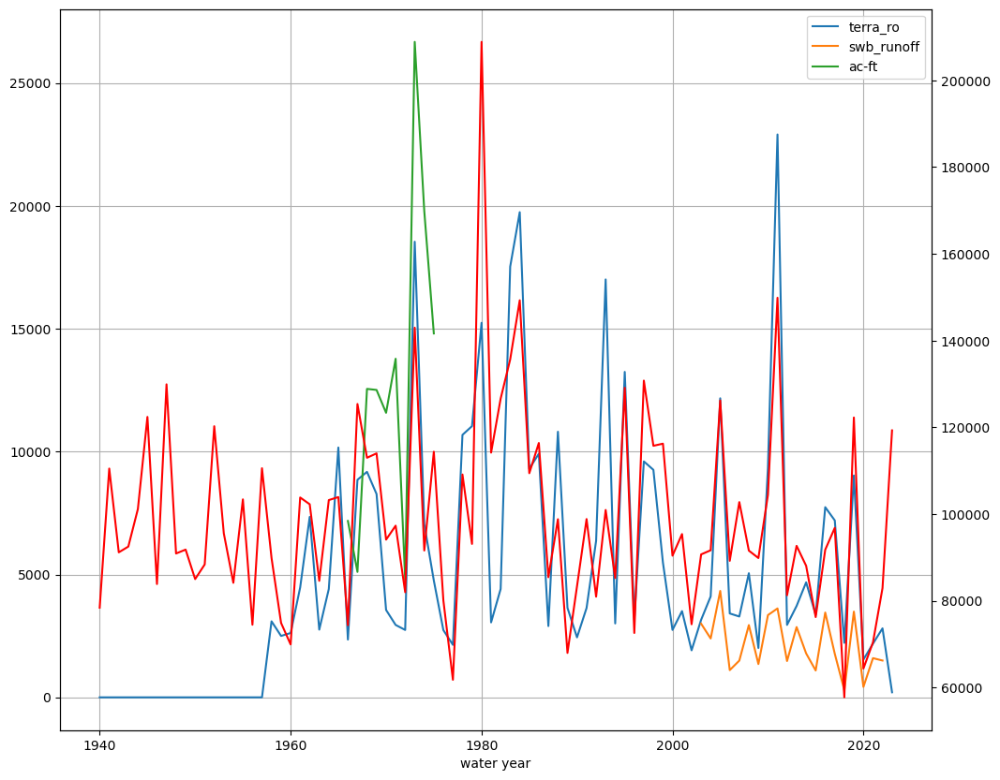

In [309]:
combined['water year'] = combined.index.get_level_values(1).shift(-9, freq='M').year+1 
combined.loc[43].groupby('water year').sum(numeric_only=True).loc[:,'terra_ro'].plot() #corn
swbwy.loc[43,'swb_runoff'].plot()
print(f"SWB Avg {swbwy.loc[43,'swb_runoff'].mean():0.0f} acft/wy")
print(f"TerraClimate Avg {combined.loc[43].groupby('water year').sum(numeric_only=True).loc[2002:,'terra_ro'].mean():0.0f} acft/wy")

print(f"Corn Avg {cornwy['ac-ft'].mean():0.0f} acft/wy")

cornwy['ac-ft'].plot()
plt.legend()
plt.grid()
ax2 = plt.twinx()
priswy.loc[43,"prism_ppt_volume_af"].plot(ax=ax2,color='red')
#plt.grid()

## Chalk Creek Comparison

In [306]:
url = "https://waterdata.usgs.gov/nwis/dv?cb_00060=on&format=rdb&site_no=10232500&legacy=&referred_module=sw&period=&begin_date=1944-03-01&end_date=1971-09-29"

chalk = pd.read_table(url,comment="#")
chalk = chalk.drop([0],axis=0)
chalk['datetime'] = pd.to_datetime(chalk['datetime'])
chalk = chalk.rename(columns = {'143838_00060_00003':'cfs'})
chalk['cfs'] = pd.to_numeric(chalk['cfs'])
chalk['cfd'] = 86400*chalk['cfs']
chalk = chalk.drop(['agency_cd','143838_00060_00003_cd'],axis=1)
chalk = chalk.set_index('datetime')

chalk = chalk.resample('1D').asfreq().interpolate(method='time')
chalk['water year'] = chalk.index.shift(-9, freq='M').year+1 
chalkwy = chalk.groupby('water year').sum()
chalkwy['ac-ft'] = chalkwy['cfd']*2.29569e-5
chalkwy = chalkwy.loc[1945:]
#27

chalk_w_ppt_wy = pd.concat([priswy.loc[27],chalkwy.drop(['site_no','cfs','cfd'],axis=1)],axis=1).dropna()

x = chalk_w_ppt_wy['prism_ppt_volume_af'].values
y = chalk_w_ppt_wy['ac-ft'].values

X = sm.add_constant(x)
model = sm.OLS(y, X)
results = model.fit()

results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.407
Model:                            OLS   Adj. R-squared:                  0.383
Method:                 Least Squares   F-statistic:                     17.16
Date:                Sat, 23 Dec 2023   Prob (F-statistic):           0.000343
Time:                        09:06:33   Log-Likelihood:                -276.08
No. Observations:                  27   AIC:                             556.2
Df Residuals:                      25   BIC:                             558.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -1.378e+04   8732.095     -1.578      0.127   -3.18e+04    4207.331
x1             0.4371      0.106      4.142      0.000       0.220       0.654
==============================================================================
Omnibus:                        0.416   Durbin-Watson:                   1.934
Prob(Omnibus):                  0.812   Jarque-Bera (JB):                0.434
Skew:                          -0.258   Prob(JB):                        0.805
Kurtosis:                       2.655   Cond. No.                     5.41e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.41e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Comparsion of PRISM data to the limited available USGS Streamflow data of Corn Creek shows that precipitation makes up about 44% of the flow of the creek.

<Axes: xlabel='datetime'>

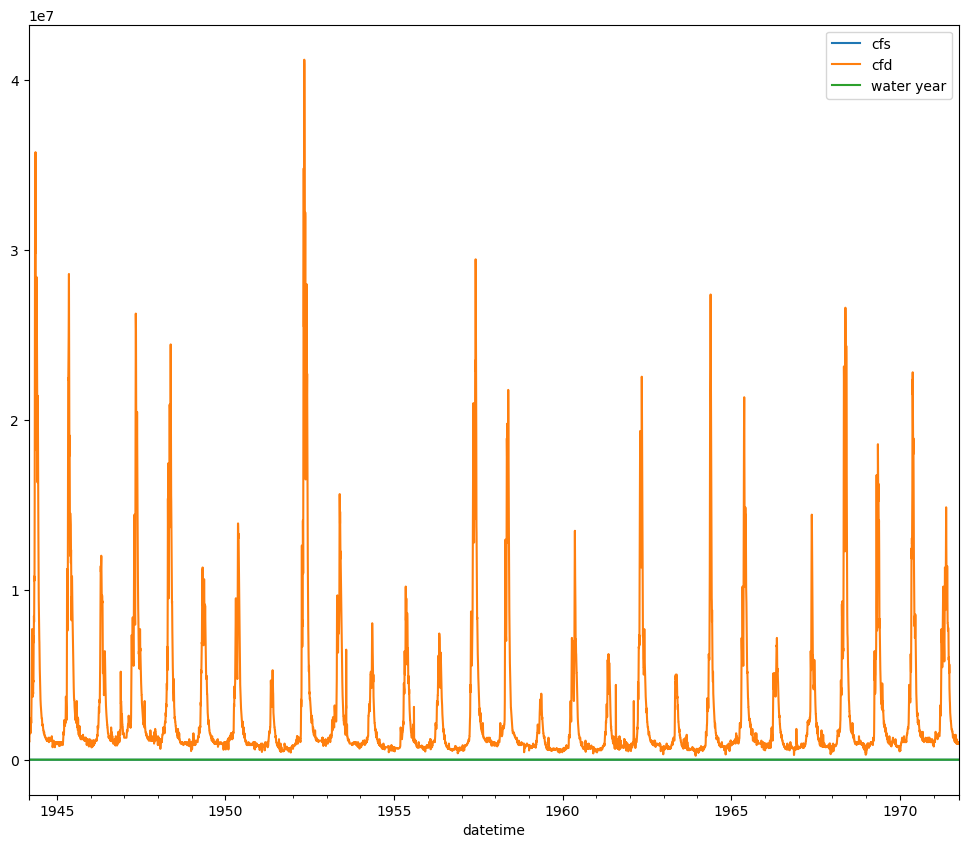

In [307]:
chalk.plot()

SWB Avg 1631 acft/wy
TerraClimate Avg 5593 acft/wy
Chalk Avg 21969 acft/wy


Text(0, 0.5, 'PRISM Precip for Chalk Watershed (ac-ft/yr)')

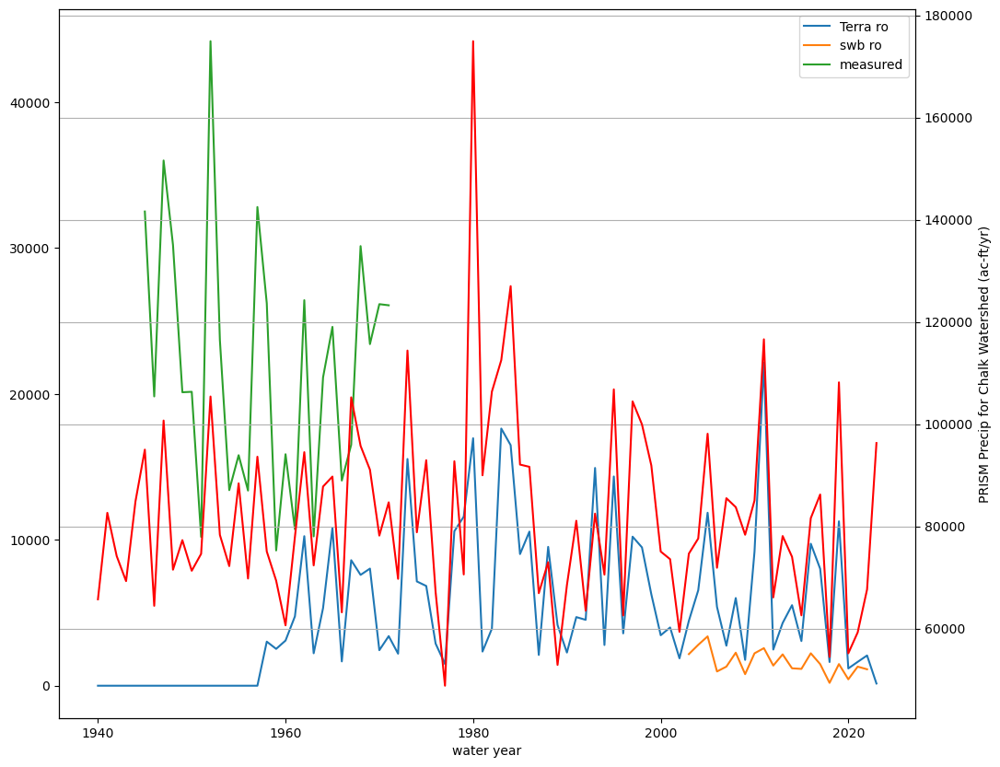

In [308]:
combined['water year'] = combined.index.get_level_values(1).shift(-9, freq='M').year+1 
combined.loc[27].groupby('water year').sum(numeric_only=True).loc[:,'terra_ro'].plot(label='Terra ro') #corn
swbwy.loc[27,'swb_runoff'].plot(label='swb ro')
print(f"SWB Avg {swbwy.loc[27,'swb_runoff'].mean():0.0f} acft/wy")
print(f"TerraClimate Avg {combined.loc[27].groupby('water year').sum(numeric_only=True).loc[2002:,'terra_ro'].mean():0.0f} acft/wy")
chalkwy['ac-ft'].plot(label='measured')
print(f"Chalk Avg {chalkwy['ac-ft'].mean():0.0f} acft/wy")
plt.legend()
ax2 = plt.twinx()
priswy.loc[27,"prism_ppt_volume_af"].plot(ax=ax2,color='red')
plt.grid()
plt.ylabel('PRISM Precip for Chalk Watershed (ac-ft/yr)')


In [171]:
url = "https://nwis.waterservices.usgs.gov/nwis/iv/?sites=10232000&parameterCd=00065&startDT=2022-10-01T00:00:00-07:00&endDT=2023-10-01T00:00:00-07:00&siteStatus=all&format=rdb"
schalk = pd.read_table(url,comment="#")
schalk = schalk.drop([0],axis=0)
schalk['datetime'] = pd.to_datetime(schalk['datetime'])
schalk = schalk.rename(columns = {'316832_00065':'stage'})
schalk['stage'] = pd.to_numeric(schalk['stage'])
schalk['depth'] = schalk['stage'] - 2.0
schalk['cfs'] = (1.486/0.012)*((12*schalk['depth'])**(2/3))*(0.01023**(0.5))
schalk['cfd'] = 86400*schalk['cfs']
schalk = schalk.drop(['agency_cd','316832_00065_cd','tz_cd'],axis=1)
#schalk = schalk.set_index('datetime')

schalk = schalk.drop_duplicates(subset='datetime').set_index('datetime')

schalk_min = schalk.drop(['site_no'],axis=1).resample('1min').asfreq().interpolate(method='time')
schalk_min['cfm'] = schalk_min['cfs']*60.0
schalk_min['acft'] = schalk_min['cfm']*2.29569e-5
schalk_min['water year'] = schalk_min.index.shift(-9, freq='M').year+1 
schalkwy = schalk_min.groupby('water year').sum()

schalk_hr = schalk.resample('1H').mean(numeric_only=True)
schalk_day = schalk.resample('1D').median(numeric_only=True)

schalk_day

,stage,depth,cfs,cfd
datetime,,,,
2022-10-01,2.10,0.10,14.143695,1.222015e+06
2022-10-02,2.10,0.10,14.143695,1.222015e+06
2022-10-03,2.11,0.11,15.071553,1.302182e+06
2022-10-04,2.11,0.11,15.071553,1.302182e+06
2022-10-05,2.12,0.12,15.971672,1.379952e+06
...,...,...,...,...
2023-09-27,2.14,0.14,17.700338,1.529309e+06
2023-09-28,2.14,0.14,17.700338,1.529309e+06
2023-09-29,2.14,0.14,17.700338,1.529309e+06


## SNOTEL Comparison

<Axes: xlabel='wateryear'>

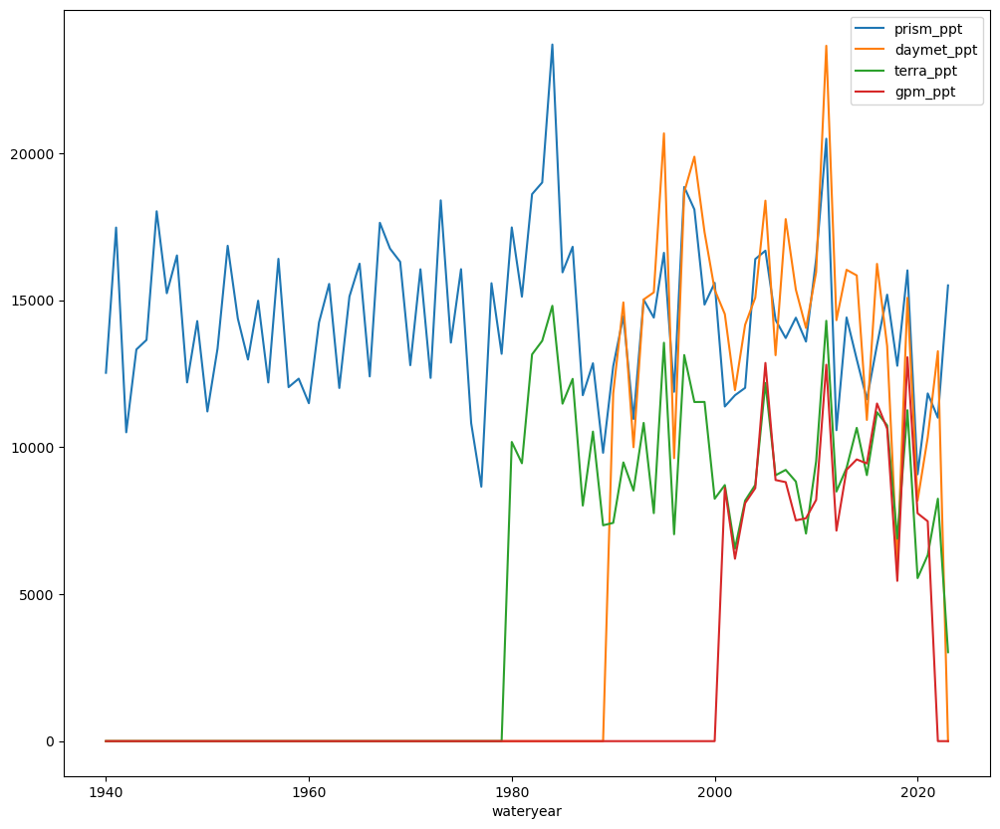

In [233]:
#,'SubsurfaceSM', 'SurfaceSM','daymet_swe'
comb_pine = combined.loc[52,['prism_ppt','daymet_ppt','terra_ppt','gpm_ppt']]
comb_pine['wateryear'] = comb_pine.index.shift(-9, freq='M').year+1 
comb_pine_wy = comb_pine.groupby('wateryear').sum()
comb_pine_wy.plot()

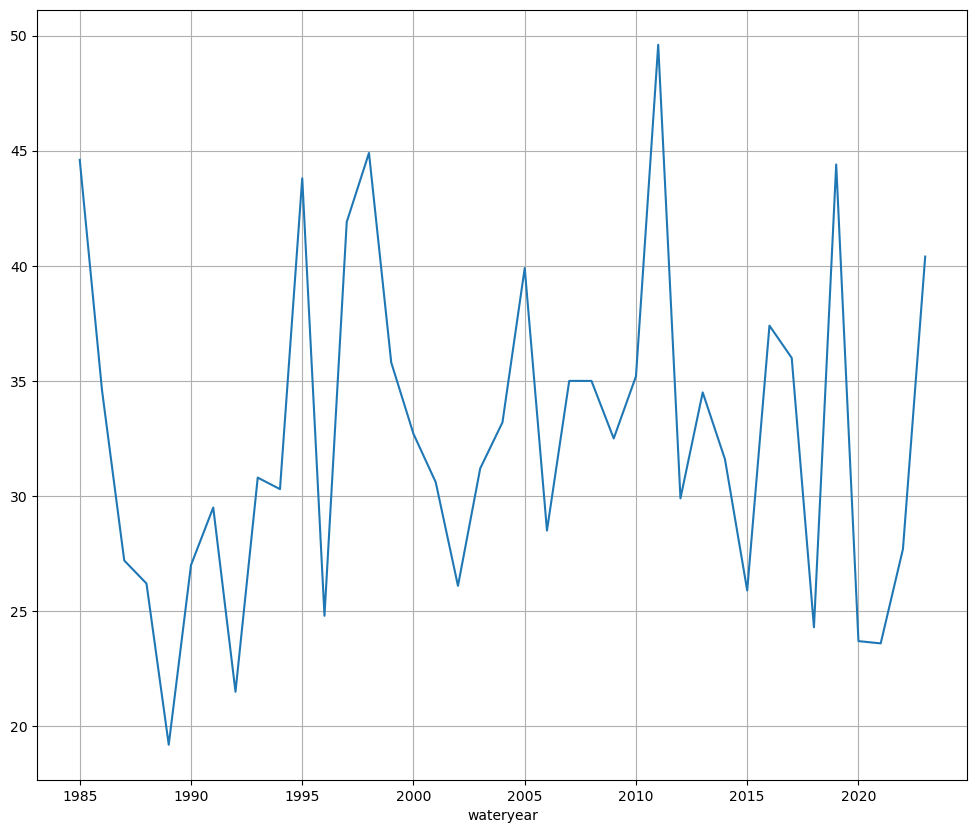

In [235]:
snotel_url = "https://wcc.sc.egov.usda.gov/reportGenerator/view_csv/customSingleStationReport/daily/694:UT:SNTL%7Cid=%22%22%7Cname/POR_BEGIN,POR_END/WTEQ::value,PREC::value,TMAX::value,TMIN::value,TAVG::value,PRCP::value"
snotel = pd.read_csv(snotel_url,comment="#",na_values=-99.0,parse_dates=True,index_col='Date')
snotel['wateryear'] = snotel.index.shift(-9, freq='M').year+1 
snotel = snotel[snotel['wateryear']<2024]
snotel_wy = snotel.groupby('wateryear').max()
snotel_wy['Precipitation Accumulation (in) Start of Day Values'].plot()

pine_area = hydrodivs[(hydrodivs['Watershed'] == 'Pine Creek')&(hydrodivs['Bdrk_v_Val'] == 'Bdrk')]['area_acres'].values
snotel_vol = snotel_wy['Precipitation Accumulation (in) Start of Day Values']/12*pine_area
#snotel_vol.plot()
plt.grid()
#'Precipitation Accumulation (in) Start of Day Values']

,Bdrk_v_Val,WRarea,Watershed,Notes,Shape_Leng,Shape_Area,geometry,hucname,PML_Soil_Evap,PML_Veg_Trans,...,daymet_ppt,daymet_swe,openet_aet,gpm_ppt,prism_ppt,SubsurfaceSM,SurfaceSM,ssebop_aet,water year,area group
date,,,,,,,,,,,,,,,,,,,,,
1939-12-01,Bdrk,Flowell,Pine Creek,NaN,31430.033553,3.405353e+07,"POLYGON Z ((-1398038.640 1884177.574 0.000, -1...",52,NaN,NaN,...,NaN,NaN,NaN,NaN,2050.483426,NaN,NaN,NaN,1940,east mountains
1940-01-01,Bdrk,Flowell,Pine Creek,NaN,31430.033553,3.405353e+07,"POLYGON Z ((-1398038.640 1884177.574 0.000, -1...",52,NaN,NaN,...,NaN,NaN,NaN,NaN,2352.857519,NaN,NaN,NaN,1940,east mountains
1940-02-01,Bdrk,Flowell,Pine Creek,NaN,31430.033553,3.405353e+07,"POLYGON Z ((-1398038.640 1884177.574 0.000, -1...",52,NaN,NaN,...,NaN,NaN,NaN,NaN,3055.855988,NaN,NaN,NaN,1940,east mountains
1940-03-01,Bdrk,Flowell,Pine Creek,NaN,31430.033553,3.405353e+07,"POLYGON Z ((-1398038.640 1884177.574 0.000, -1...",52,NaN,NaN,...,NaN,NaN,NaN,NaN,1536.336433,NaN,NaN,NaN,1940,east mountains
1940-04-01,Bdrk,Flowell,Pine Creek,NaN,31430.033553,3.405353e+07,"POLYGON Z ((-1398038.640 1884177.574 0.000, -1...",52,NaN,NaN,...,NaN,NaN,NaN,NaN,35.181953,NaN,NaN,NaN,1940,east mountains
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-04-01,Bdrk,Flowell,Pine Creek,NaN,31430.033553,3.405353e+07,"POLYGON Z ((-1398038.640 1884177.574 0.000, -1...",52,NaN,NaN,...,NaN,NaN,NaN,NaN,833.285514,NaN,NaN,NaN,2023,east mountains
2023-05-01,Bdrk,Flowell,Pine Creek,NaN,31430.033553,3.405353e+07,"POLYGON Z ((-1398038.640 1884177.574 0.000, -1...",52,NaN,NaN,...,NaN,NaN,NaN,NaN,438.248566,NaN,NaN,NaN,2023,east mountains
2023-06-01,Bdrk,Flowell,Pine Creek,NaN,31430.033553,3.405353e+07,"POLYGON Z ((-1398038.640 1884177.574 0.000, -1...",52,NaN,NaN,...,NaN,NaN,NaN,NaN,223.484917,NaN,NaN,NaN,2023,east mountains


TypeError: index type not supported

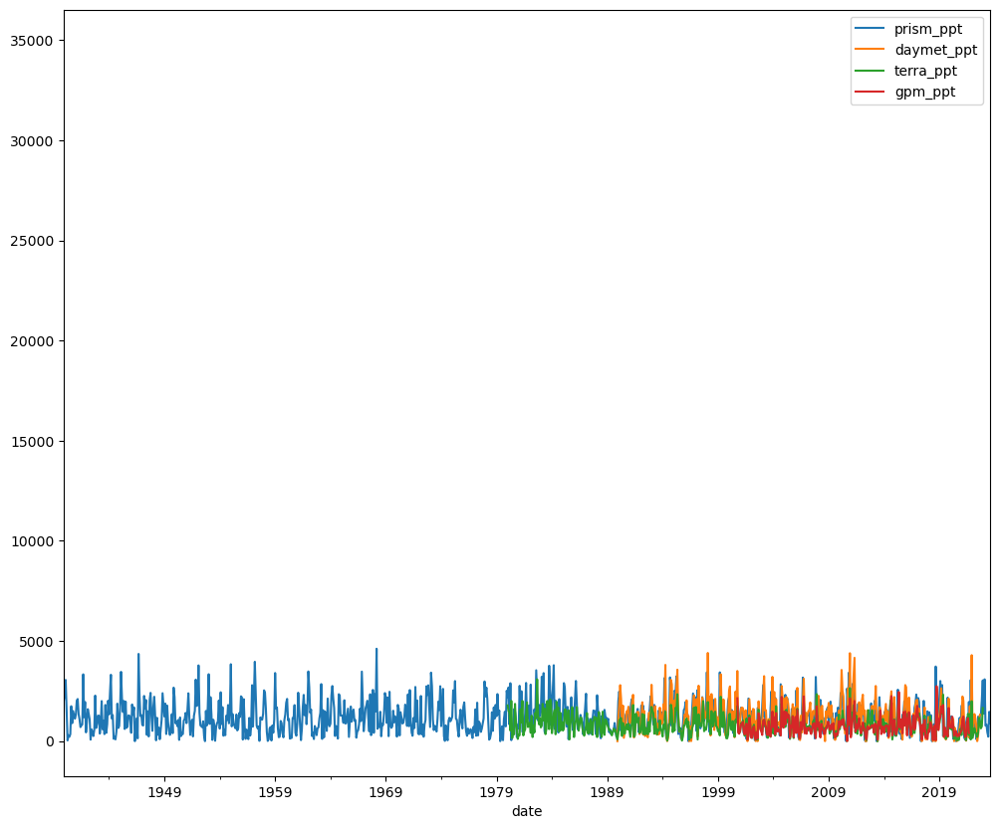

In [227]:
#snotel['Snow Water Equivalent (in) Start of Day Values'].plot()
#snotel['Precipitation Accumulation (in) Start of Day Values'].plot()


In [172]:


#schalkwy['ac-ft'] = schalkwy['cfm']*12.0661


In [173]:
schalkwy

,stage,depth,cfs,cfd,cfm,acft
water year,,,,,,
2023,1163134.00,111934.00,1.188471e+07,1.026839e+12,7.130824e+08,16370.162451
2024,2.14,0.14,1.770034e+01,1.529309e+06,1.062020e+03,0.024381


<Axes: xlabel='datetime'>

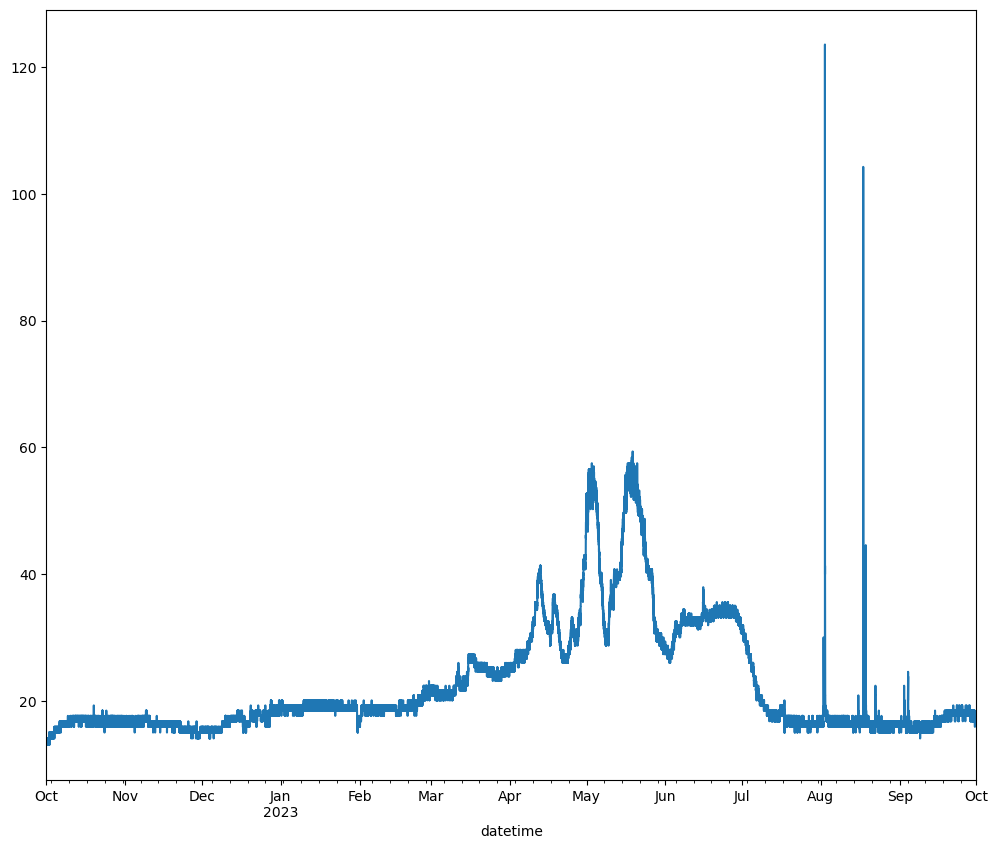

In [174]:
schalk_min['cfs'].plot()

Text(0, 0.5, 'Chalk Creek Discharge (cfs)')

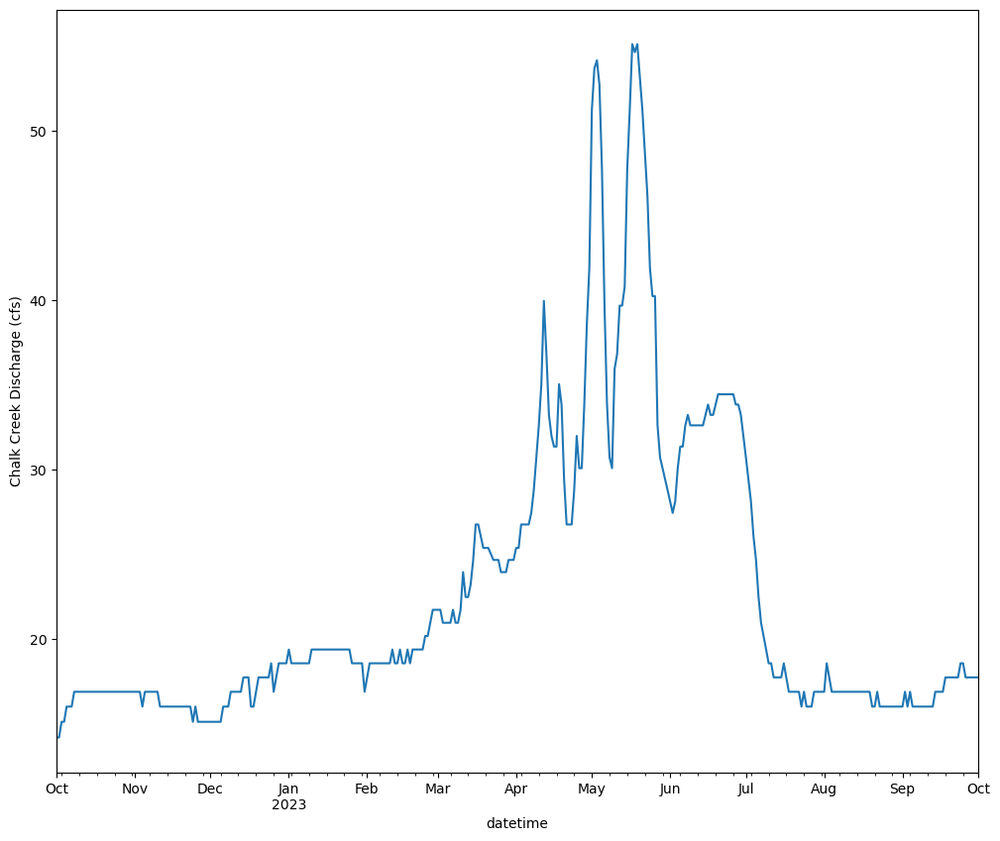

In [176]:
schalk_day['cfs'].plot()
plt.ylabel('Chalk Creek Discharge (cfs)')

## Combine by large regions

In [22]:
area_groups = {'east mountains':[67,11,60,21,22,55,27,52,51,43,77,47],
               'east valley':[7,14,57,26,33,3],
               'basalt':[118,23,120],
               'west mountains':[116],
               'west flats':[20,4,2], 
               'NW Spring Flats':[5,13,10,12]}
int_areas = {}

for k, v in area_groups.items():
    for item in v:
        int_areas[item] = k


swbwy['area group'] = swbwy.index.get_level_values(0).map(int_areas)

swb_wy = swbwy.groupby(['area group','date']).sum()



In [23]:
combined['area group'] = combined.index.get_level_values(0).map(int_areas)
comb_areas = combined.reset_index().groupby(['area group','date']).sum(numeric_only=True)

comb_areas['water year'] = comb_areas.index.get_level_values(1).shift(-9, freq='M').year+1 
comb_areas['year'] = comb_areas.index.get_level_values(1).year
comb_areas_yr = comb_areas.groupby(['area group','year']).sum()
comb_areas_yr = comb_areas_yr[(comb_areas_yr.index.get_level_values(1) >= 2000)&(comb_areas_yr.index.get_level_values(1) <= 2022)]
comb_areas_wy = comb_areas.groupby(['area group','water year']).sum()
comb_areas_wy = comb_areas_wy[(comb_areas_wy.index.get_level_values(1) >= 2000)&(comb_areas_wy.index.get_level_values(1) <= 2022)].replace(0,np.nan)

all_yr = comb_areas_yr.groupby(level=1).sum()
all_wy = comb_areas_wy.groupby(level=1).sum()

In [27]:
comb_areas.to_parquet("C:/Users/paulinkenbrandt/Documents/ArcGIS/Projects/Pahvant/combined_hydro_areas_daily.parquet")

In [24]:
comb_areas.loc['west mountains'].loc['2020-09-01':]

,ID,Shape_Leng,Shape_Area,hucname,PML_Soil_Evap,PML_Veg_Trans,PML_Veg_Intercept,pml_aet,aet_modis,swb_gross_precipitation,...,daymet_ppt,daymet_swe,openet_aet,gpm_ppt,prism_ppt,SubsurfaceSM,SurfaceSM,ssebop_aet,water year,year
date,,,,,,,,,,,,,,,,,,,,,
2020-09-01,116,110820.189103,2.643092e+08,116,0.0,0.0,0.0,0.0,504.350517,0.000000,...,0.000000,0.000000,2643.326504,388.132284,161.417016,2472.158056,539.361425,0.0,2020,2020
2020-10-01,116,110820.189103,2.643092e+08,116,0.0,0.0,0.0,0.0,1118.588444,0.000000,...,0.000000,0.000000,1961.407923,838.759321,2243.292898,3000.432886,705.565147,0.0,2021,2020
2020-11-01,116,110820.189103,2.643092e+08,116,0.0,0.0,0.0,0.0,4103.033718,1073.692923,...,1075.753358,0.000000,2234.144144,1618.895170,4225.765229,3491.765418,846.318554,0.0,2021,2020
2020-12-01,116,110820.189103,2.643092e+08,116,0.0,0.0,0.0,0.0,4954.300874,5523.850413,...,5707.782438,727.311772,1345.178040,2301.241922,2067.018522,4060.333119,1132.440319,0.0,2021,2020
2021-01-01,116,110820.189103,2.643092e+08,116,0.0,0.0,0.0,0.0,5604.608567,2005.562724,...,1873.424280,944.238133,1587.786209,2536.517812,4698.042333,6580.659826,1651.466266,0.0,2021,2021
2021-02-01,116,110820.189103,2.643092e+08,116,0.0,0.0,0.0,0.0,4636.658050,3352.470028,...,3291.736882,0.000000,3032.851730,4224.679226,9016.238929,4424.715359,1063.553203,0.0,2021,2021
2021-03-01,116,110820.189103,2.643092e+08,116,0.0,0.0,0.0,0.0,4113.595727,13374.282209,...,13772.497924,20.267274,5593.919092,6989.899942,2507.481901,4835.588553,1270.275837,0.0,2021,2021
2021-04-01,116,110820.189103,2.643092e+08,116,0.0,0.0,0.0,0.0,2176.576829,2572.277746,...,2491.367534,0.000000,6016.712638,2637.279154,272.242025,3423.080201,727.234017,0.0,2021,2021
2021-05-01,116,110820.189103,2.643092e+08,116,0.0,0.0,0.0,0.0,1365.096592,455.986263,...,477.515656,0.000000,5880.309802,1067.577696,162.151114,2621.104271,557.573717,0.0,2021,2021


In [26]:
comb_areas.loc['west mountains']

,ID,Shape_Leng,Shape_Area,hucname,PML_Soil_Evap,PML_Veg_Trans,PML_Veg_Intercept,pml_aet,aet_modis,swb_gross_precipitation,...,daymet_ppt,daymet_swe,openet_aet,gpm_ppt,prism_ppt,SubsurfaceSM,SurfaceSM,ssebop_aet,water year,year
date,,,,,,,,,,,,,,,,,,,,,
1939-12-01,116,110820.189103,2.643092e+08,116,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,7783.781485,0.0,0.0,0.0,1940,1939
1940-01-01,116,110820.189103,2.643092e+08,116,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,10023.802923,0.0,0.0,0.0,1940,1940
1940-02-01,116,110820.189103,2.643092e+08,116,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,5639.826516,0.0,0.0,0.0,1940,1940
1940-03-01,116,110820.189103,2.643092e+08,116,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,6473.782828,0.0,0.0,0.0,1940,1940
1940-04-01,116,110820.189103,2.643092e+08,116,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,586.069974,0.0,0.0,0.0,1940,1940
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-04-01,116,110820.189103,2.643092e+08,116,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,3211.622410,0.0,0.0,0.0,2023,2023
2023-05-01,116,110820.189103,2.643092e+08,116,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,3355.358000,0.0,0.0,0.0,2023,2023
2023-06-01,116,110820.189103,2.643092e+08,116,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,2046.032948,0.0,0.0,0.0,2023,2023


In [25]:
hydrodivs
hydrodivs['area_acres'] = hydrodivs['Shape_Area']*0.000247105
hydrodivs['region'] = hydrodivs['ID'].map(int_areas)
hydrodivs_regions = hydrodivs.groupby(['region']).sum(numeric_only=True)
hydrodivs_regions

,ID,Shape_Leng,Shape_Area,area_acres
region,,,,
NW Spring Flats,40,286807.176363,4.919883e+08,121572.777638
basalt,261,210763.618020,4.554755e+08,112550.271070
east mountains,533,611748.019240,1.089969e+09,269336.808600
east valley,140,439331.923451,1.107145e+09,273581.109981
west flats,26,284873.391056,7.747845e+08,191453.134089
west mountains,116,110820.189103,2.643092e+08,65312.117683


In [181]:
hydrodivs_regions['area_acres'].sum()

1033806.2190604361

In [246]:
comb_areas_wy.loc['east mountains',['terra_ro', 'swb_runoff']].to_clipboard()#plot()

In [240]:
mtn_ppt = comb_areas_wy.loc['east mountains',['prism_ppt','daymet_ppt','terra_ppt','gpm_ppt']].round(-2)
mtn_ppt.to_clipboard()
mtn_et = comb_areas_wy.loc['east mountains',['openet_aet','terra_aet','pml_aet','aet_modis']].round(-2)
mtn_et.to_clipboard()

In [241]:
mtn_et = comb_areas_wy.loc['east mountains',['openet_aet','terra_aet','pml_aet','aet_modis']].round(-2)
mtn_et.to_clipboard()

Text(0, 0.5, 'Precip. in East Mountains (ac-ft/wy)')

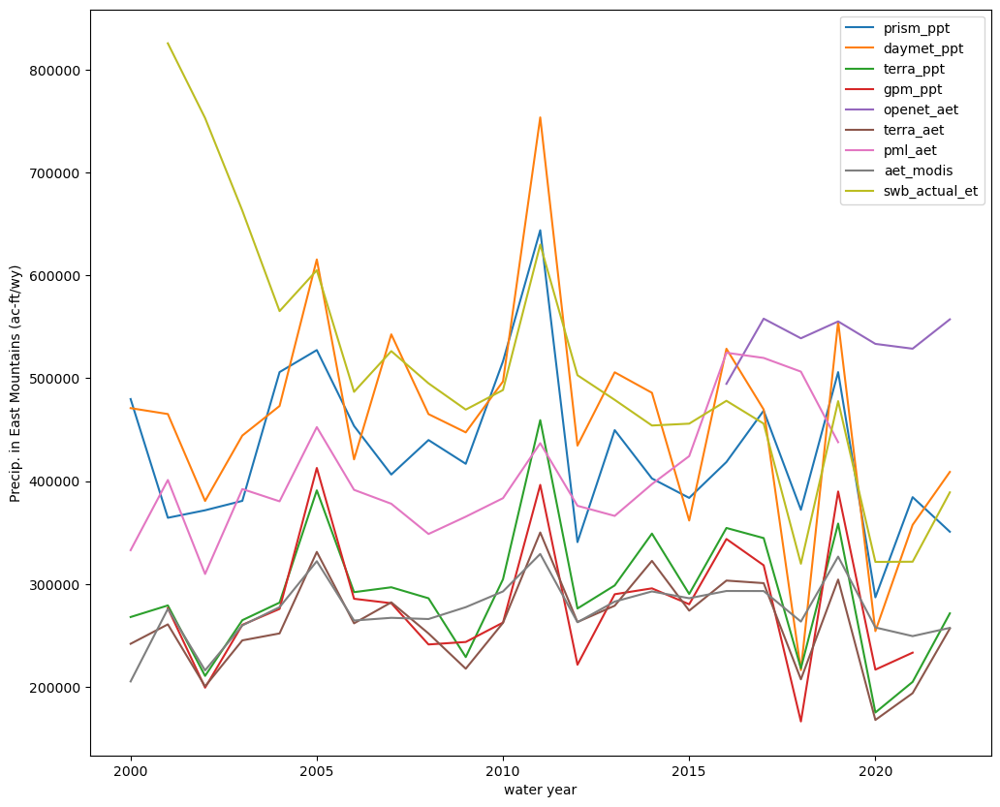

In [242]:
fig, ax = plt.subplots(1,1,sharex=True)
(comb_areas_wy.loc['east mountains',['prism_ppt','daymet_ppt','terra_ppt','gpm_ppt']]).plot(ax=ax)
(comb_areas_wy.loc['east mountains',['openet_aet','terra_aet','pml_aet','aet_modis','swb_actual_et']]).plot(ax=ax)

plt.ylabel('Precip. in East Mountains (ac-ft/wy)')

In [183]:
comb_areas_wy.index.get_level_values(0).unique()

Index(['NW Spring Flats', 'basalt', 'east mountains', 'east valley',
       'west flats', 'west mountains'],
      dtype='object', name='area group')

NW Spring Flats
basalt
east mountains
east valley
west flats
west mountains


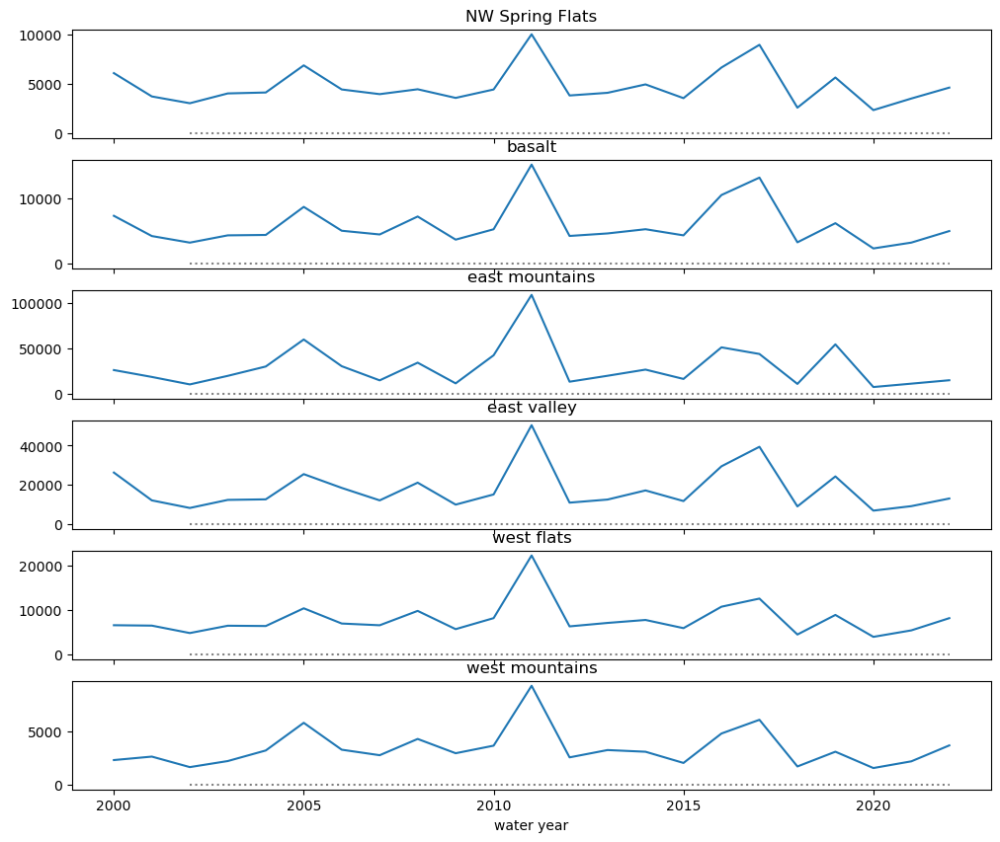

In [184]:
comb_areas_wy['terra_effective_precip'] = (comb_areas_wy['terra_ppt'] - comb_areas_wy['terra_aet'])
comb_areas_wy['terra_cum_effective_precip'] = comb_areas_wy['terra_effective_precip'].cumsum()
fig, ax = plt.subplots(6,1, sharex=True)

i = 0
for group in comb_areas_wy.index.get_level_values(0).unique():
    print(group)
    if group == 'nan' or pd.isna(group):
        pass
    elif group:
        comb_areas_wy.loc[group,'terra_effective_precip'].plot(ax=ax[i])
        ax[i].set_title(group)
        ax[i].hlines(0,2002,2022,colors="gray",linestyles=":")
        i+=1

Text(0, 0.5, "Terra Estimated 'Runoff' for Basalt (ac-ft/wy")

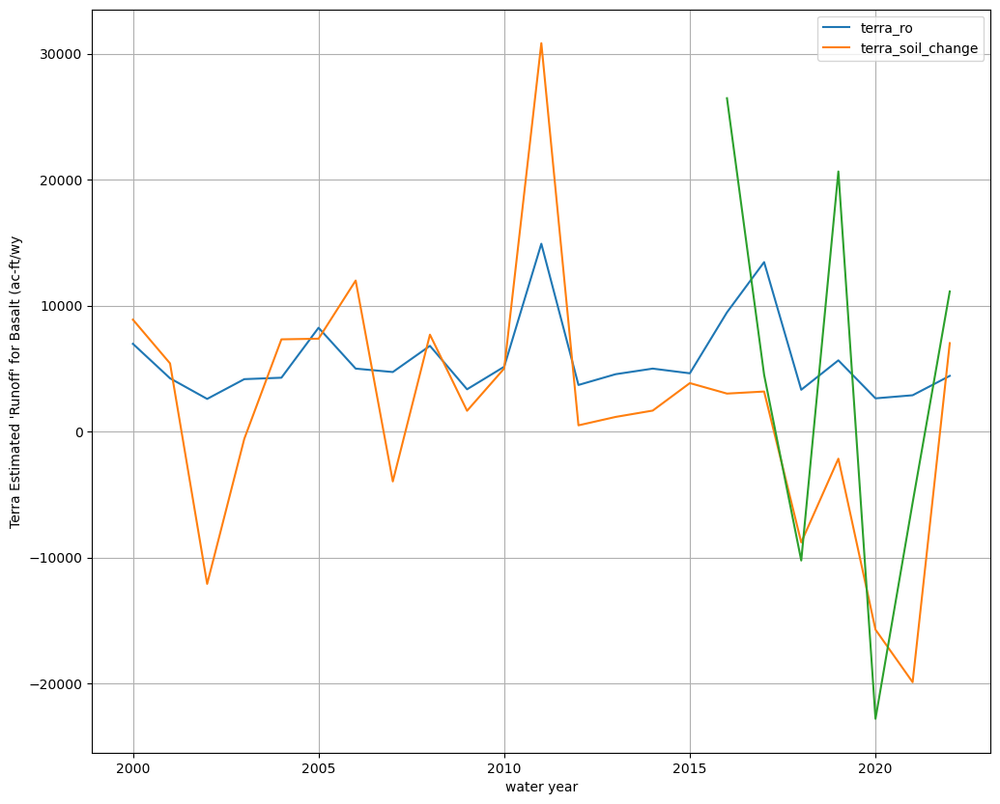

In [198]:
comb_areas_wy['terra_soil_change'] = (comb_areas_wy['terra_soil']).diff().cumsum()

comb_areas_wy.loc['basalt',['terra_ro', 'terra_soil_change']].plot()
comb_areas_wy.loc['basalt','SurfaceSM'].diff().plot()
plt.grid()
plt.ylabel("Terra Estimated 'Runoff' for Basalt (ac-ft/wy")

In [199]:
comb_areas_wy

ID  Notes    Shape_Leng    Shape_Area  hucname  \
area group      water year                                                     
NW Spring Flats 2000         480    NaN  3.441686e+06  5.903860e+09      480   
                2001         480    NaN  3.441686e+06  5.903860e+09      480   
                2002         480    NaN  3.441686e+06  5.903860e+09      480   
                2003         480    NaN  3.441686e+06  5.903860e+09      480   
                2004         480    NaN  3.441686e+06  5.903860e+09      480   
...                          ...    ...           ...           ...      ...   
west mountains  2018        1392    NaN  1.329842e+06  3.171710e+09     1392   
                2019        1392    NaN  1.329842e+06  3.171710e+09     1392   
                2020        1392    NaN  1.329842e+06  3.171710e+09     1392   
                2021        1392    NaN  1.329842e+06  3.171710e+09     1392   
                2022        1392    NaN  1.329842e+06  3.171710e+09     1392   

                            PML_Soil_Evap  PML_Veg_Trans  PML_Veg_Intercept  \
area group      water year                                                    
NW Spring Flats 2000         56825.140215   37088.130638         617.056642   
                2001         91505.094998   38830.720093         723.521902   
                2002         61196.291062   30924.459294         394.362108   
                2003         83815.072466   27450.392933         519.291811   
                2004         70279.875326   32924.507953         715.267884   
...                                   ...            ...                ...   
west mountains  2018         55731.293172   10375.753888         309.133088   
                2019         59679.241060   16776.546924        1006.393932   
                2020                  NaN            NaN                NaN   
                2021                  NaN            NaN                NaN   
                2022                  NaN            NaN                NaN   

                                  pml_aet     aet_modis  ...    openet_aet  \
area group      water year                               ...                 
NW Spring Flats 2000         94530.327495  51161.792330  ...           NaN   
                2001        131059.336993  76556.881542  ...           NaN   
                2002         92515.112464  63562.793042  ...           NaN   
                2003        111784.757210  70768.148590  ...           NaN   
                2004        103919.651162  75640.265629  ...           NaN   
...                                   ...           ...  ...           ...   
west mountains  2018         66416.180149  29405.180848  ...  52638.256364   
                2019         77462.181916  45362.835634  ...  76078.920987   
                2020                  NaN  31691.106949  ...  49797.619163   
                2021                  NaN  32060.647340  ...  46751.142306   
                2022                  NaN  36331.369494  ...  51993.579917   

                                  gpm_ppt      prism_ppt   SubsurfaceSM  \
area group      water year                                                
NW Spring Flats 2000                  NaN  107924.667612            NaN   
                2001        113008.256098   51809.629580            NaN   
                2002         83628.678919   67446.439112            NaN   
                2003        112523.174892   67284.206180            NaN   
                2004        121603.790574  109565.484881            NaN   
...                                   ...            ...            ...   
west mountains  2018         36804.027863   57028.659235   57552.021407   
                2019         84367.196771   76988.946253  104688.669093   
                2020         38384.546951   37449.403675   56555.525575   
                2021         44849.175365   56776.858361   47360.474359   
                2022                  NaN   45

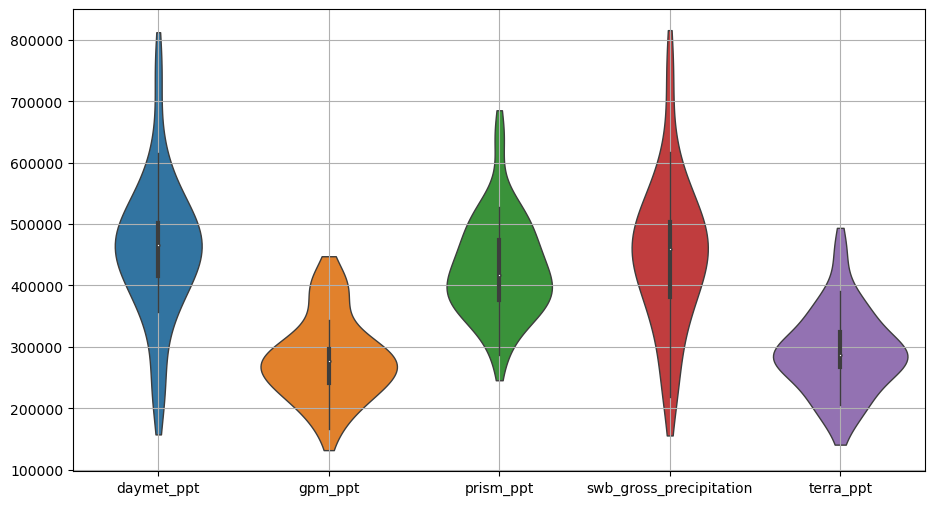

In [194]:
aet_cols = ['daymet_ppt','gpm_ppt', 'prism_ppt','swb_gross_precipitation','terra_ppt']
#comb_areas_wy.loc['east mountains',aet_cols].plot()

#df = sns.load_dataset("penguins")
#sns.pairplot(comb_areas_wy.loc['east mountains',aet_cols])#, hue="species")

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 6))

# Draw a violinplot with a narrower bandwidth than the default
sns.violinplot(data=comb_areas_wy.loc['east mountains',aet_cols], bw_adjust=.5, cut=1, linewidth=1)
plt.grid()

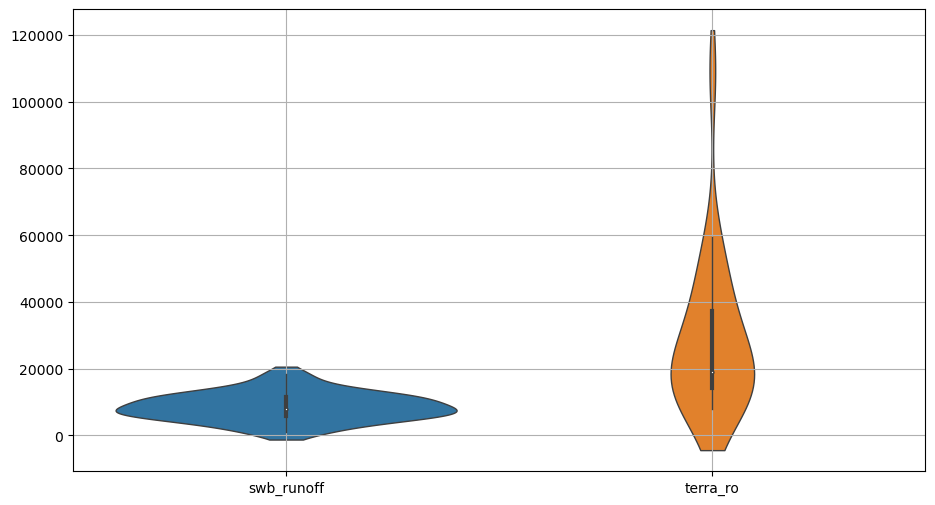

In [193]:
aet_cols = [ 'swb_runoff','terra_ro']
#comb_areas_wy.loc['east mountains',aet_cols].plot()

#df = sns.load_dataset("penguins")
#sns.pairplot(comb_areas_wy.loc['east mountains',aet_cols])#, hue="species")

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 6))

# Draw a violinplot with a narrower bandwidth than the default
sns.violinplot(data=comb_areas_wy.loc['east mountains',aet_cols], bw_adjust=.5, cut=1, linewidth=1)
plt.grid()

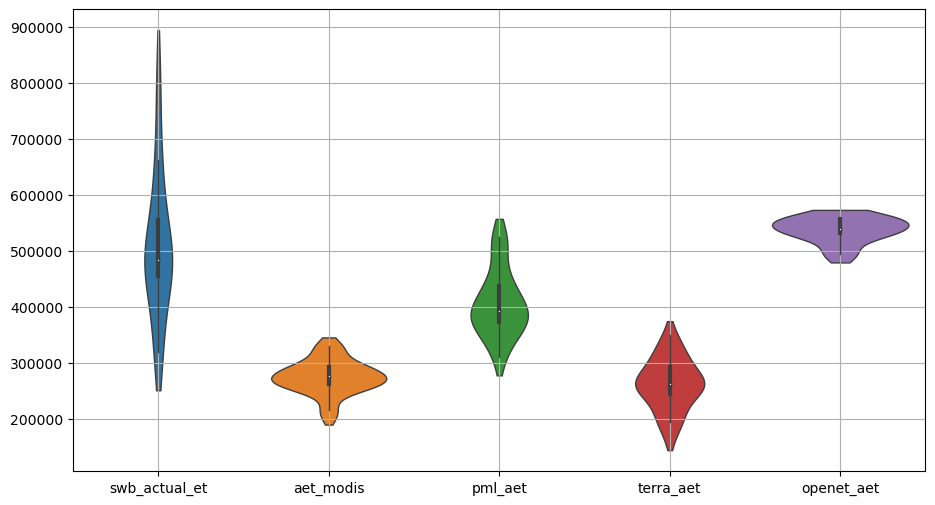

In [191]:
aet_cols = [ 'swb_actual_et','aet_modis', 'pml_aet','terra_aet','openet_aet']
#comb_areas_wy.loc['east mountains',aet_cols].plot()

#df = sns.load_dataset("penguins")
#sns.pairplot(comb_areas_wy.loc['east mountains',aet_cols])#, hue="species")

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 6))

# Draw a violinplot with a narrower bandwidth than the default
sns.violinplot(data=comb_areas_wy.loc['east mountains',aet_cols], bw_adjust=.5, cut=1, linewidth=1)
plt.grid()

west flats
east valley
NW Spring Flats
east mountains
basalt
nan
west mountains


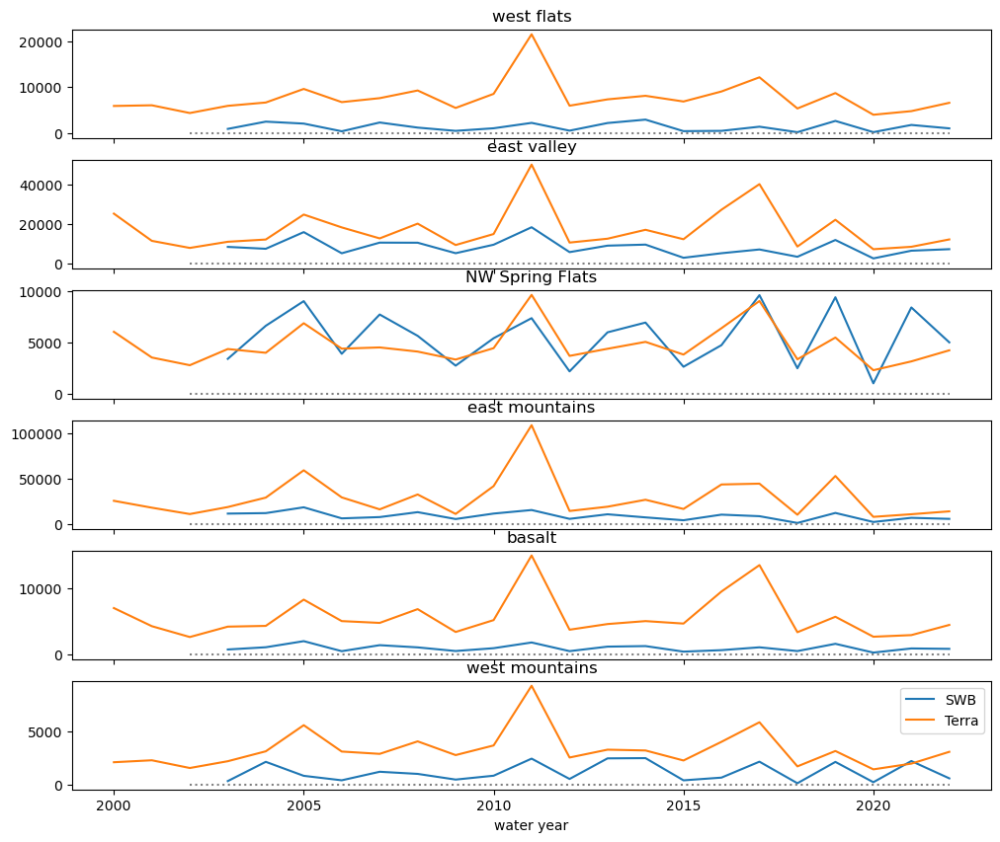

In [112]:
fig, ax = plt.subplots(6,1, sharex=True)

i = 0
for group in swbwy['area group'].unique():
    print(group)
    if group == 'nan' or pd.isna(group):
        pass
    elif group:
        swb_wy.loc[group,'swb_runoff'].plot(ax=ax[i],label='SWB')
        comb_areas_wy.loc[group,'terra_ro'].plot(ax=ax[i],label='Terra')
        ax[i].set_title(group)
        ax[i].hlines(0,2002,2022,colors="gray",linestyles=":")
        i+=1
ax[i-1].legend()

west flats
east valley
NW Spring Flats
east mountains
basalt
nan
west mountains


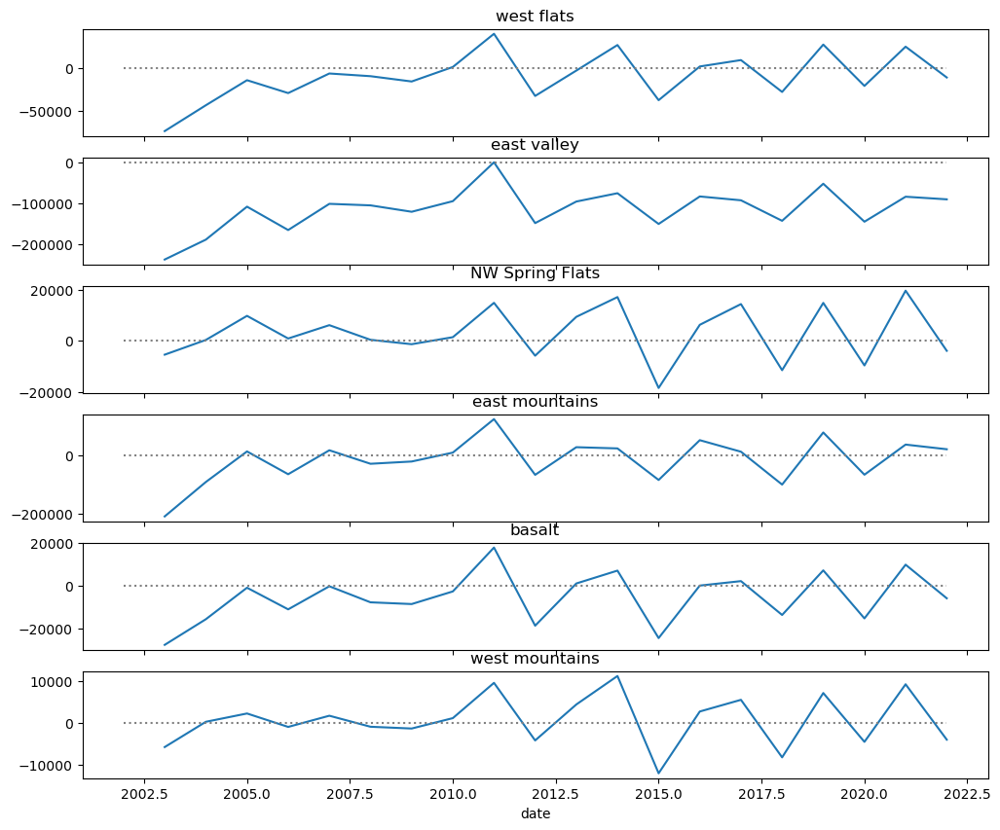

In [122]:
swb_wy['swb_effective_precip'] = (swb_wy['swb_gross_precipitation'] - swb_wy['swb_actual_et'])
swb_wy['swb_cum_effective_precip'] = (swb_wy['swb_gross_precipitation'] - swb_wy['swb_actual_et']).cumsum()
fig, ax = plt.subplots(6,1, sharex=True)

i = 0
for group in swbwy['area group'].unique():
    print(group)
    if group == 'nan' or pd.isna(group):
        pass
    elif group:
        swb_wy.loc[group,'swb_effective_precip'].plot(ax=ax[i])
        ax[i].set_title(group)
        ax[i].hlines(0,2002,2022,colors="gray",linestyles=":")
        i+=1

west flats
east valley
NW Spring Flats
east mountains
basalt
nan
west mountains


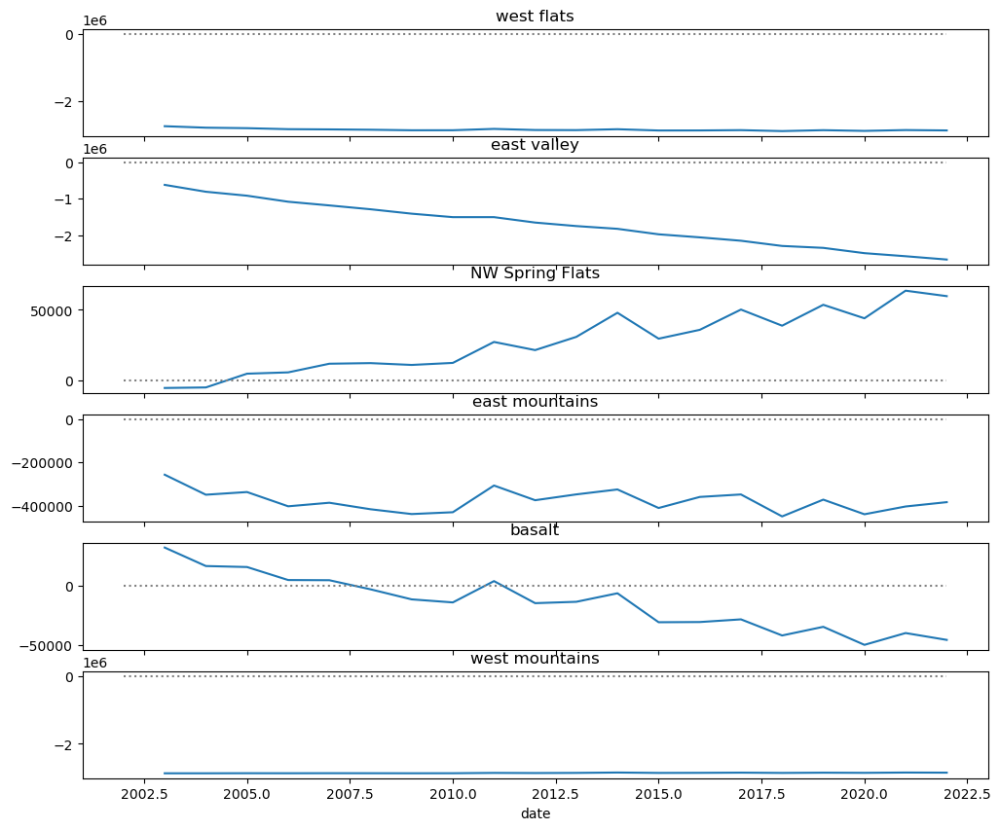

In [123]:
fig, ax = plt.subplots(6,1, sharex=True)

i = 0
for group in swbwy['area group'].unique():
    print(group)
    if group == 'nan' or pd.isna(group):
        pass
    elif group:
        swb_wy.loc[group,'swb_cum_effective_precip'].plot(ax=ax[i])
        ax[i].set_title(group)
        ax[i].hlines(0,2002,2022,colors="gray",linestyles=":")
        i+=1

west flats
east valley
NW Spring Flats
east mountains
basalt
nan
west mountains


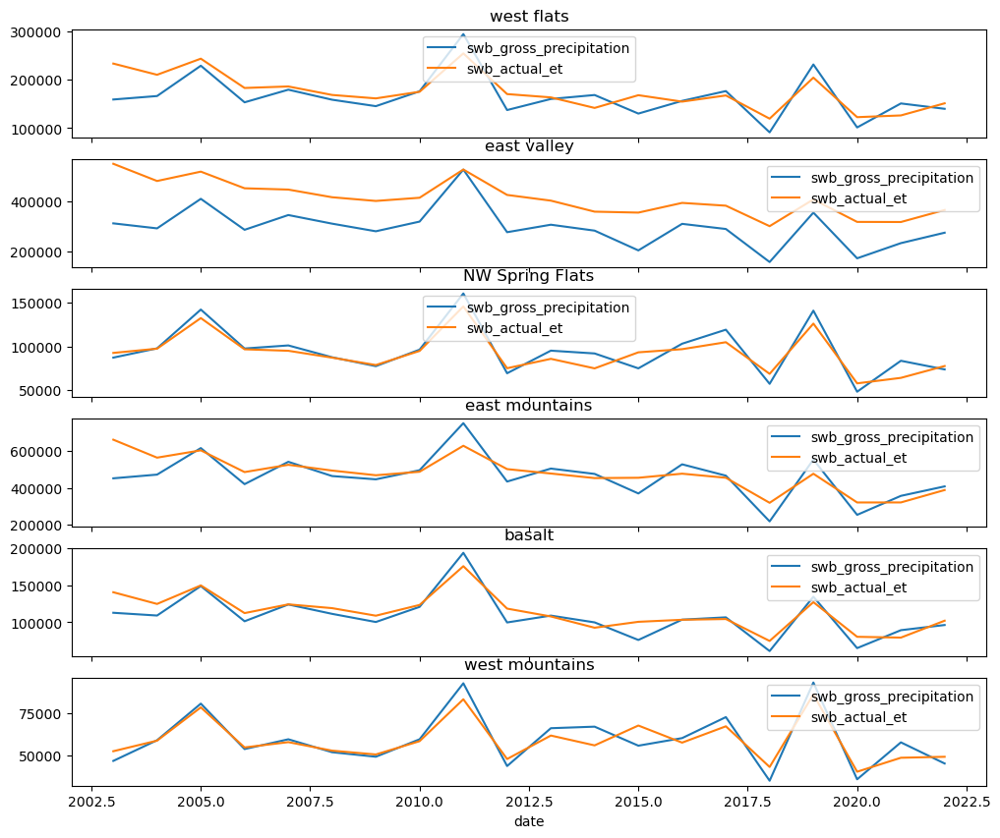

In [124]:


fig, ax = plt.subplots(6,1, sharex=True)

i = 0
for group in swbwy['area group'].unique():
    print(group)
    if group == 'nan' or pd.isna(group):
        pass
    elif group:
        swb_wy.loc[group,['swb_gross_precipitation','swb_actual_et']].plot(ax=ax[i])
        ax[i].set_title(group)
        i+=1


                                                                      

In [126]:
all_wy

,ID,Notes,Shape_Leng,Shape_Area,hucname,PML_Soil_Evap,PML_Veg_Trans,PML_Veg_Intercept,pml_aet,aet_modis,...,terra_swe,daymet_ppt,daymet_swe,openet_aet,gpm_ppt,prism_ppt,SubsurfaceSM,SurfaceSM,ssebop_aet,year
water year,,,,,,,,,,,,,,,,,,,,,
2000,13392,0.0,2.333213e+07,5.020406e+10,13392,476632.178521,390887.283033,13520.386928,8.810398e+05,505457.720168,...,204143.240121,1.176784e+06,125513.800595,0.000000e+00,3.039049e+05,1.295301e+06,0.000000e+00,0.000000,7.546758e+05,143982
2001,13392,0.0,2.333213e+07,5.020406e+10,13392,709382.217823,436964.433157,18166.472662,1.164513e+06,741976.884044,...,406594.824090,1.207297e+06,435657.811539,0.000000e+00,1.018058e+06,8.565130e+05,0.000000e+00,0.000000,1.067460e+06,144054
2002,13392,0.0,2.333213e+07,5.020406e+10,13392,477290.466614,361811.603093,10082.524115,8.491846e+05,605228.573692,...,320497.940891,9.354171e+05,215945.848853,0.000000e+00,7.348654e+05,9.947677e+05,0.000000e+00,0.000000,9.799489e+05,144126
2003,13392,0.0,2.333213e+07,5.020406e+10,13392,719802.911424,396474.947596,17390.895642,1.133669e+06,698954.246894,...,167405.289471,1.149684e+06,243118.875006,0.000000e+00,9.678837e+05,9.053628e+05,0.000000e+00,0.000000,9.116263e+05,144198
2004,13392,0.0,2.333213e+07,5.020406e+10,13392,625795.443296,419533.758344,17662.884200,1.062992e+06,740024.289380,...,540650.540514,1.196750e+06,362814.354766,0.000000e+00,1.035732e+06,1.323310e+06,0.000000e+00,0.000000,1.020531e+06,144270
2005,13392,0.0,2.333213e+07,5.020406e+10,13392,951331.363102,458082.098055,25416.638002,1.434830e+06,931556.175532,...,397939.075800,1.624234e+06,141940.230851,0.000000e+00,1.548194e+06,1.404193e+06,0.000000e+00,0.000000,8.435543e+05,144342
2006,13392,0.0,2.333213e+07,5.020406e+10,13392,701278.811506,414374.766089,16469.133712,1.132123e+06,744594.681109,...,350158.715774,1.112102e+06,292072.263320,0.000000e+00,1.051773e+06,1.182401e+06,0.000000e+00,0.000000,1.026184e+06,144414
2007,13392,0.0,2.333213e+07,5.020406e+10,13392,590092.655027,463894.386797,17342.863378,1.071330e+06,744609.171122,...,260839.075617,1.351004e+06,298329.878826,0.000000e+00,1.020939e+06,1.016821e+06,0.000000e+00,0.000000,1.085912e+06,144486
2008,13392,0.0,2.333213e+07,5.020406e+10,13392,521212.049457,413743.006617,13030.265526,9.479853e+05,720133.868433,...,843996.843516,1.184441e+06,594316.672861,0.000000e+00,8.835712e+05,1.066295e+06,0.000000e+00,0.000000,9.317972e+05,144558


Text(0, 0.5, 'Precipitation (in)')

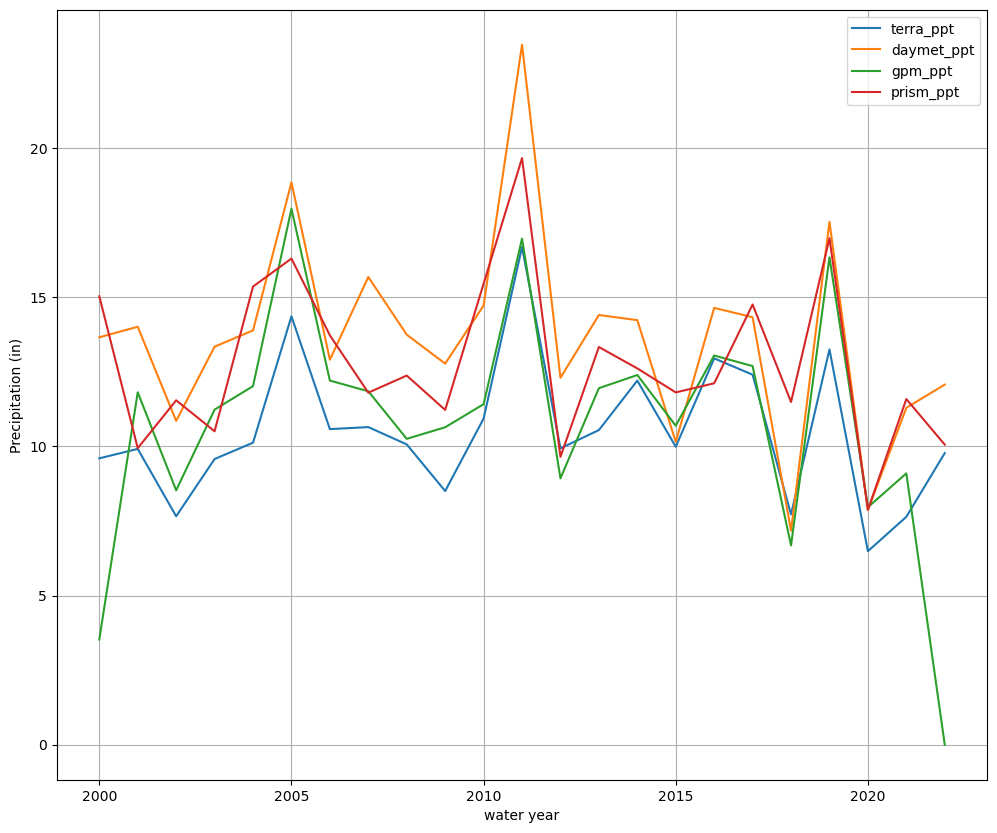

In [125]:
(all_wy[['terra_ppt', 'daymet_ppt', 'gpm_ppt', 'prism_ppt']]/hydrodivs_regions['area_acres'].sum()*12).plot()
plt.grid()
plt.ylabel("Precipitation (in)")

<Axes: xlabel='water year'>

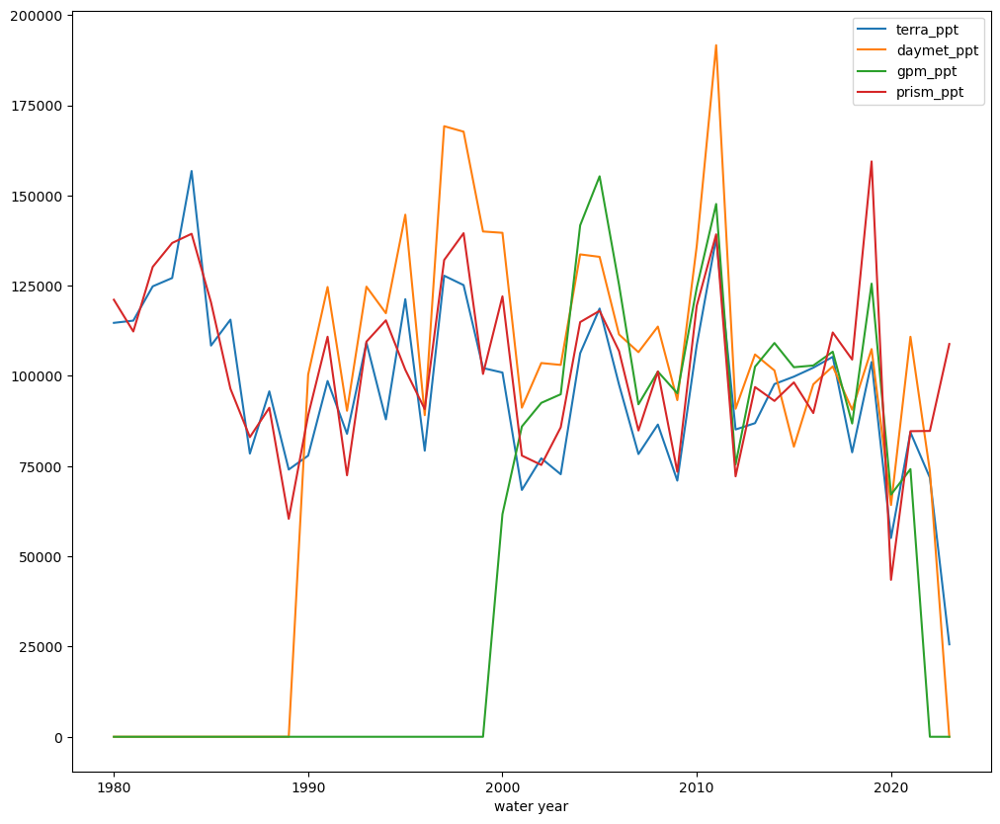

In [82]:
comb_areas.loc['basalt',['water year','terra_ppt', 'daymet_ppt', 'gpm_ppt', 'prism_ppt']].groupby(['water year']).sum().plot()

## Pull some representative well data and roughly calculate volume change

In [184]:
url="https://waterdata.usgs.gov/nwis/dv?cb_72019=on&format=rdb&site_no=385844112245801&legacy=&referred_module=sw&period=&begin_date=2001-02-06&end_date=2023-02-06"
resp = requests.get(url)
linefile = resp.iter_lines()
numlist = []
num = 0
for line in linefile:
    if line.startswith(b"#"):
        numlist.append(num)
    num += 1
numlist.append(numlist[-1] + 2)

shan_well = pd.read_table(resp.url, sep="\t", skiprows=numlist)

shan_well['datetime'] = pd.to_datetime(shan_well['datetime'])
shandata = shan_well.set_index('datetime')
shandata['wls'] = pd.to_numeric(shandata['239154_72019_00002']) 

wl_vol = (386131.3810510477*-1*shandata['wls'].diff()*0.011).to_frame()
shan_wl_vol = wl_vol.resample('1MS').sum().cumsum()

In [228]:
print(comb.first_valid_index()[1])
print( oet_sorted.last_valid_index()[1])

2016-01-01 00:00:00
2022-12-01 00:00:00


In [40]:
strtdt = oet_sorted.first_valid_index()[1]
enddt = oet_sorted.last_valid_index()[1]

comb_area = combined[(~combined['WRarea'].isin(['West Desert','Oasis','Clear Lake']))]
comb = comb_area[['Bdrk_v_Val','openet_aet','terra_swe','terra_ppt','terra_aet','terra_soil','terra_ro']].dropna()
comb_y = comb[(comb.index.get_level_values(1)>=strtdt)].copy(deep=True)
comb_y['dGW'] = comb_y['terra_ppt'] - (comb_y['openet_aet']) - comb_y['terra_soil'].diff() - comb_y['terra_swe'].diff()

In [42]:
area_groups = {'east mountains':[67,11,60,21,22,55,27,52,51,43,77,47],
               'east valley':[7,14,57,26,33,3],
               'basalt':[118,23,120],
               'west mountains':[116],
               'west flats':[20,4,2], 
               'NW Spring Flats':[5,13,10,12]}
               

In [43]:
comb_area['area group'] = comb_area['ID'].map(area_groups)
comb_area

KeyError: 'ID'

Text(0, 0.5, 'Groundwater Level (ft)')

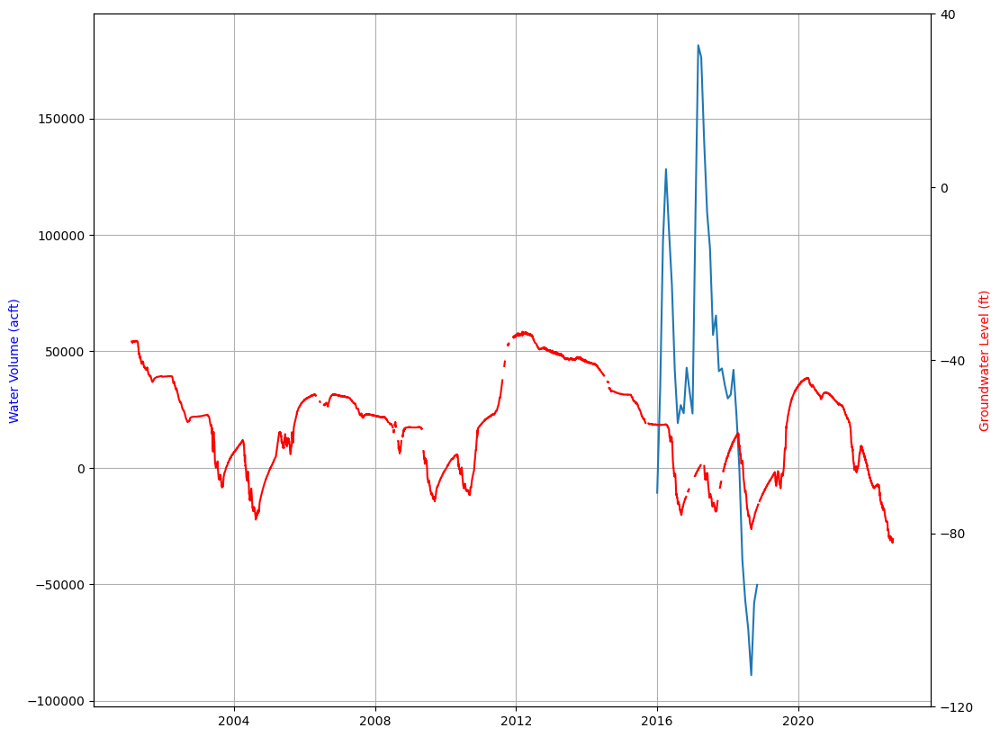

In [233]:
strtdt = oet_sorted.first_valid_index()[1]
enddt = oet_sorted.last_valid_index()[1]

comb_area = combined[(~combined['WRarea'].isin(['West Desert','Oasis','Clear Lake']))]
comb = comb_area[['Bdrk_v_Val','openet_aet','terra_swe','terra_ppt','terra_aet','terra_soil','terra_ro']].dropna()
comb_y = comb[(comb.index.get_level_values(1)>=strtdt)].copy(deep=True)
comb_y['dGW'] = comb_y['terra_ppt'] - (comb_y['openet_aet']) - comb_y['terra_soil'].diff() - comb_y['terra_swe'].diff()


focusy = comb_y[comb_y['Bdrk_v_Val'].isin(['Basalt','Valley'])]
focusbdy = comb_y[comb_y['Bdrk_v_Val'].isin(['Bdrk'])]
focusbd_dty= focusbdy.groupby('date').sum(numeric_only=True)[['terra_ro','terra_swe']]
focus_dty = focusy.groupby('date').sum(numeric_only=True)['dGW']
spr_flow = pd.read_csv(main_path / "Flow Monitoring/clear_lake_spring_flow_mo.csv",index_col='Date',parse_dates=True)
dfspy = pd.concat([spr_flow,focus_dty,focusbd_dty],axis=1).dropna()
dfspy['dGW_wSp'] = dfspy['dGW'] - dfspy['spring_flow_acft'] + dfspy['terra_ro']*1.20 #+ dfsp['terra_swe'].diff()


dfspcsy = dfspy[['dGW_wSp']].cumsum()

plt.plot(dfspcsy.index, dfspcsy['dGW_wSp'], label="Change in GW Storage (acft)")
#plt.plot(dfspcs.rolling(8,center=True).mean().index, dfspcs['dGW_wSp'].rolling(8,center=True).mean(), label="Rolling Avg. Change in GW Storage (acft)")
#plt.plot(shan_wl_vol.index, shan_wl_vol['wls'],color='green')
plt.ylabel("Water Volume (acft)",color='blue')
plt.grid()
plt.twinx()
plt.plot(shandata.index, shandata['wls']*-1,color='red')
plt.yticks(np.arange(-120,80,40))
plt.ylabel("Groundwater Level (ft)",color='red')

Text(0, 0.5, 'Groundwater Level (ft)')

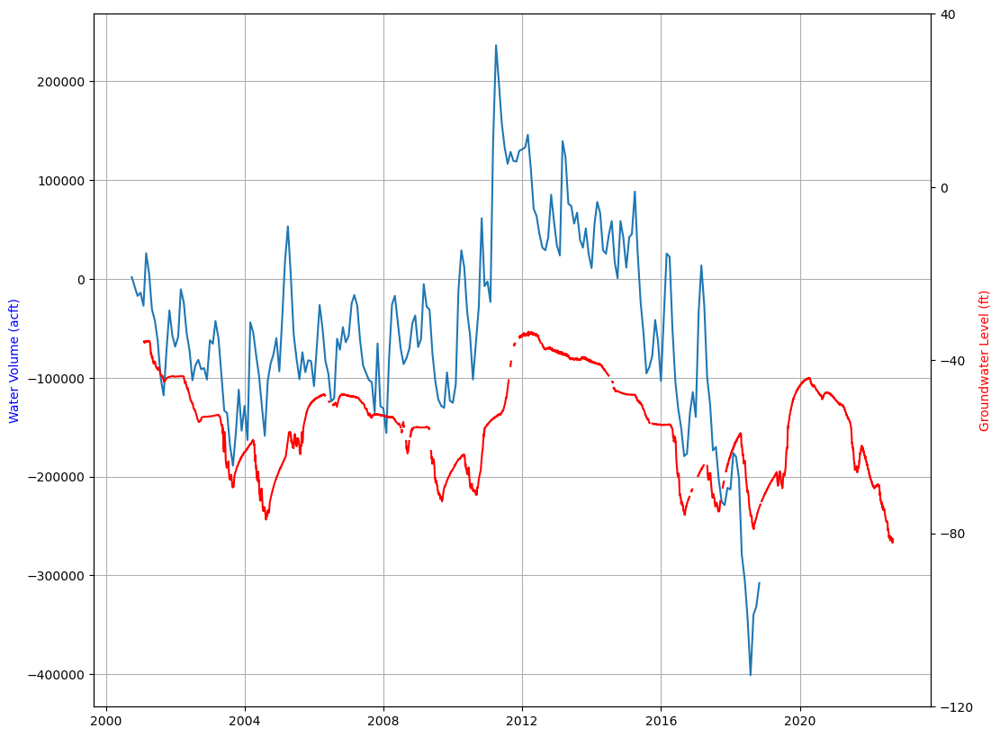

In [196]:
comb_area = combined[(~combined['WRarea'].isin(['West Desert','Oasis','Clear Lake']))]
comb_zone = comb_area[['prism_ppt','Bdrk_v_Val','ssebop_aet','pml_aet','terra_swe','terra_ppt','terra_aet','terra_soil','terra_ro']].dropna()
comb_z = comb_zone[(comb_zone.index.get_level_values(1)>pd.to_datetime('2000-09-01'))&(comb_zone.index.get_level_values(1)<pd.to_datetime('2020-10-01'))].copy(deep=True)
comb_z['dGW'] = comb_z['prism_ppt'] - (comb_z['pml_aet']*0.82 + 721) - comb_z['terra_soil'].diff() - comb_z['terra_swe'].diff()
#(comb_z['pml_aet']*0.82 + 721)+ comb_z['terra_swe'].diff()


focus = comb_z[comb_z['Bdrk_v_Val'].isin(['Basalt','Valley'])]
focusbd = comb_z[comb_z['Bdrk_v_Val'].isin(['Bdrk'])]
focusbd_dt= focusbd.groupby('date').sum(numeric_only=True)[['terra_ro','terra_swe']]
focus_dt = focus.groupby('date').sum(numeric_only=True)['dGW']
spr_flow = pd.read_csv(main_path / "Flow Monitoring/clear_lake_spring_flow_mo.csv",index_col='Date',parse_dates=True)
dfsp = pd.concat([spr_flow,focus_dt,focusbd_dt],axis=1).dropna()
dfsp['dGW_wSp'] = dfsp['dGW'] - dfsp['spring_flow_acft'] + dfsp['terra_ro']*1.20 #+ dfsp['terra_swe'].diff()


dfspcs = dfsp[['dGW_wSp']].cumsum()

plt.plot(dfspcs.index, dfspcs['dGW_wSp'], label="Change in GW Storage (acft)")
#plt.plot(dfspcs.rolling(8,center=True).mean().index, dfspcs['dGW_wSp'].rolling(8,center=True).mean(), label="Rolling Avg. Change in GW Storage (acft)")
#plt.plot(shan_wl_vol.index, shan_wl_vol['wls'],color='green')
plt.ylabel("Water Volume (acft)",color='blue')
plt.grid()
plt.twinx()
plt.plot(shandata.index, shandata['wls']*-1,color='red')
plt.yticks(np.arange(-120,80,40))
plt.ylabel("Groundwater Level (ft)",color='red')
#


([<matplotlib.axis.XTick at 0x1d1f2469460>,
 [Text(2000, 0, '2000'),
  Text(2002, 0, '2002'),
  Text(2004, 0, '2004'),
  Text(2006, 0, '2006'),
  Text(2008, 0, '2008'),
  Text(2010, 0, '2010'),
  Text(2012, 0, '2012'),
  Text(2014, 0, '2014'),
  Text(2016, 0, '2016'),
  Text(2018, 0, '2018'),
  Text(2020, 0, '2020'),
  Text(2022, 0, '2022')])

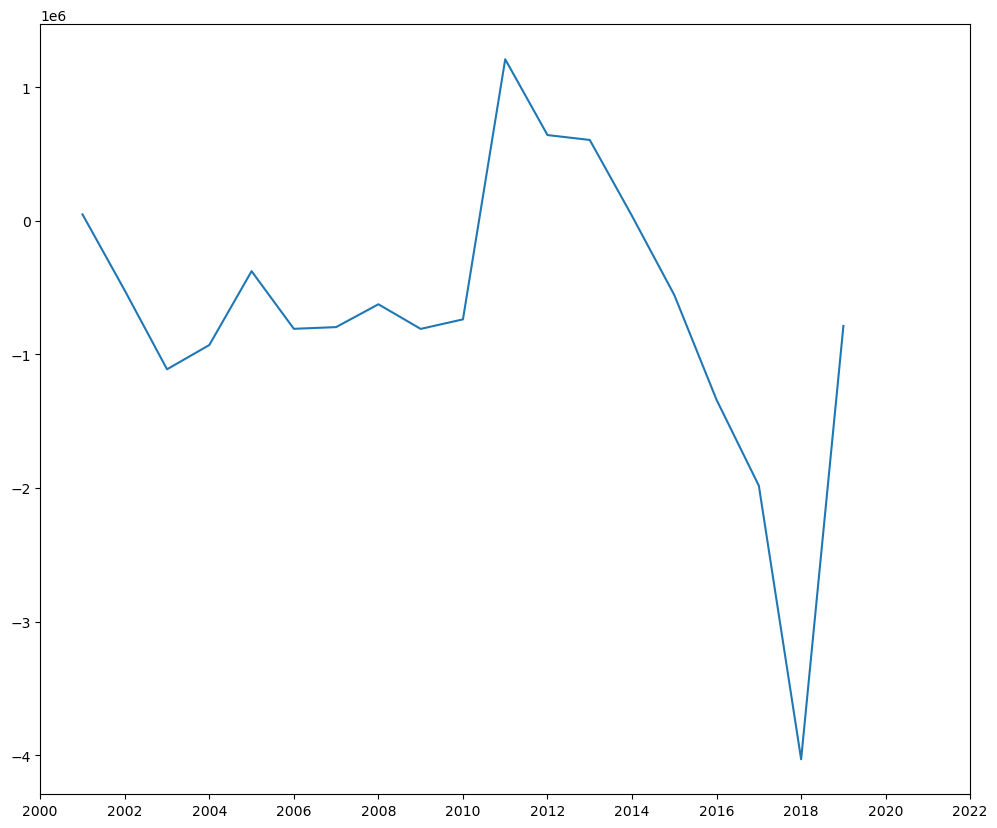

In [119]:
dfspcs['wateryear'] = dfspcs.index.shift(-9,freq='M').year+1

#dfspcs
dfspwy = dfspcs.groupby('wateryear').sum()
plt.plot(dfspwy.index, dfspwy['dGW_wSp'])
plt.xticks(range(2000,2023,2))